### Lets determine some parameters for an 'optimal start' in the parameter scans

Look at tracks in:
- DEP region
- Low E region
- Photopeak region

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import tables as tb
from matplotlib import colors 

from typing          import Optional
from typing          import Union
from typing          import Callable

import sys,os,os.path
sys.path.append("/gluster/data/next/software/IC_311024/")
sys.path.append(os.path.expanduser('~/code/eol_hsrl_python'))
#sys.path.append("/home/e78368jw/Documents/NEXT_CODE/next_misc/")
os.environ['ICTDIR']='/gluster/data/next/software/IC_311024/'


from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['mathtext.fontset'] = 'stix'
rcParams['font.family'] = 'STIXGeneral'
rcParams['figure.figsize'] = [10, 8]
rcParams['font.size'] = 22

import pandas as pd
import numpy  as np
import tables as tb

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as clrs

import IC.invisible_cities.core.core_functions                   as     coref
import IC.invisible_cities.io.dst_io                           as     dstio

from IC.invisible_cities.cities                 import beersheba as beerfun

from IC.invisible_cities.evm.event_model                          import HitCollection

from IC.invisible_cities.database.load_db       import DataSiPM

from IC.invisible_cities.evm.event_model        import Cluster, Hit
from IC.invisible_cities.types.ic_types         import xy
from IC.invisible_cities.reco.paolina_functions import voxelize_hits

from IC.invisible_cities.evm.event_model        import HitEnergy
from IC.invisible_cities.cities.beersheba          import DeconvolutionMode
from IC.invisible_cities.cities.beersheba          import CutType

from IC.invisible_cities.reco import hits_functions as hif

from IC.invisible_cities.reco.deconv_functions import deconvolve
from IC.invisible_cities.reco.deconv_functions import deconvolution_input
from IC.invisible_cities.reco.deconv_functions import InterpolationMethod

import IC.invisible_cities.io.mcinfo_io as mcio

from IC.invisible_cities.cities.components import track_blob_info_creator_extractor
from IC.invisible_cities.io.hits_io        import load_hits
from IC.invisible_cities.io.hits_io        import hits_from_df
from IC.invisible_cities.core              import system_of_units as units
from IC.invisible_cities.types.symbols     import HitEnergy
from IC.invisible_cities.evm.event_model   import HitCollection
from IC.invisible_cities.evm.event_model   import Cluster
from IC.invisible_cities.evm.event_model   import Hit
from IC.invisible_cities.types.ic_types    import xy
from IC.invisible_cities.reco.paolina_functions import voxelize_hits

from collections import defaultdict

import matplotlib.cm as cm
from matplotlib.colors import Normalize

pd.set_option('display.max_rows', 200)

import imageio
from pathlib import Path
import PSF_shenanigans.functions_psf as func


In [2]:
def plot_voxels(df, base_vsize = 12):

    xs = df.X
    ys = df.Y
    zs = df.Z
    es = df.E

    the_hits = []
    for x, y, z, e in zip(xs, ys, zs, es):
        if np.isnan(e): continue
        h = Hit(0, Cluster(0, xy(x,y), xy(0,0), 0), z, e*1000, xy(0,0))
        the_hits.append(h)
    
    voxels = voxelize_hits(the_hits,
                           np.array([base_vsize, base_vsize, base_vsize]), False)
    
    vsizex = voxels[0].size[0]
    vsizey = voxels[0].size[1]
    vsizez = voxels[0].size[2]

    min_corner_x = min(v.X for v in voxels) - vsizex/2.
    min_corner_y = min(v.Y for v in voxels) - vsizey/2.
    min_corner_z = min(v.Z for v in voxels) - vsizez/2.

    
    x = [np.round(v.X/vsizex) for v in voxels]
    y = [np.round(v.Y/vsizey) for v in voxels]
    z = [np.round(v.Z/vsizez) for v in voxels]
    e = [v.E for v in voxels]

    x_min = int(min(x))
    y_min = int(min(y))
    z_min = int(min(z))

    x_max = int(max(x))
    y_max = int(max(y))
    z_max = int(max(z))

    VOXELS = np.zeros((x_max-x_min+1, y_max-y_min+1, z_max-z_min+1))
    #print(VOXELS.shape)

    # sort through the event set the "turn on" the hit voxels
    cmap = cm.viridis
    norm = Normalize(vmin=0, vmax=max(e))

    colors = np.empty(VOXELS.shape, dtype=object)
    for q in range(0,len(z)):
        VOXELS[int(x[q])-x_min][int(y[q])-y_min][int(z[q])-z_min] = 1
        colors[int(x[q])-x_min][int(y[q])-y_min][int(z[q])-z_min] = cmap(norm(e[q]))

    # and plot everything
    fig = plt.figure(figsize=(8,8))
    ax = fig.gca(projection='3d')
    #a,b,c is spacing in mm needs an extra dim
    a,b,c = np.indices((x_max-x_min+2, y_max-y_min+2, z_max-z_min+2))
    a = a*vsizex + min_corner_x
    b = b*vsizey + min_corner_y
    c = c*vsizez + min_corner_z

    # a, b, c are the corners of the voxels
    ax.voxels(a,b,c, VOXELS, facecolors=colors , edgecolor='k',alpha=0.8)

    ax.set_xlabel('x (mm)')#,fontsize=16)
    ax.set_ylabel('y (mm)')#,fontsize=16)
    ax.set_zlabel('z (mm)')#,fontsize=16)


    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cb = fig.colorbar(sm)
    cb.set_label('Energy (keV)')

    fig.suptitle('voxelised')

    #ax.view_init(-160, 90)

    plt.show(fig)


def plotter(df, evt, cut_n_drop = True, show = True, deconv = False):
    evt_interest = df[df.event == evt]
    
    if deconv == False:
        print('======================')
        print(f'EVENT {evt}')
        print(f'Total energy {evt_interest.Ec.sum():.2f} MeV')
        print('======================\n')
        weight = 'Q'
    else:
        print('======================')
        print(f'EVENT {evt}')
        print(f'Total energy {evt_interest.E.sum():.2f} MeV')
        print('======================\n')
        weight = 'E'        
    if cut_n_drop == True:
        hits_cut = coref.timefunc(cut_sensors)(evt_interest.copy())
        hits_drop = coref.timefunc(drop_sensors)(hits_cut.copy())
    else:
        hits_drop = evt_interest
    pitch = 15.55
    # then applying transformations to convert to 'SiPM outputs'
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))


    xx = np.arange(hits_drop.X.min(), hits_drop.X.max() + pitch, pitch)
    yy = np.arange(hits_drop.Y.min(), hits_drop.Y.max() + pitch, pitch)
    zz = hits_drop.Z.unique()

    axes[0].hist2d(hits_drop.X, hits_drop.Y, bins=[xx, yy], weights=hits_drop[weight], cmin=0.0001);
    axes[0].set_xlabel('X (mm)');
    axes[0].set_ylabel('Y (mm)');

    axes[1].hist2d(hits_drop.X, hits_drop.Z, bins=[xx, zz], weights=hits_drop[weight], cmin=0.0001);
    axes[1].set_xlabel('X (mm)');
    axes[1].set_ylabel('Z (mm)');


    axes[2].hist2d(hits_drop.Y, hits_drop.Z, bins=[yy, zz], weights=hits_drop[weight], cmin=0.0001);
    axes[2].set_xlabel('Y (mm)');
    axes[2].set_ylabel('Z (mm)');

    fig.suptitle('Processed Sensors Signal_' + str(evt) + ' - rebin = 4', fontsize=30)
    #plt.savefig(f'plots/hits_{evt}.pdf')
    if show == True:
        plt.show(fig)



def plotter_3d(df, evt, cut_n_drop = True, show = True, clrbar = True, alpha = 0.65, min_s = 1, max_s = 15):
    '''
    evt_interest - df
    evt          - event number

    '''
    # plot
    evt_interest = df[df.event == evt]

    if cut_n_drop:
        hits_cut = coref.timefunc(cut_sensors)(evt_interest.copy())
        hits_drop = coref.timefunc(drop_sensors)(hits_cut.copy())
    else:
        hits_drop = evt_interest.copy(deep = True)
    
    xt = hits_drop.X
    yt = hits_drop.Y
    zt = hits_drop.Z
    et = hits_drop.E
    
    fig = plt.figure()
    #fig.suptitle('3D post deconvolution ' + str(evt), fontsize=30)
    fig.suptitle(f'Electron candidate event {evt}', fontsize=30)
    ax = fig.add_subplot(111, projection='3d')
    
    
    
    ets = et > 0 # eliminate small things for measurement
    
    max_val = max(et[ets])
    scaled_clipped = [max((v / max_val) * max_s, min_s) for v in et[ets]]

    #p = ax.scatter(x[em], y[em], z[em], c=e[em], alpha=0.3, cmap='viridis')
    #plt_sphere([(-track.blob2_x.values[0], -track.blob2_y.values[0], -track.blob2_z.values[0])], [blobR])
    p = ax.scatter([xt[ets]], yt[ets], zt[ets], c=et[ets], alpha=alpha, cmap='viridis', s = scaled_clipped)#, s = et[ets])
    #q = ax.scatter(xt, yt, zt, alpha = 0.3, color = 'red')
    
    # overlay the blobs and their radii
    if clrbar:
        cb = fig.colorbar(p, ax=ax)
        cb.set_label('Energy (keV)')
    
    
    ax.set_xlabel('\nx (mm)')
    ax.set_ylabel('\ny (mm)')
    ax.set_zlabel('\nz (mm)')
    
    #ax.set_xlim([-300, -100])
    #ax.set_ylim([250, 450])
    #ax.set_zlim([1600, 1800])
    #ax.view_init(20, -150)
    
    #plt.savefig(f'gif_making/deconv/angle_{i}.png')
    #plt.savefig(f'plots/hits_3d_{evt}.pdf')
    if show:
        plt.show()

    return hits_drop


In [3]:
twoDS_PSF_PATH = '/gluster/data/next/files/TOPOLOGY_John/N100_data/14914/prod_psf/eutropia/merged_psfs/downsampled_psf_2point5mm.psf'
datatype = 'data'
detector_db = '/gluster/data/next/software/IC_311024/IC/invisible_cities/database/localdb.NEXT100DB.sqlite3'
run_number = 15107

In [4]:
def gen_deconv_params(psf_path,
                      _q_cut,
                      _e_cut,
                      _n_iterations,
                      _iteration_tol = 1e-9,
                      _binning = 1,
                      _cut_type = CutType.rel):
    
    return dict(
    q_cut           = _q_cut, #5 for 6mm  - 5 for 6mm
    drop_dist       = [16, 16],
    psf_fname       = psf_path,     
    e_cut           = _e_cut, #15 for 6mm  - 15 for 6mm
    n_iterations    = _n_iterations, #150 for 6mm  - 150 for 6mm
    iteration_tol   = _iteration_tol,
    sample_width    = [15.55, 15.55],
    bin_size        = [ _binning,  _binning],
    diffusion       = (1., 0.2),
    n_dim           = 2,
    deconv_mode     = DeconvolutionMode.joint,
    satellite_params = dict(satellite_start_iter = 100,
                            satellite_max_size   = 25,
                            e_cut                = 0.9,
                            cut_type             = CutType.rel),
    energy_type     = HitEnergy.Ec,
    cut_type        = _cut_type)
    # inter_method    = InterpolationMethod.cubic)
    #satellite_params = dict(satellite_start_iter = 75,
    #                        satellite_max_size   = 3,
    #                        e_cut                = 0.2,
    #                        cut_type             = CutType.rel)


In [5]:
# lets set some real default parameters for cutting
default_deconv_params = gen_deconv_params(twoDS_PSF_PATH,
                                          _q_cut = 10,
                                          _e_cut = 0.2,
                                          _n_iterations = 20,
                                          _iteration_tol = 1e-9,
                                          _binning = 2.5,
                                          _cut_type = CutType.rel)

# Couple of functions used in beersheba. and we dont care which params they come from
# They also need to be defined for the plotter (stupid)
cut_sensors       = beerfun.cut_over_Q   (default_deconv_params['q_cut'    ], ['E', 'Ec'])
drop_sensors      = beerfun.drop_isolated(default_deconv_params['drop_dist'], ['E', 'Ec'])


# First lets select an event:

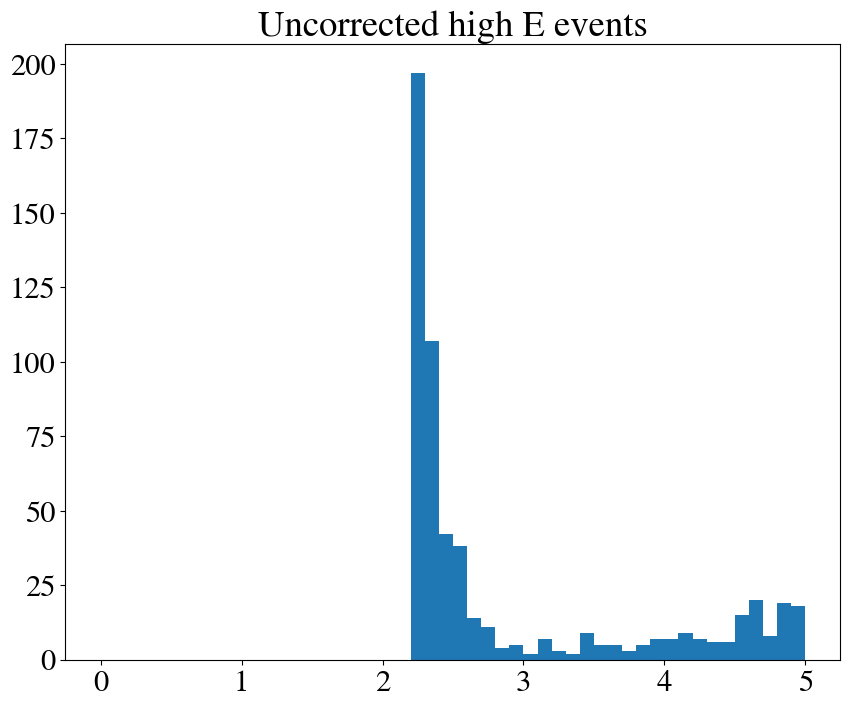

In [5]:
# POST COMPTON EDGE
soph_file = 'files/15107_energy_split/corr_post_CE.h5'
post_CE = pd.read_hdf(soph_file, key = 'RECO/Events')

plt.hist(post_CE.groupby('event').Ec.sum(), bins = 50, range = [0, 5])
plt.title('Uncorrected high E events')
plt.show()

,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep
3348115,654754,1.742944e+09,0,52.969134,-93.402153,1,-451.525,-93.675,0.0,0.0,569.117375,5.034449,22.698537,-1.0,0.000144,-1,-1.0
3348116,654754,1.742944e+09,0,52.969134,-93.402153,1,-451.525,-32.475,0.0,0.0,569.117375,5.555621,25.048314,-1.0,0.000157,-1,-1.0
3348117,654754,1.742944e+09,0,52.969134,-93.402153,1,-65.775,-278.775,0.0,0.0,569.117375,6.461748,29.133719,-1.0,0.000148,-1,-1.0
3348118,654754,1.742944e+09,0,52.969134,-93.402153,1,351.075,-185.975,0.0,0.0,569.117375,5.291257,23.856392,-1.0,0.000130,-1,-1.0
3348119,654754,1.742944e+09,0,52.969134,-93.402153,1,-34.675,-202.025,0.0,0.0,572.565625,5.184258,101.972949,-1.0,0.000497,-1,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3351243,654754,1.742944e+09,0,52.969134,-93.402153,1,335.525,415.475,0.0,0.0,759.797500,6.233183,8.771492,-1.0,NaN,-1,-1.0
3351244,654754,1.742944e+09,0,52.969134,-93.402153,1,-281.475,-62.575,0.0,0.0,763.822125,5.054821,15.384213,-1.0,0.000077,-1,-1.0
3351245,654754,1.742944e+09,0,52.969134,-93.402153,1,-297.025,29.725,0.0,0.0,763.822125,5.051856,15.375189,-1.0,0.000077,-1,-1.0
3351246,654754,1.742944e+09,0,52.969134,-93.402153,1,-50.225,230.375,0.0,0.0,767.494500,5.031432,-2.117011,-1.0,-0.000010,-1,-1.0


PRE Q_CUT
EVENT 654754
Total energy 2.40 MeV



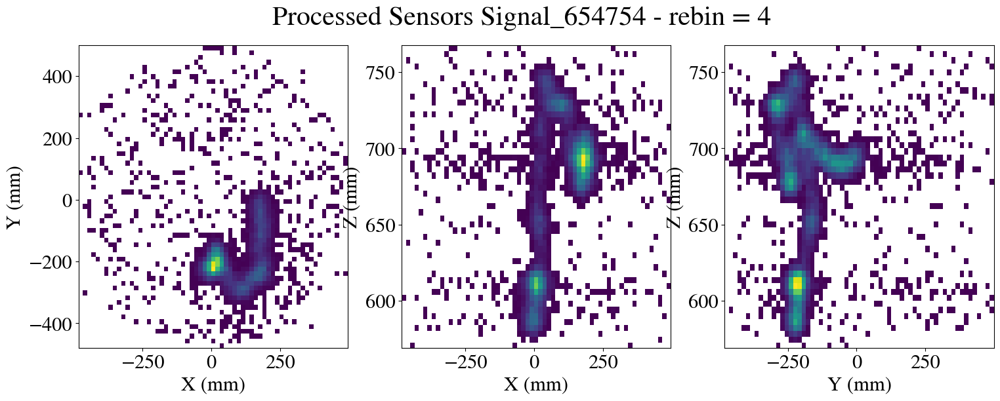

POST Q_CUT
EVENT 654754
Total energy 2.40 MeV

Time spent in cut_over_Q: 0.022388696670532227 s
Time spent in drop_isolated: 0.06511998176574707 s


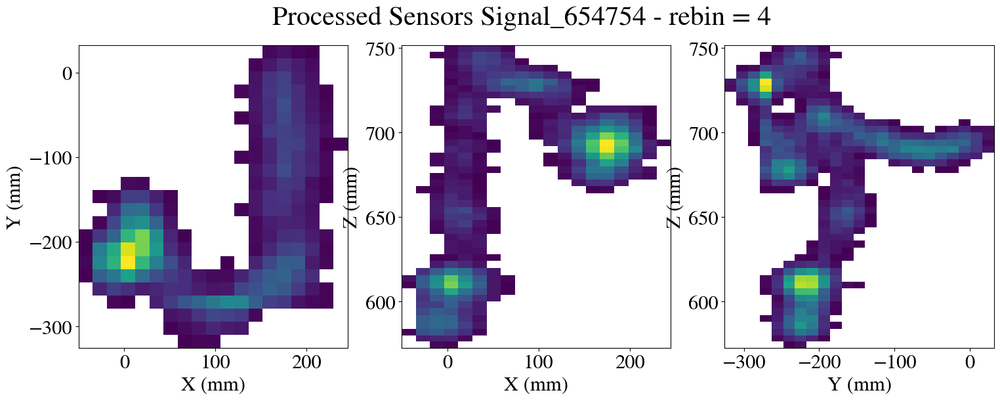

Time spent in cut_over_Q: 0.013951539993286133 s
Time spent in drop_isolated: 0.04737687110900879 s


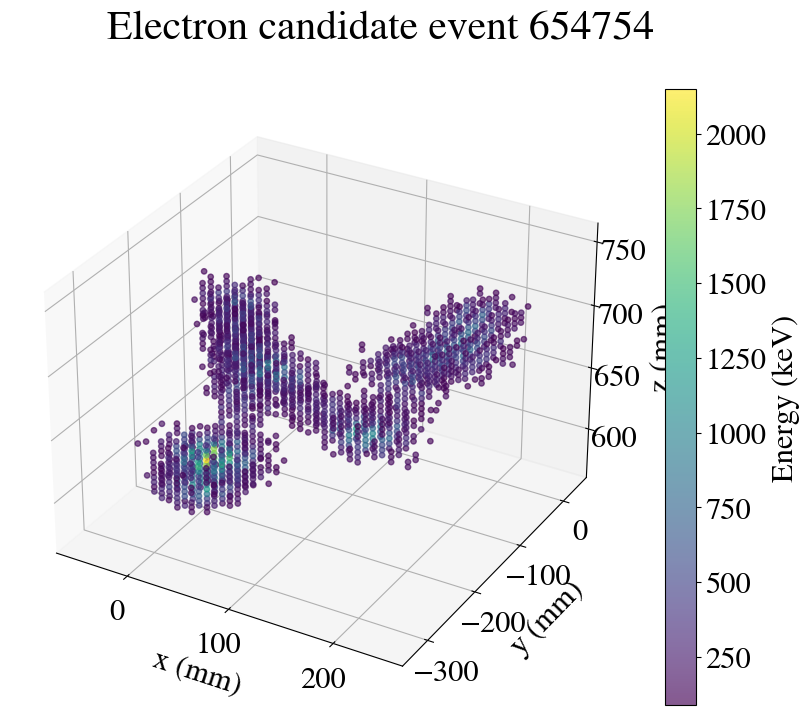

,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep
0,654754,1.742944e+09,0,52.969134,-93.402153,1,-3.575,-233.125,0.0,0.0,572.565625,12.383667,299.165511,-1.0,0.001527,-1,-1.0
1,654754,1.742944e+09,0,52.969134,-93.402153,1,-3.575,-217.575,0.0,0.0,572.565625,16.501053,398.633612,-1.0,0.001991,-1,-1.0
2,654754,1.742944e+09,0,52.969134,-93.402153,1,10.975,-217.575,0.0,0.0,572.565625,13.928800,336.492935,-1.0,0.001692,-1,-1.0
3,654754,1.742944e+09,0,52.969134,-93.402153,1,-3.575,-247.675,0.0,0.0,576.336500,10.755924,160.969323,-1.0,0.000822,-1,-1.0
4,654754,1.742944e+09,0,52.969134,-93.402153,1,-34.675,-233.125,0.0,0.0,576.336500,15.690440,234.817528,-1.0,0.001184,-1,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1610,654754,1.742944e+09,0,52.969134,-93.402153,1,57.625,-217.575,0.0,0.0,747.712375,36.452976,339.722087,-1.0,0.001669,-1,-1.0
1611,654754,1.742944e+09,0,52.969134,-93.402153,1,57.625,-202.025,0.0,0.0,747.712375,13.848837,129.063694,-1.0,0.000627,-1,-1.0
1612,654754,1.742944e+09,0,52.969134,-93.402153,1,73.175,-233.125,0.0,0.0,747.712375,12.883119,120.063720,-1.0,0.000602,-1,-1.0
1613,654754,1.742944e+09,0,52.969134,-93.402153,1,73.175,-217.575,0.0,0.0,747.712375,10.837831,101.002738,-1.0,0.000496,-1,-1.0


In [23]:
# select event that we know is decent
evt = 654754
evt_interest = post_CE[post_CE.event == evt]
display(evt_interest)
print("PRE Q_CUT")
plotter(post_CE, evt, cut_n_drop=False)
print("POST Q_CUT")
plotter(post_CE, evt) # cut
plotter_3d(post_CE, evt)

In [ ]:
#cut and drop
hits_cut = coref.timefunc(cut_sensors)(evt_interest.copy())
hits_drop = coref.timefunc(drop_sensors)(hits_cut.copy())

### fill array with differing dataframes, each with differing n_iterations

In [42]:
reco_niter = {}

n_iterations_list = [5,8, 10, 12, 15, 17, 20, 23, 25, 28, 30]
e_cut_list = [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3]

for iterations in n_iterations_list:
    deconv_params = gen_deconv_params(twoDS_PSF_PATH,
                                          _q_cut = 10,
                                          _e_cut = 0.2,
                                          _n_iterations = iterations,
                                          _iteration_tol = 1e-9,
                                          _binning = 2.5,
                                          _cut_type = CutType.rel)
    # line that separates the q_cut and drop_dist as they're not in the iterator for beersheba
    deconv_params_   = {k : v for k, v in deconv_params.items() if k not in ['q_cut', 'drop_dist']}

    # define the cuts    
    cut_sensors       = beerfun.cut_over_Q   (deconv_params['q_cut'    ], ['E', 'Ec'])
    drop_sensors      = beerfun.drop_isolated(deconv_params['drop_dist'], ['E', 'Ec'])

    #cut and drop
    hits_cut = coref.timefunc(cut_sensors)(evt_interest.copy(deep=True)) # deep to avoid silly things
    hits_drop = coref.timefunc(drop_sensors)(hits_cut.copy())


    deconvolver_ = beerfun.deconvolve_signal(DataSiPM(detector_db, run_number), **deconv_params_)

    print("\n======================")
    print(f"{deconv_params_['n_iterations']} iterations")
    reco_niter[iterations] = (coref.timefunc(deconvolver_)(hits_drop.copy()))

Time spent in cut_over_Q: 0.03446078300476074 s
Time spent in drop_isolated: 0.10420680046081543 s



5 iterations
Time spent in apply_deconvolution: 6.38638973236084 s
Time spent in cut_over_Q: 0.011167526245117188 s
Time spent in drop_isolated: 0.03698301315307617 s

8 iterations
Time spent in apply_deconvolution: 8.180054664611816 s
Time spent in cut_over_Q: 0.011587142944335938 s
Time spent in drop_isolated: 0.04044699668884277 s

10 iterations
Time spent in apply_deconvolution: 11.070701122283936 s
Time spent in cut_over_Q: 0.015782594680786133 s
Time spent in drop_isolated: 0.05086326599121094 s

12 iterations
Time spent in apply_deconvolution: 13.216509580612183 s
Time spent in cut_over_Q: 0.012611865997314453 s
Time spent in drop_isolated: 0.039649009704589844 s

15 iterations
Time spent in apply_deconvolution: 13.588123798370361 s
Time spent in cut_over_Q: 0.011707305908203125 s
Time spent in drop_isolated: 0.04002666473388672 s

17 iterations
Time spent in apply_deconvolution: 15.94061827659607 s
Time spent in cut_over_Q: 0.011648416519165039 s
Time spent in drop_isolated: 0

In [33]:
display(reco_niter[5])

,event,npeak,X,Y,Z,E,Xpeak,Ypeak
0,654754,0,-13.875,-228.675,572.565625,0.000009,52.969134,-93.402153
1,654754,0,-13.875,-226.175,572.565625,0.000010,52.969134,-93.402153
2,654754,0,-13.875,-223.675,572.565625,0.000011,52.969134,-93.402153
3,654754,0,-13.875,-221.175,572.565625,0.000011,52.969134,-93.402153
4,654754,0,-13.875,-218.675,572.565625,0.000010,52.969134,-93.402153
...,...,...,...,...,...,...,...,...
24950,654754,0,38.625,-201.175,751.597125,0.000006,52.969134,-93.402153
24951,654754,0,38.625,-198.675,751.597125,0.000006,52.969134,-93.402153
24952,654754,0,38.625,-196.175,751.597125,0.000005,52.969134,-93.402153
24953,654754,0,38.625,-193.675,751.597125,0.000004,52.969134,-93.402153


EVENT 654754
Total energy 2.40 MeV

Time spent in cut_over_Q: 0.016542434692382812 s


Time spent in drop_isolated: 0.05058884620666504 s


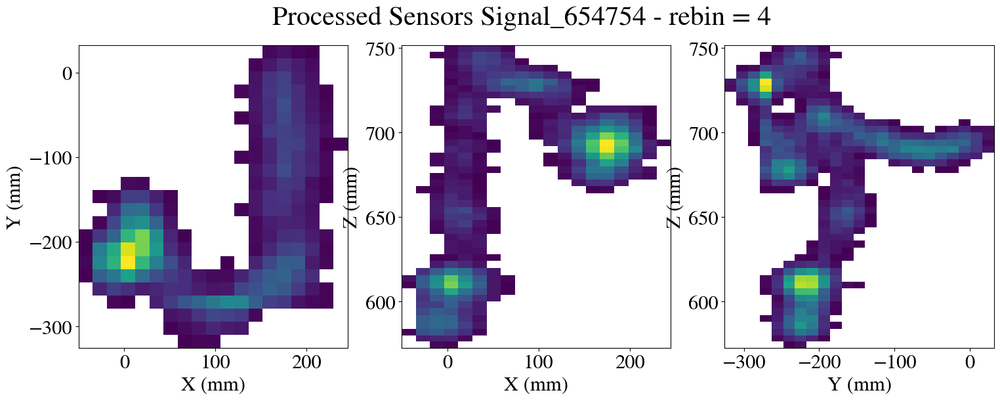

EVENT 654754
Total energy 2.40 MeV



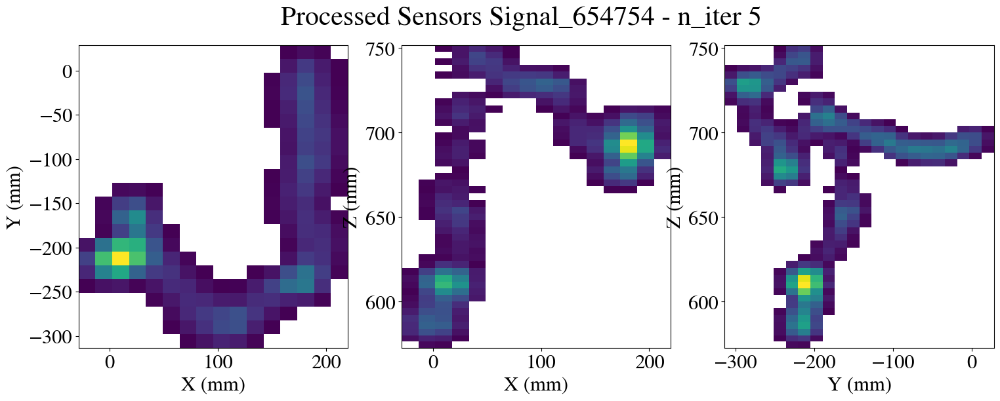

EVENT 654754
Total energy 2.40 MeV



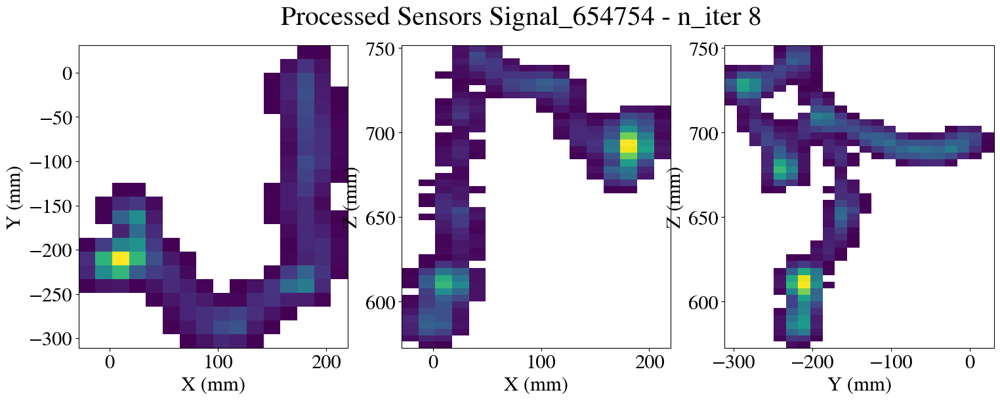

EVENT 654754
Total energy 2.40 MeV



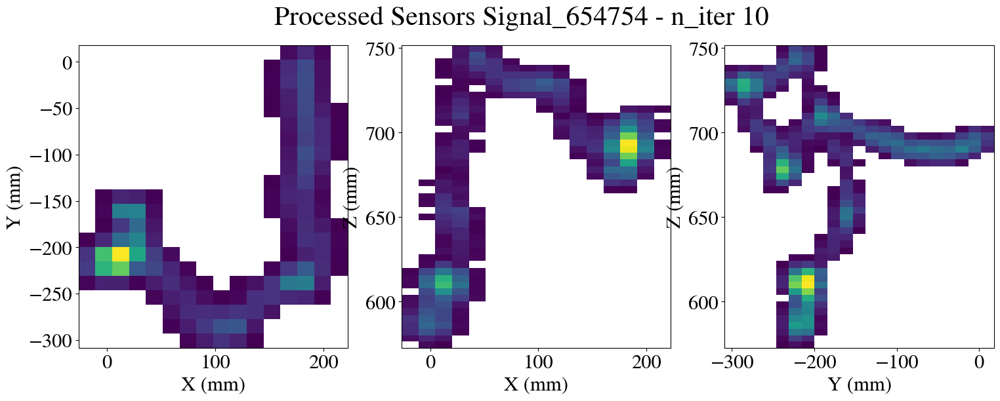

EVENT 654754
Total energy 2.40 MeV



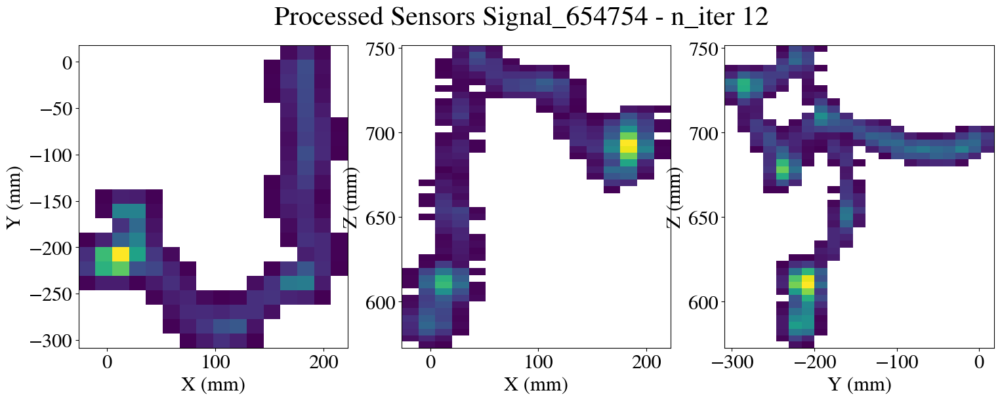

EVENT 654754
Total energy 2.40 MeV



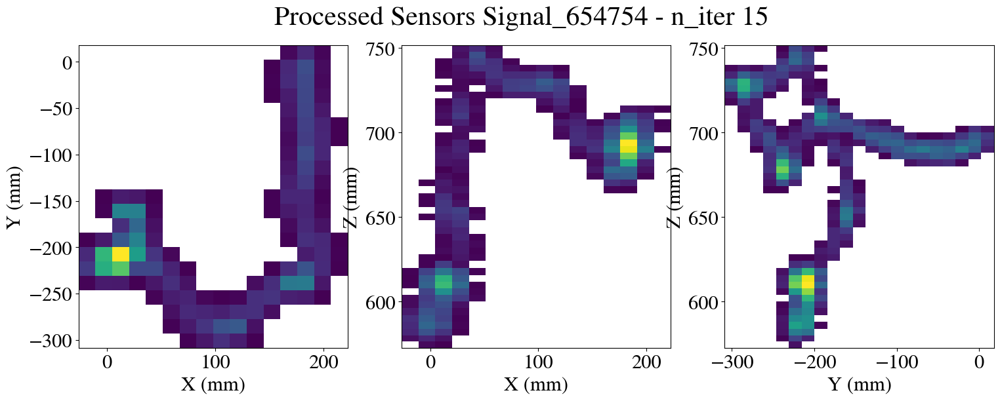

EVENT 654754
Total energy 2.40 MeV



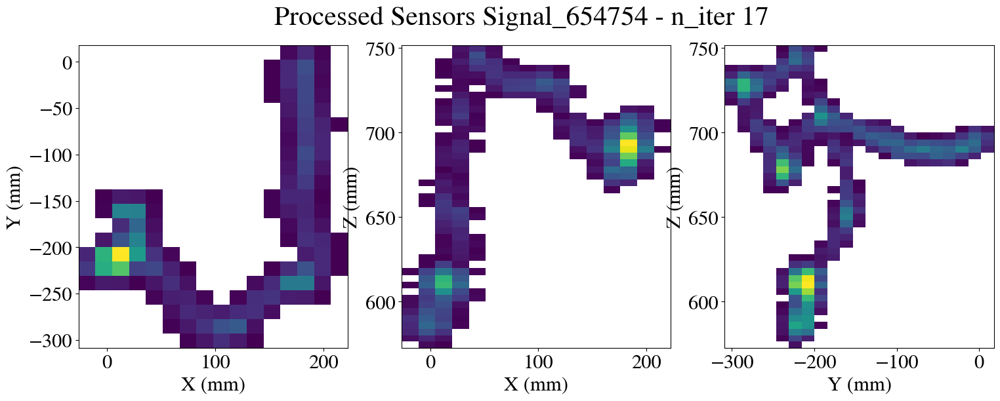

EVENT 654754
Total energy 2.40 MeV



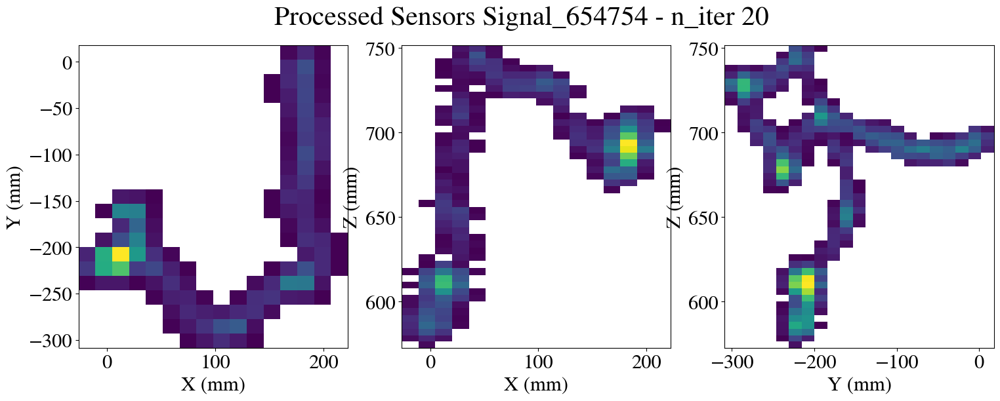

EVENT 654754
Total energy 2.40 MeV



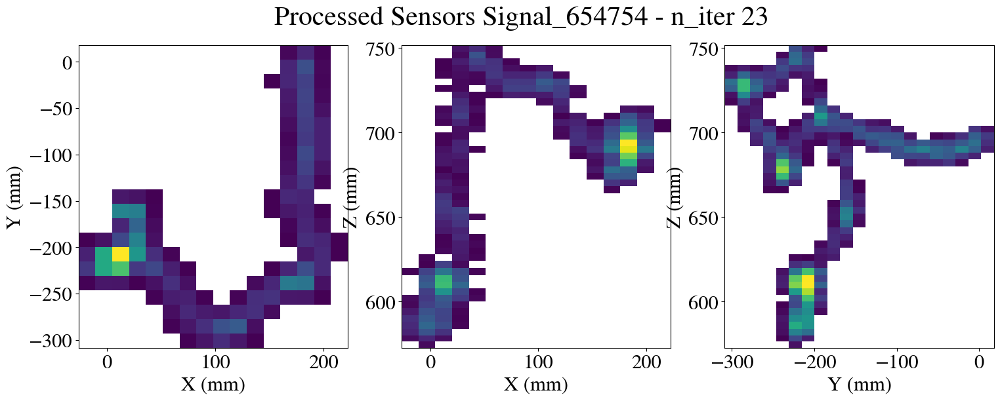

EVENT 654754
Total energy 2.40 MeV



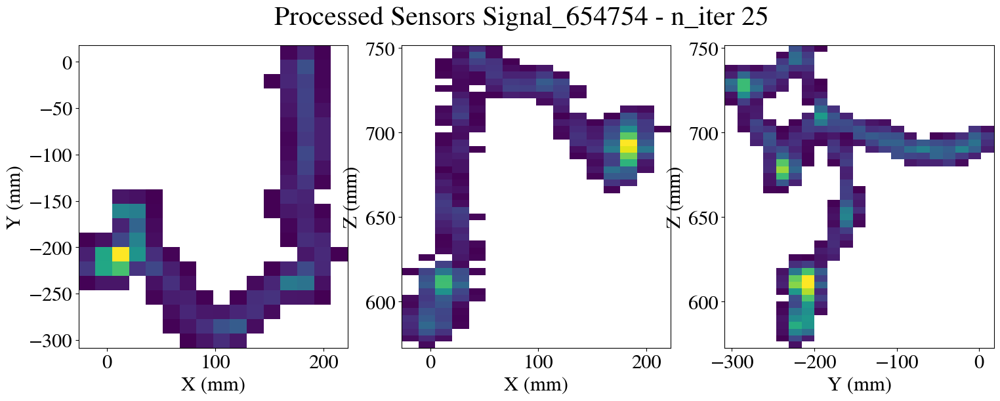

EVENT 654754
Total energy 2.40 MeV



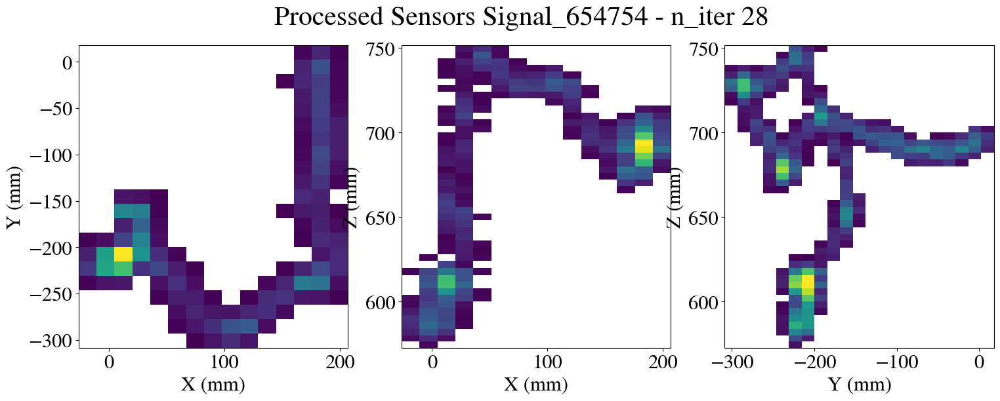

EVENT 654754
Total energy 2.40 MeV



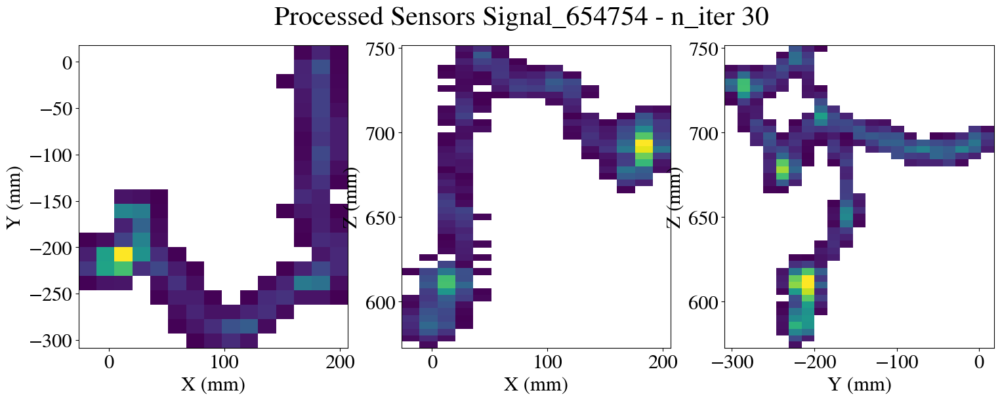

In [43]:
# make path for plot
Path(f'gif/iter/{evt}').mkdir(parents = True, exist_ok = True)

plotter(post_CE, evt, show = False)
plt.savefig(f'gif/iter/{evt}/{evt}_0_iter.png')
plt.show()
# plot em all
for key in reco_niter:
    hits = reco_niter[key]
    
    plotter(hits, evt, cut_n_drop=False, show = False, deconv = True)
    plt.suptitle(f'Processed Sensors Signal_{evt} - n_iter {key}', fontsize=30)
    plt.savefig(f'gif/iter/{evt}/{evt}_{key}_iter.png')
    plt.show()

# make it a gif

In [47]:
files = [f for f in os.listdir(f'gif/iter/{evt}/') if os.path.isfile(os.path.join(f'gif/iter/{evt}/', f))]
#sort files in a human manner
files.sort(key=func.alphanum_key)
images = []
for filename in files:
    images.append(imageio.imread(f'gif/iter/{evt}/' + filename))

print("Creating gif...")
gif_name = f'plots/n_iter/{evt}_niter.gif'
imageio.mimsave(gif_name, images, loop = 0, fps = 3)

/tmp/ipykernel_1339722/3905870095.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(f'gif/iter/{evt}/' + filename))


Creating gif...


In [66]:
Path(f'gif/rotate/{evt}').mkdir(parents = True, exist_ok = True)

n_iter = 12

rotation_space = np.linspace(0, 359, 180, endpoint = True)

for i in rotation_space:
    plotter_3d(reco_niter[n_iter], evt, cut_n_drop = False, show = False, clrbar = False)
    ax = plt.gca()
    ax.view_init(20, -i)
    plt.savefig(f'gif/rotate/{evt}/evt_{evt}_{i}.png')
    plt.close()

In [67]:
files = [f for f in os.listdir(f'gif/rotate/{evt}/') if os.path.isfile(os.path.join(f'gif/rotate/{evt}/', f))]
#sort files in a human manner
files.sort(key=func.alphanum_key)
images = []
for filename in files:
    images.append(imageio.imread(f'gif/rotate/{evt}/' + filename))

print("Creating gif...")
gif_name = f'plots/n_iter/rotating_track_evt_{evt}_niter_{n_iter}.gif'
imageio.mimsave(gif_name, images, loop = 0, fps = 20)


/tmp/ipykernel_1339722/163316777.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(f'gif/rotate/{evt}/' + filename))


Creating gif...


/tmp/ipykernel_1339722/51559904.py:53: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


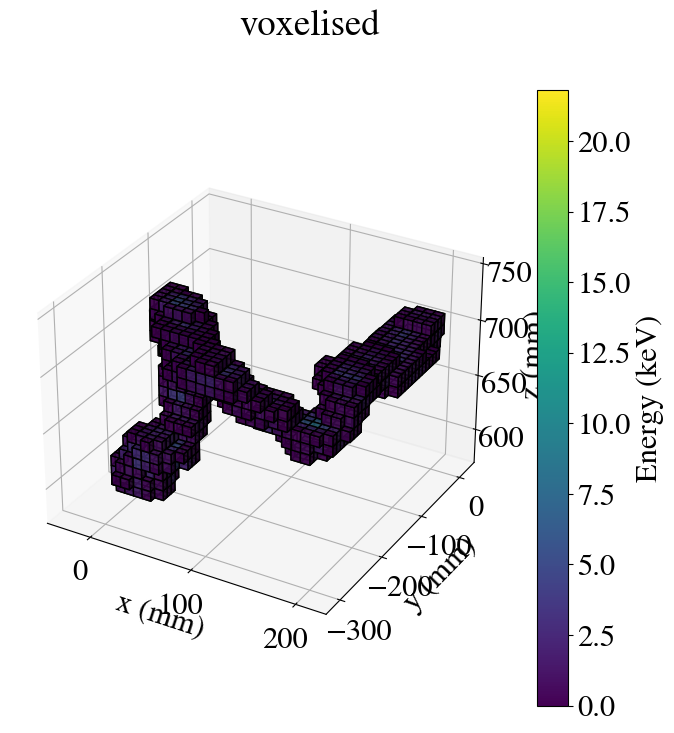

In [69]:
plot_voxels(reco_niter[n_iter], base_vsize = 9)

# Now try e_cut

In [ ]:
# make path for plot
Path(f'gif/iter/{evt}').mkdir(parents = True, exist_ok = True)

plotter(post_CE, evt, show = False)
plt.savefig(f'gif/iter/{evt}/{evt}_0_iter.png')
plt.show()
# plot em all
for key in reco_niter:
    hits = reco_niter[key]
    
    plotter(hits, evt, cut_n_drop=False, show = False, deconv = True)
    plt.suptitle(f'Processed Sensors Signal_{evt} - n_iter {key}', fontsize=30)
    plt.savefig(f'gif/iter/{evt}/{evt}_{key}_iter.png')
    plt.show()

In [73]:
reco_ecut = {}


e_cut_list = [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3]

for e_cuts in e_cut_list:
    deconv_params = gen_deconv_params(twoDS_PSF_PATH,
                                          _q_cut = 10,
                                          _e_cut = e_cuts,
                                          _n_iterations = 12,
                                          _iteration_tol = 1e-9,
                                          _binning = 2.5,
                                          _cut_type = CutType.rel)
    # line that separates the q_cut and drop_dist as they're not in the iterator for beersheba
    deconv_params_   = {k : v for k, v in deconv_params.items() if k not in ['q_cut', 'drop_dist']}

    # define the cuts    
    cut_sensors       = beerfun.cut_over_Q   (deconv_params['q_cut'    ], ['E', 'Ec'])
    drop_sensors      = beerfun.drop_isolated(deconv_params['drop_dist'], ['E', 'Ec'])

    #cut and drop
    hits_cut = coref.timefunc(cut_sensors)(evt_interest.copy(deep=True)) # deep to avoid silly things
    hits_drop = coref.timefunc(drop_sensors)(hits_cut.copy())


    deconvolver_ = beerfun.deconvolve_signal(DataSiPM(detector_db, run_number), **deconv_params_)

    print("\n======================")
    print(f"{deconv_params_['e_cut']*100} % e_cut")
    reco_ecut[e_cuts] = (coref.timefunc(deconvolver_)(hits_drop.copy()))

Time spent in cut_over_Q: 0.026041746139526367 s
Time spent in drop_isolated: 0.0866844654083252 s



0.0 % e_cut
Time spent in apply_deconvolution: 11.915470361709595 s
Time spent in cut_over_Q: 0.013426542282104492 s
Time spent in drop_isolated: 0.045958757400512695 s

5.0 % e_cut
Time spent in apply_deconvolution: 11.654893159866333 s
Time spent in cut_over_Q: 0.01282191276550293 s
Time spent in drop_isolated: 0.05064225196838379 s

10.0 % e_cut
Time spent in apply_deconvolution: 12.21930456161499 s
Time spent in cut_over_Q: 0.012696981430053711 s
Time spent in drop_isolated: 0.05255126953125 s

15.0 % e_cut
Time spent in apply_deconvolution: 12.892951488494873 s
Time spent in cut_over_Q: 0.013329505920410156 s
Time spent in drop_isolated: 0.05236625671386719 s

20.0 % e_cut
Time spent in apply_deconvolution: 11.97107219696045 s
Time spent in cut_over_Q: 0.013059139251708984 s
Time spent in drop_isolated: 0.05331158638000488 s

25.0 % e_cut
Time spent in apply_deconvolution: 13.651672601699829 s
Time spent in cut_over_Q: 0.011571407318115234 s
Time spent in drop_isolated: 0.0476970

EVENT 654754
Total energy 2.40 MeV

Time spent in cut_over_Q: 0.015574932098388672 s
Time spent in drop_isolated: 0.051697731018066406 s


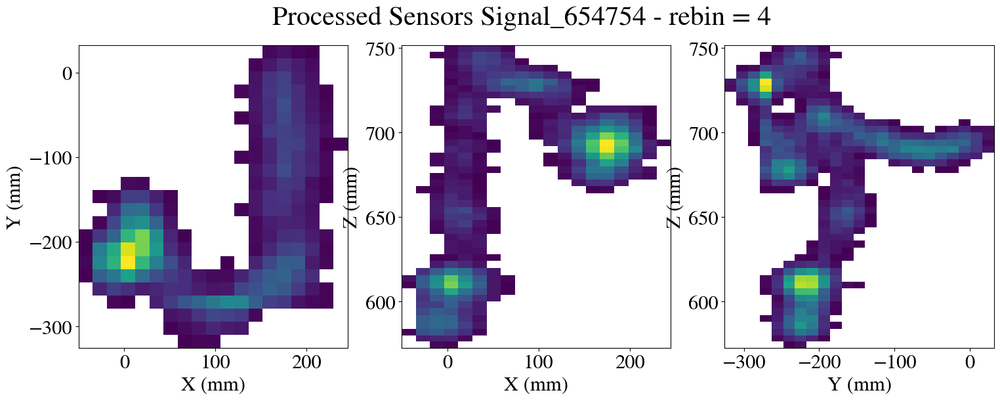

EVENT 654754
Total energy 2.40 MeV



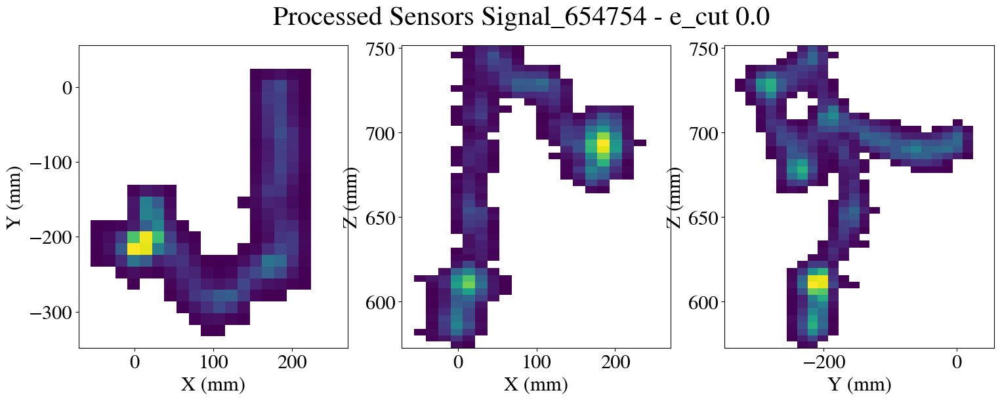

EVENT 654754
Total energy 2.40 MeV



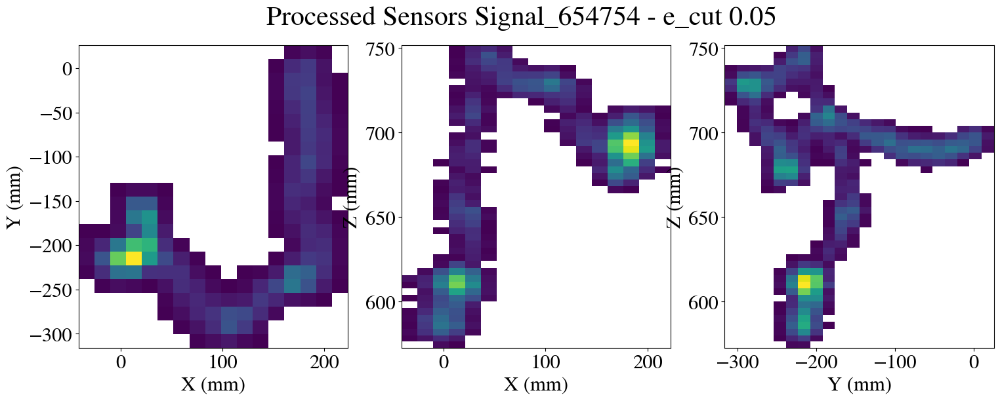

EVENT 654754
Total energy 2.40 MeV



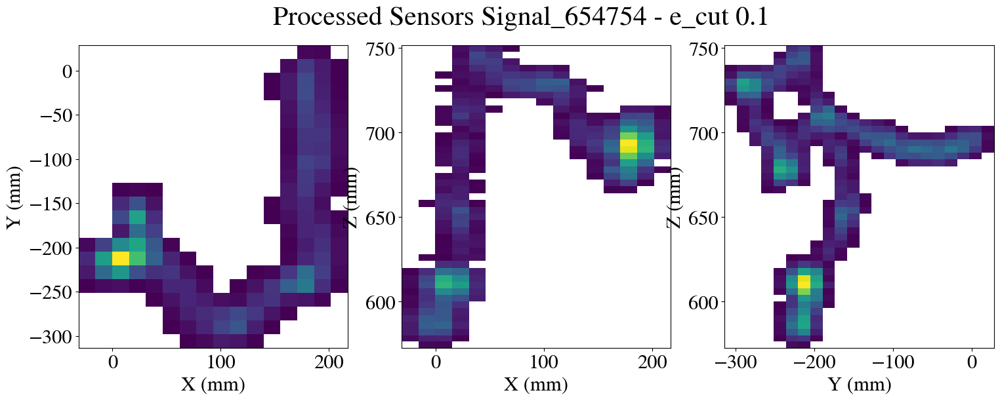

EVENT 654754
Total energy 2.40 MeV



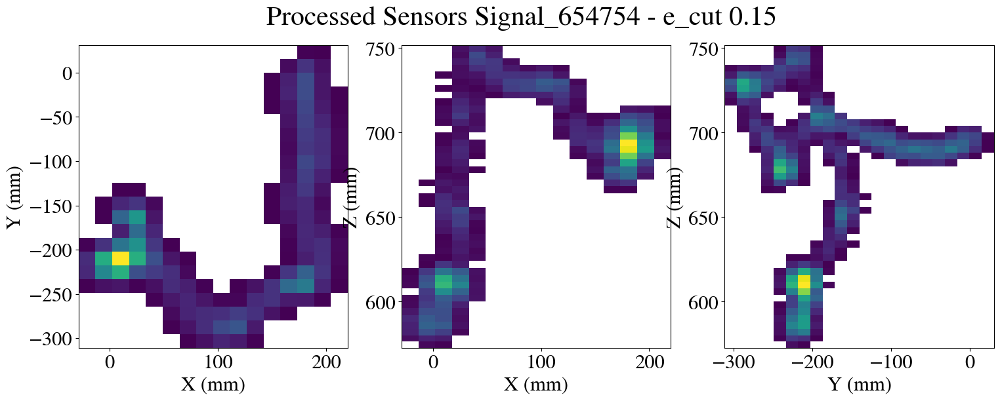

EVENT 654754
Total energy 2.40 MeV



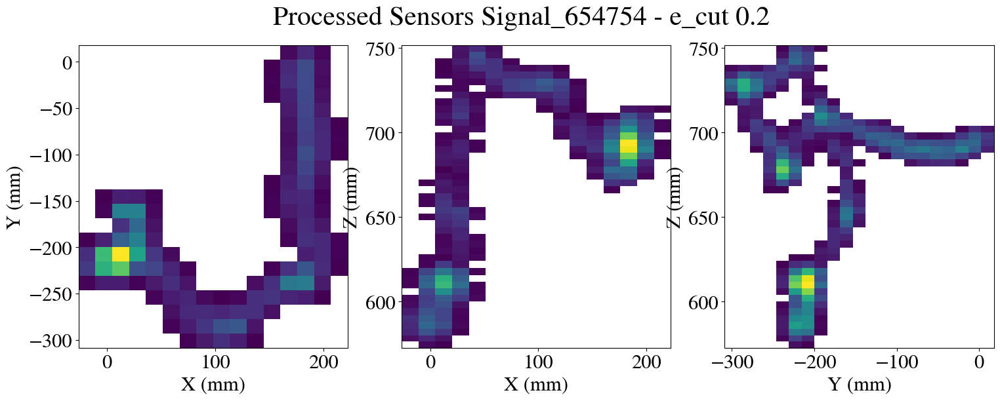

EVENT 654754
Total energy 2.40 MeV



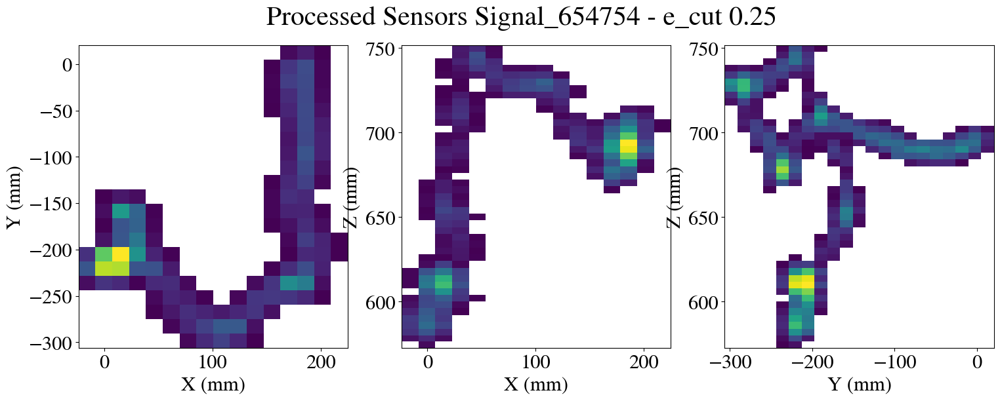

EVENT 654754
Total energy 2.40 MeV



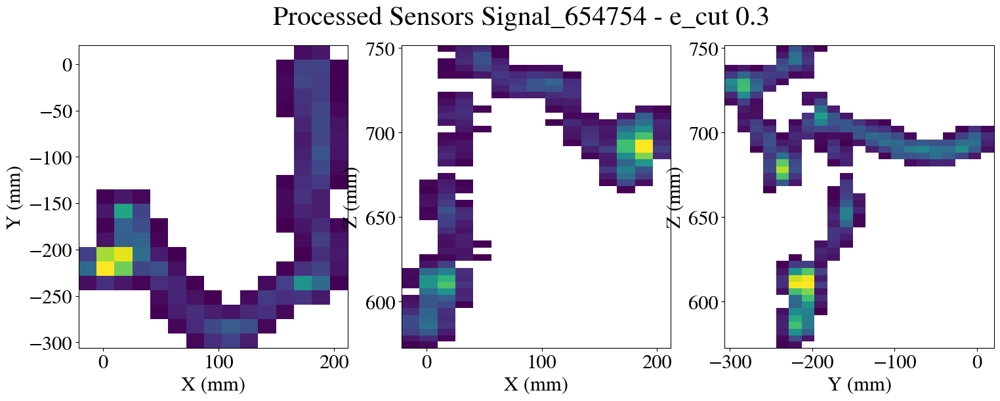

In [74]:
# make path for plot
Path(f'gif/e_cut/{evt}').mkdir(parents = True, exist_ok = True)

plotter(post_CE, evt, show = False)
plt.savefig(f'gif/e_cut/{evt}/{evt}_0_iter.png')
plt.show()
# plot em all
for key in reco_ecut:
    hits = reco_ecut[key]
    
    plotter(hits, evt, cut_n_drop=False, show = False, deconv = True)
    plt.suptitle(f'Processed Sensors Signal_{evt} - e_cut {key}', fontsize=30)
    plt.savefig(f'gif/e_cut/{evt}/{evt}_{key}_e_cut.png')
    plt.show()

# make it a gif

In [77]:
files = [f for f in os.listdir(f'gif/e_cut/{evt}/') if os.path.isfile(os.path.join(f'gif/e_cut/{evt}/', f))]
#sort files in a human manner
files.sort(key=func.alphanum_key)
images = []
for filename in files:
    images.append(imageio.imread(f'gif/e_cut/{evt}/' + filename))

print("Creating gif...")
gif_name = f'plots/e_cut/{evt}_e_cut.gif'
imageio.mimsave(gif_name, images, loop = 0, fps = 2)

/tmp/ipykernel_1339722/3518173800.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(f'gif/e_cut/{evt}/' + filename))


Creating gif...


# Grab a DEP event

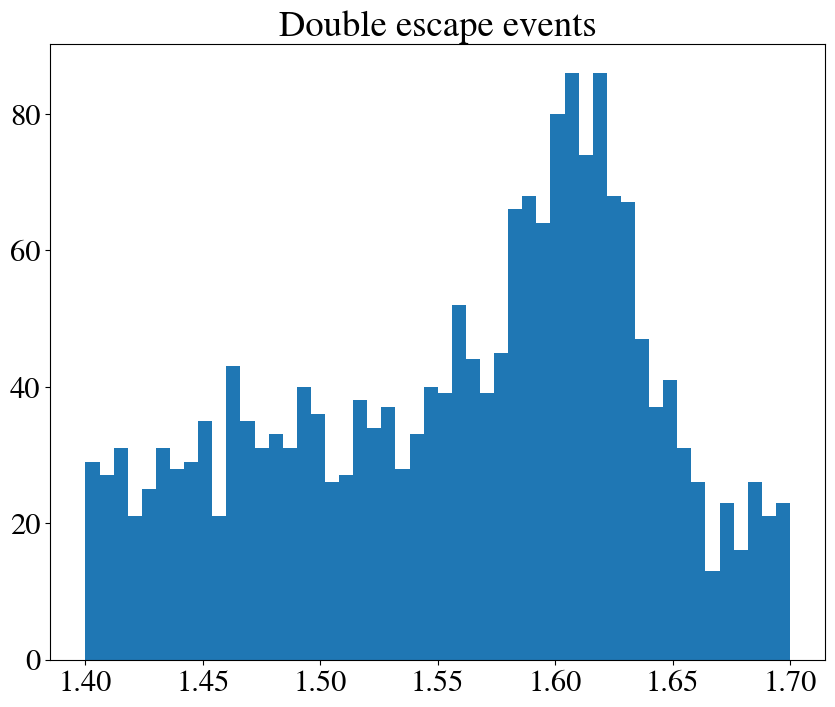

In [6]:

soph_file = 'files/15107_energy_split/corr_DES.h5'
DEP = pd.read_hdf(soph_file, key = 'RECO/Events')

plt.hist(DEP.groupby('event').Ec.sum(), bins = 50, range = [1.4, 1.7])
plt.title('Double escape events')
plt.show()

In [7]:
display(DEP.groupby('event').Ec.sum() > 1.55)

event
590         True
2350       False
2413        True
2756        True
2937        True
           ...  
1540550     True
1540930    False
1540942     True
1541237     True
1543639    False
Name: Ec, Length: 2355, dtype: bool

In [8]:
high_e_evts = DEP.groupby('event').Ec.sum() > 1.55
# extract list of events that pass
high_e_evts = high_e_evts[high_e_evts].index

DEP_extra_ROI = DEP[DEP.event.isin(high_e_evts)]
display(DEP_extra_ROI)

,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep
28970,1127289,1.742950e+09,0,147.268254,84.815097,1,-343.675,-185.975,0.0,0.0,626.325625,5.457119,3.347841,-1.0,0.000018,-1,-1.0
28971,1127289,1.742950e+09,0,147.268254,84.815097,1,-343.675,184.225,0.0,0.0,626.325625,9.765893,5.991194,-1.0,0.000032,-1,-1.0
28972,1127289,1.742950e+09,0,147.268254,84.815097,1,-265.925,168.675,0.0,0.0,626.325625,5.613680,3.443889,-1.0,0.000018,-1,-1.0
28973,1127289,1.742950e+09,0,147.268254,84.815097,1,-189.175,152.625,0.0,0.0,626.325625,5.255363,3.224068,-1.0,0.000016,-1,-1.0
28974,1127289,1.742950e+09,0,147.268254,84.815097,1,-34.675,-386.625,0.0,0.0,626.325625,5.230516,3.208825,-1.0,0.000017,-1,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30486686,1159871,1.742950e+09,0,-134.010572,-95.977057,1,26.525,-448.825,0.0,0.0,557.433000,6.001132,1.644657,-1.0,0.000010,-1,-1.0
30486687,1159871,1.742950e+09,0,-134.010572,-95.977057,1,-173.625,75.875,0.0,0.0,560.817625,5.612394,-1.319326,-1.0,-0.000006,-1,-1.0
30486688,1159871,1.742950e+09,0,-134.010572,-95.977057,1,119.825,-247.675,0.0,0.0,560.817625,5.469600,-1.285759,-1.0,-0.000007,-1,-1.0
30486689,1159871,1.742950e+09,0,-134.010572,-95.977057,1,212.125,477.175,0.0,0.0,560.817625,5.229107,-1.229226,-1.0,NaN,-1,-1.0


EVENT 1127289
Total energy 1.79 MeV

Time spent in cut_over_Q: 0.028295516967773438 s
Time spent in drop_isolated: 0.0634150505065918 s


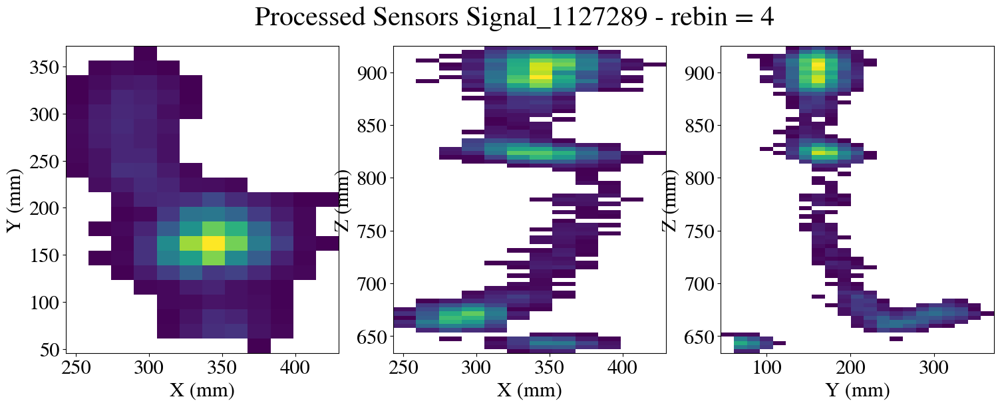

EVENT 716942
Total energy 1.56 MeV

Time spent in cut_over_Q: 0.02943730354309082 s
Time spent in drop_isolated: 0.046088218688964844 s


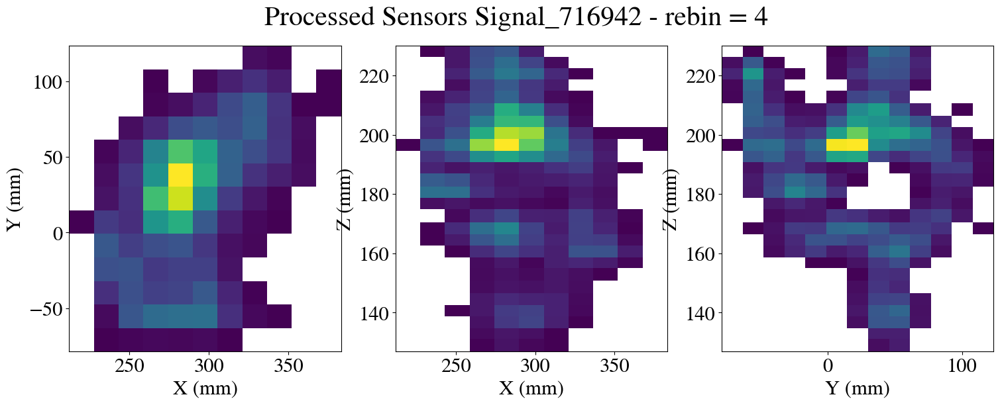

EVENT 904297
Total energy 1.71 MeV

Time spent in cut_over_Q: 0.013955831527709961 s
Time spent in drop_isolated: 0.026479244232177734 s


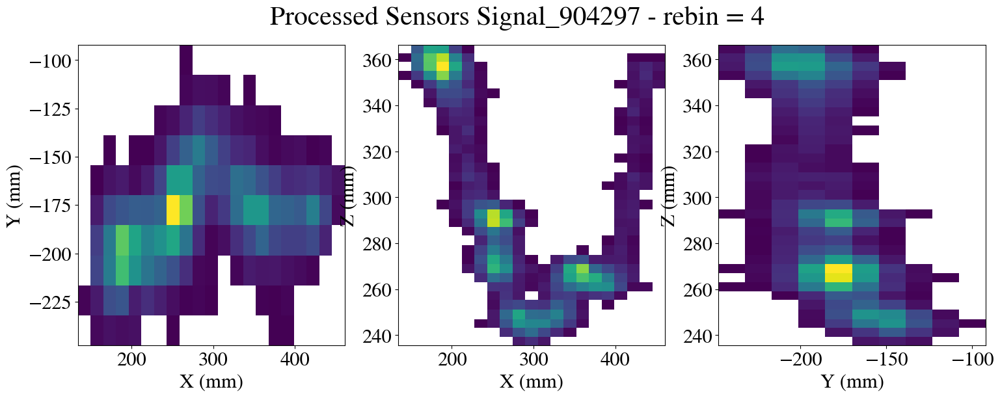

EVENT 819429
Total energy 1.70 MeV

Time spent in cut_over_Q: 0.023162126541137695 s
Time spent in drop_isolated: 0.062299489974975586 s


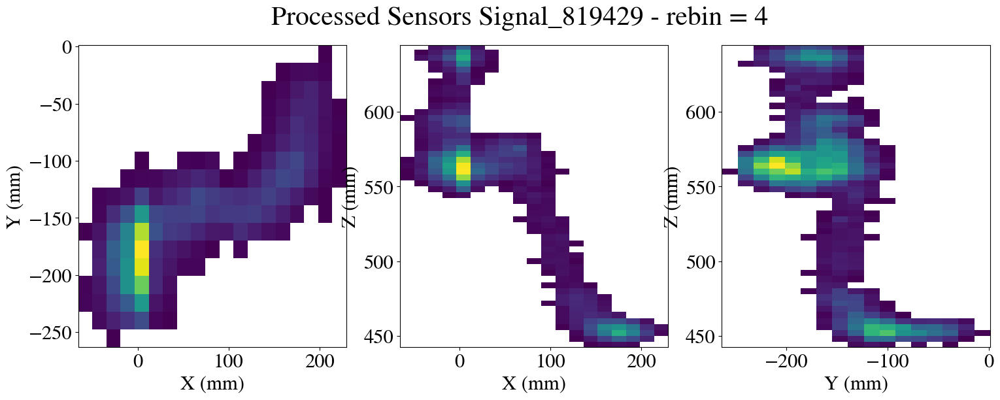

EVENT 468302
Total energy 1.61 MeV

Time spent in cut_over_Q: 0.026177167892456055 s
Time spent in drop_isolated: 0.04274916648864746 s


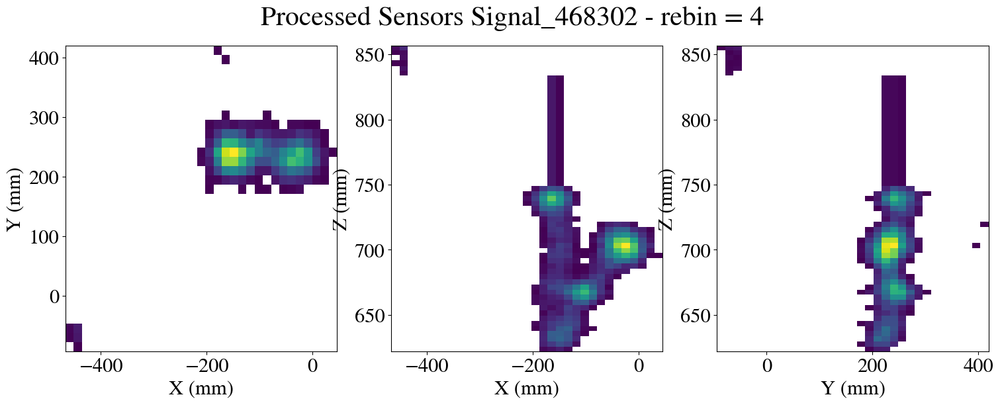

EVENT 1305824
Total energy 1.58 MeV

Time spent in cut_over_Q: 0.02186274528503418 s
Time spent in drop_isolated: 0.0244138240814209 s


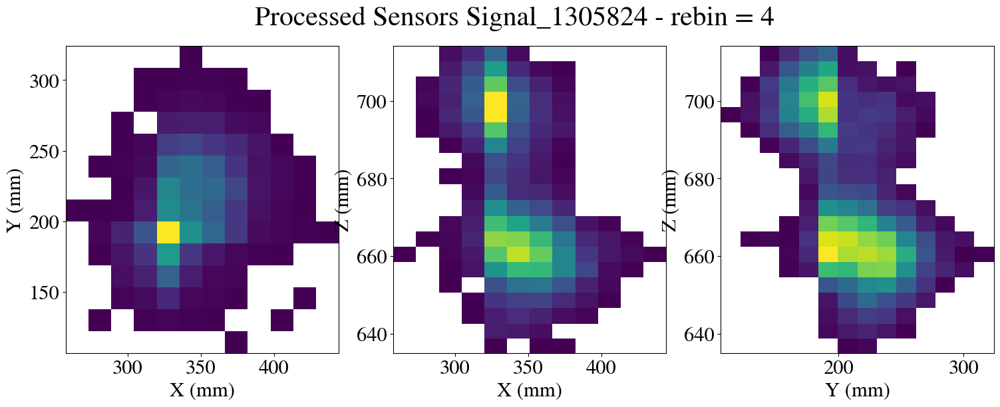

EVENT 152483
Total energy 1.62 MeV

Time spent in cut_over_Q: 0.023612499237060547 s
Time spent in drop_isolated: 0.0422513484954834 s


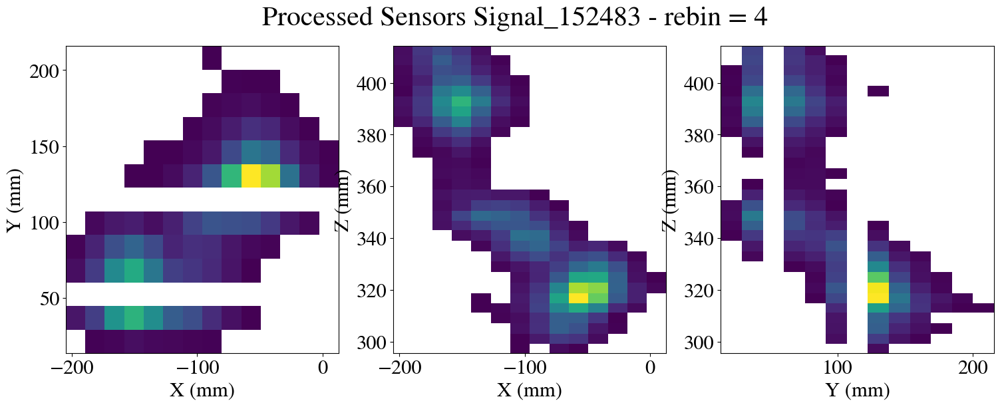

EVENT 659836
Total energy 1.63 MeV

Time spent in cut_over_Q: 0.018689870834350586 s
Time spent in drop_isolated: 0.02339005470275879 s


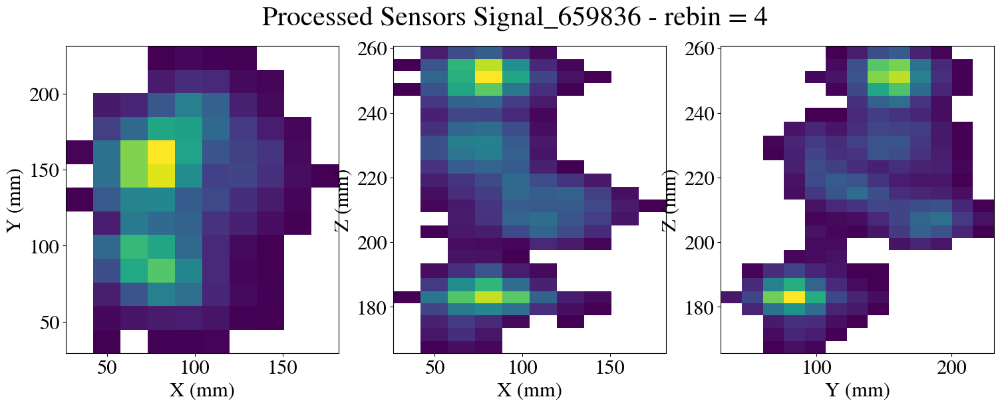

EVENT 427905
Total energy 1.71 MeV

Time spent in cut_over_Q: 0.058287858963012695 s
Time spent in drop_isolated: 0.023100614547729492 s


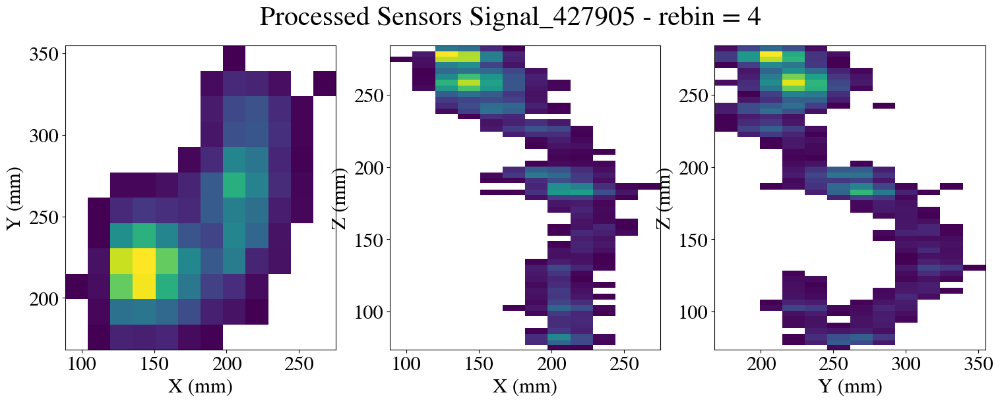

EVENT 1372856
Total energy 1.78 MeV

Time spent in cut_over_Q: 0.023335695266723633 s
Time spent in drop_isolated: 0.07198882102966309 s


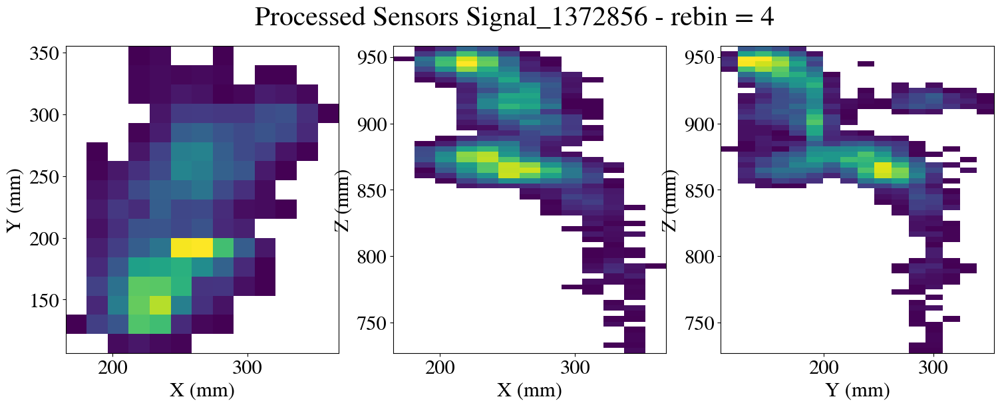

EVENT 784401
Total energy 1.58 MeV

Time spent in cut_over_Q: 0.019335031509399414 s
Time spent in drop_isolated: 0.0457763671875 s


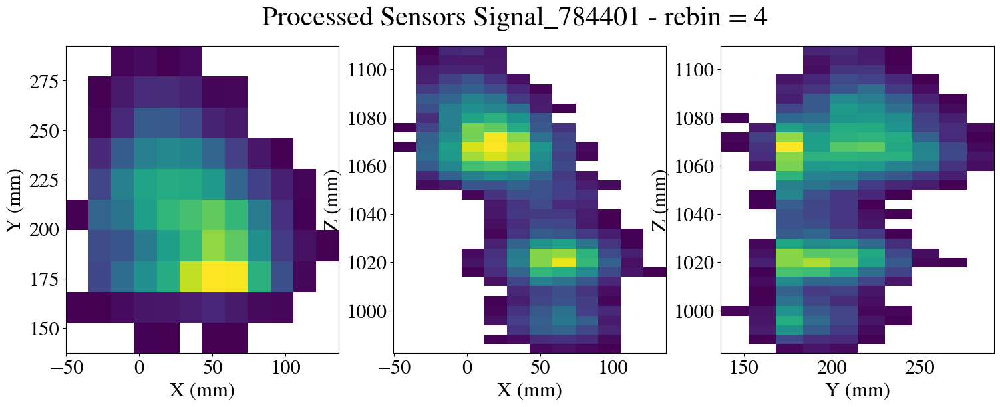

EVENT 498577
Total energy 1.66 MeV

Time spent in cut_over_Q: 0.013751745223999023 s
Time spent in drop_isolated: 0.031968116760253906 s


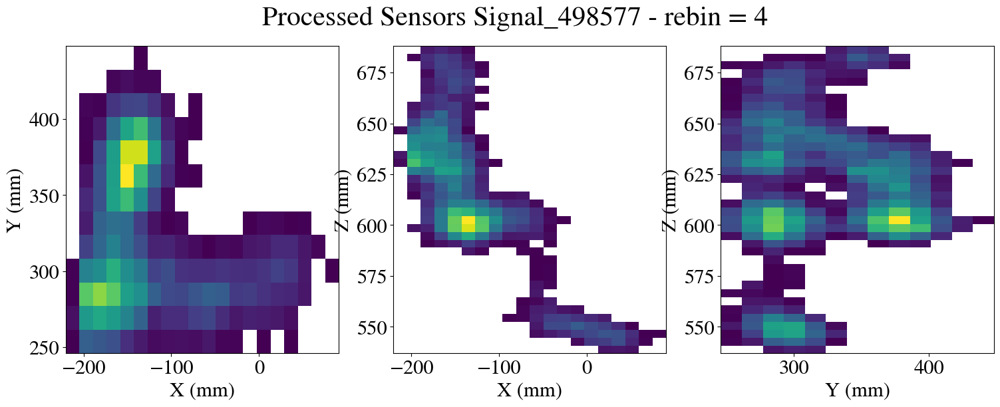

EVENT 257889
Total energy 1.73 MeV

Time spent in cut_over_Q: 0.013759613037109375 s
Time spent in drop_isolated: 0.03020477294921875 s


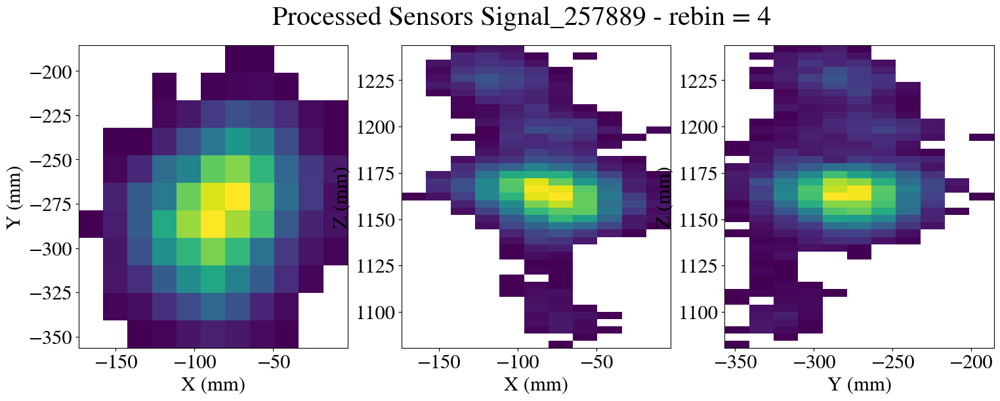

EVENT 1099492
Total energy 1.74 MeV

Time spent in cut_over_Q: 0.03098011016845703 s
Time spent in drop_isolated: 0.05326080322265625 s


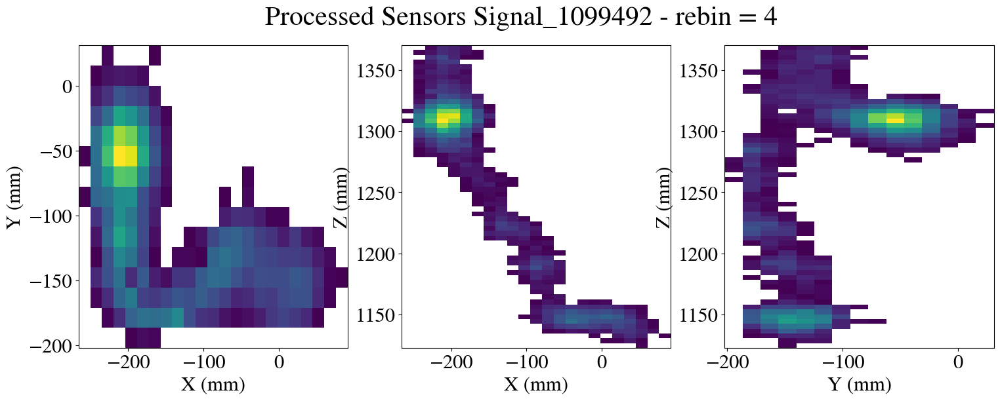

EVENT 1500977
Total energy 1.55 MeV

Time spent in cut_over_Q: 0.022417545318603516 s
Time spent in drop_isolated: 0.03849172592163086 s


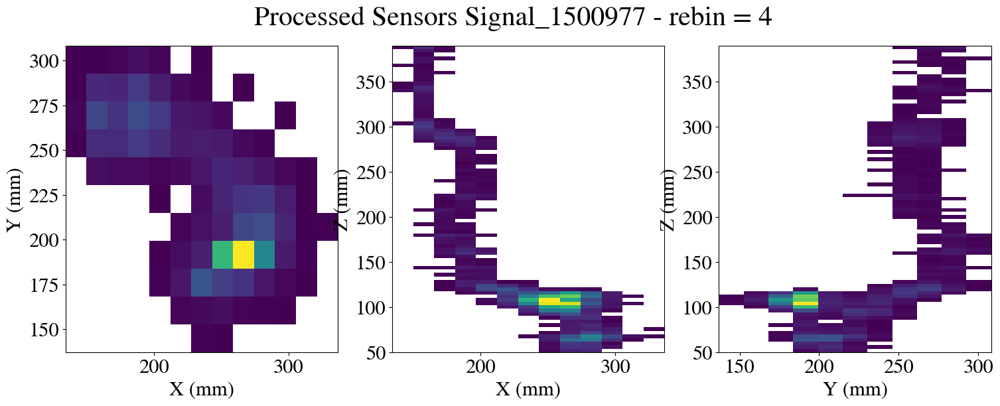

EVENT 1172635
Total energy 1.56 MeV

Time spent in cut_over_Q: 0.01900315284729004 s
Time spent in drop_isolated: 0.03836822509765625 s


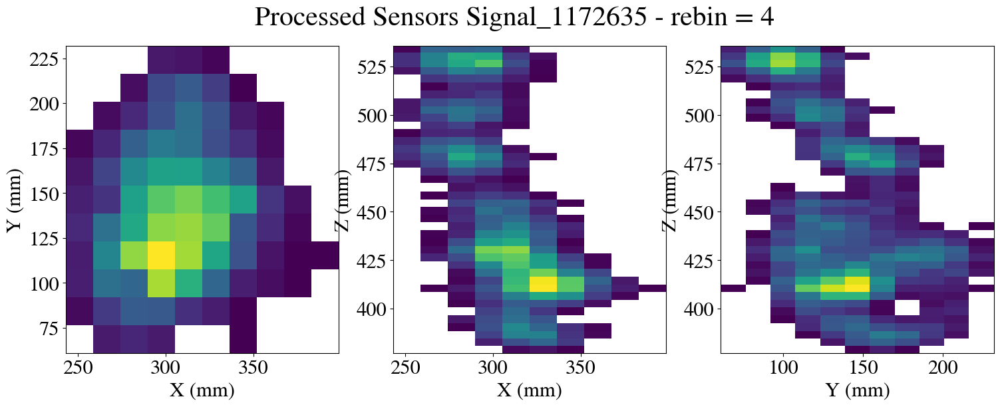

EVENT 440190
Total energy 1.62 MeV

Time spent in cut_over_Q: 0.018109798431396484 s
Time spent in drop_isolated: 0.027801513671875 s


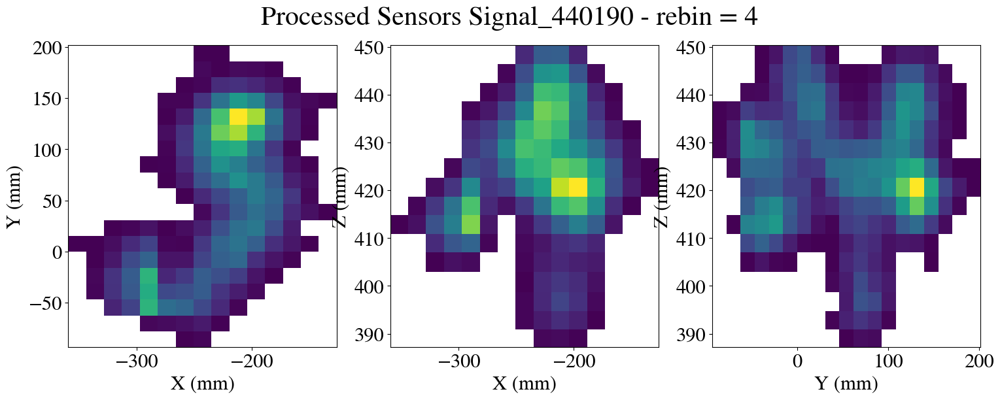

EVENT 1123593
Total energy 1.61 MeV

Time spent in cut_over_Q: 0.13266396522521973 s
Time spent in drop_isolated: 0.036646366119384766 s


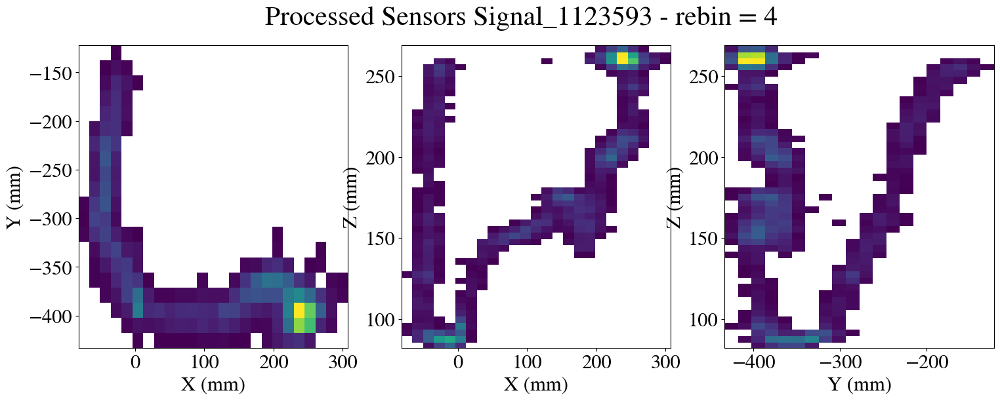

EVENT 1123621
Total energy 1.62 MeV

Time spent in cut_over_Q: 0.012346982955932617 s
Time spent in drop_isolated: 0.021425962448120117 s


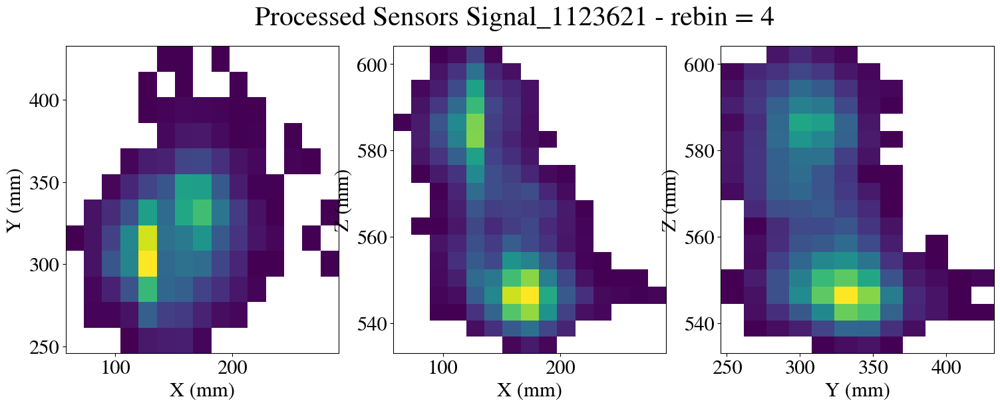

EVENT 204710
Total energy 1.74 MeV

Time spent in cut_over_Q: 0.022447586059570312 s
Time spent in drop_isolated: 0.04681563377380371 s


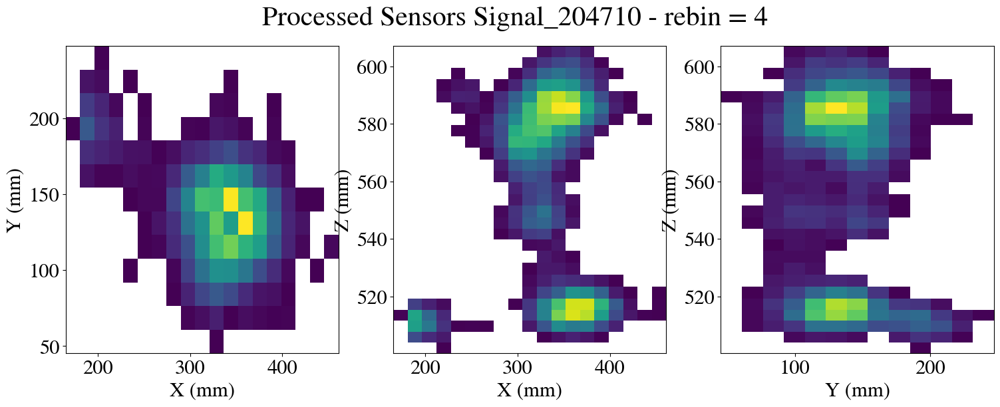

EVENT 57045
Total energy 1.59 MeV

Time spent in cut_over_Q: 0.016512632369995117 s
Time spent in drop_isolated: 0.03269553184509277 s


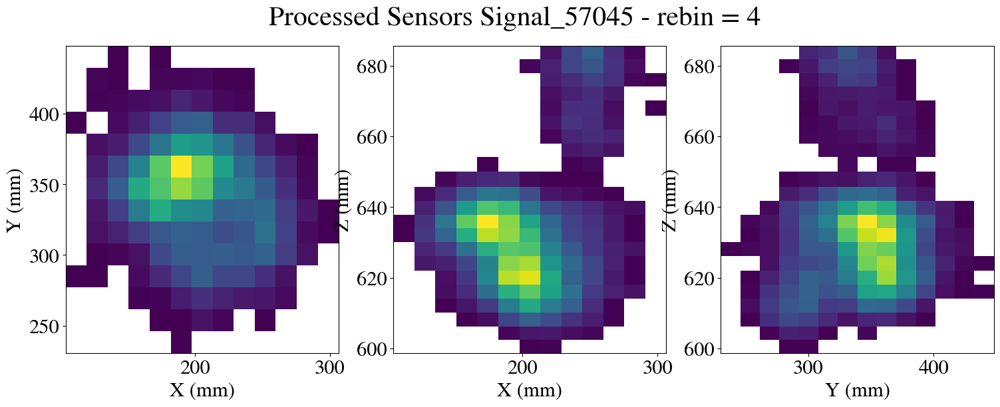

EVENT 1176639
Total energy 1.68 MeV

Time spent in cut_over_Q: 0.021959543228149414 s
Time spent in drop_isolated: 0.06345486640930176 s


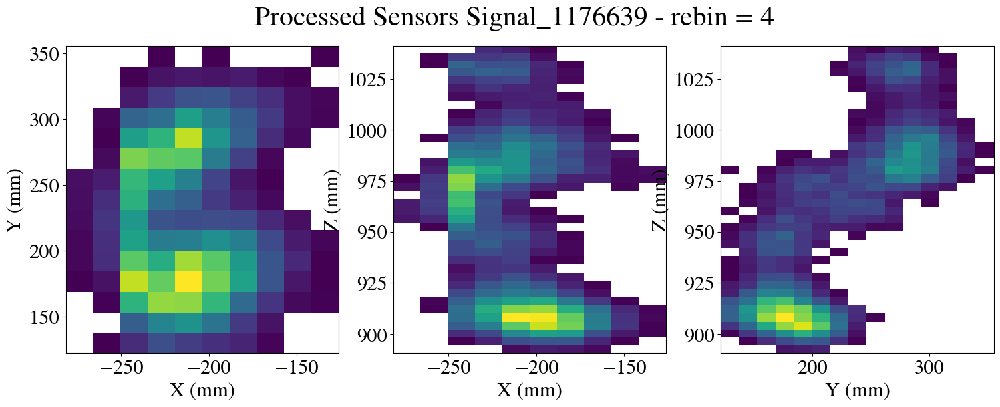

EVENT 797995
Total energy 1.58 MeV

Time spent in cut_over_Q: 0.023413896560668945 s
Time spent in drop_isolated: 0.04823470115661621 s


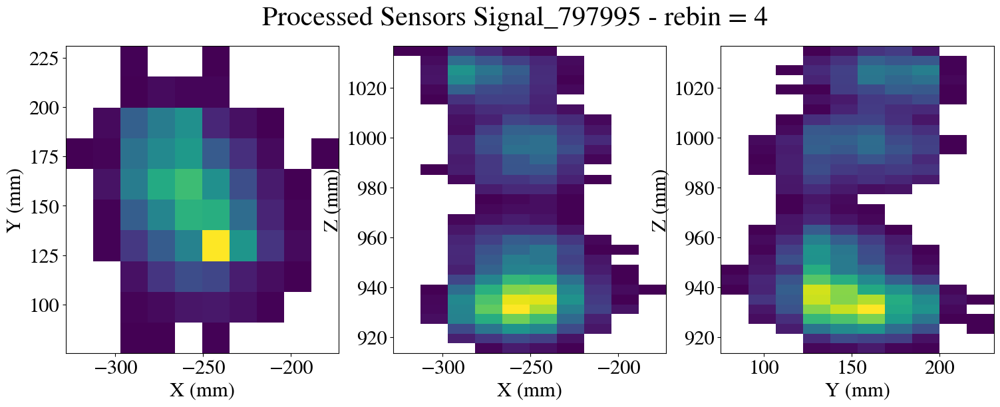

EVENT 535964
Total energy 1.66 MeV

Time spent in cut_over_Q: 0.022559165954589844 s
Time spent in drop_isolated: 0.05399894714355469 s


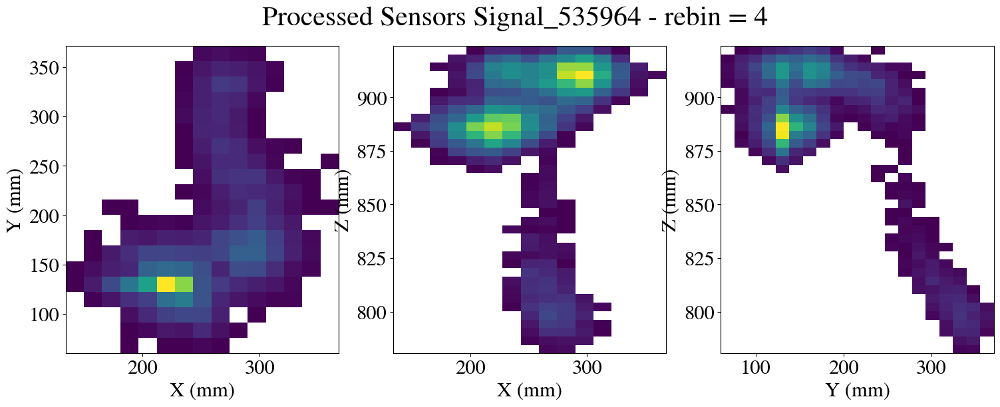

EVENT 194147
Total energy 1.64 MeV

Time spent in cut_over_Q: 0.022898197174072266 s
Time spent in drop_isolated: 0.05146145820617676 s


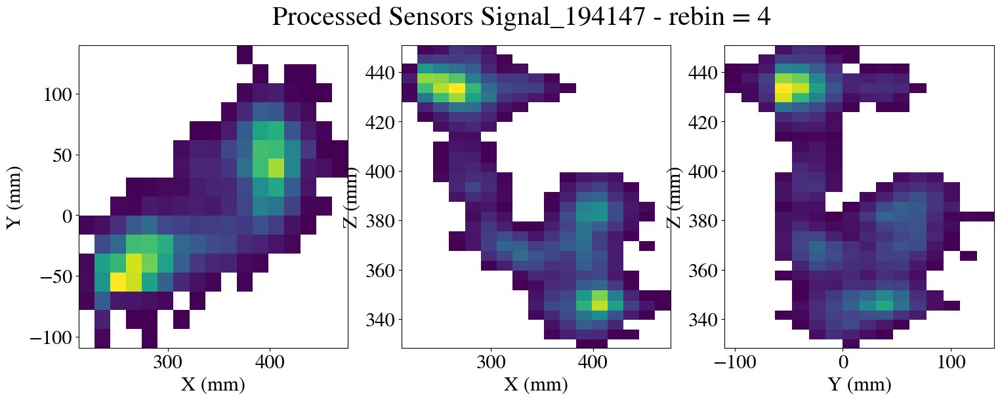

EVENT 25048
Total energy 1.59 MeV

Time spent in cut_over_Q: 0.02362513542175293 s
Time spent in drop_isolated: 0.0279695987701416 s


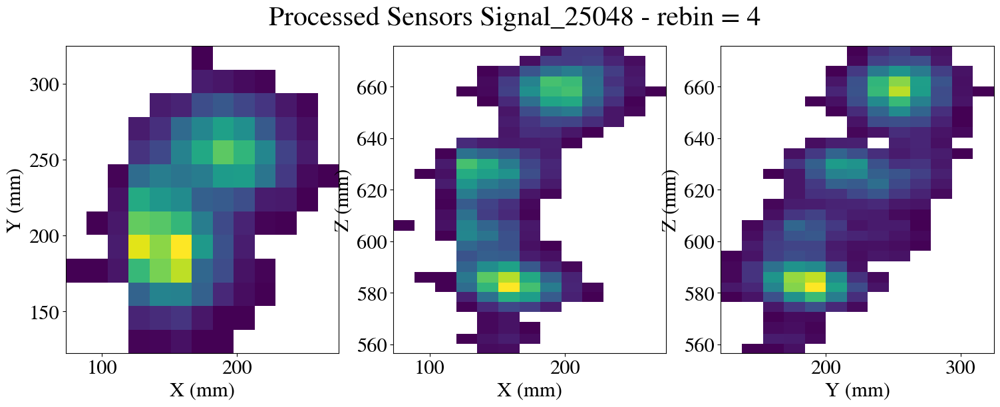

EVENT 64668
Total energy 1.68 MeV

Time spent in cut_over_Q: 0.022624492645263672 s
Time spent in drop_isolated: 0.045397281646728516 s


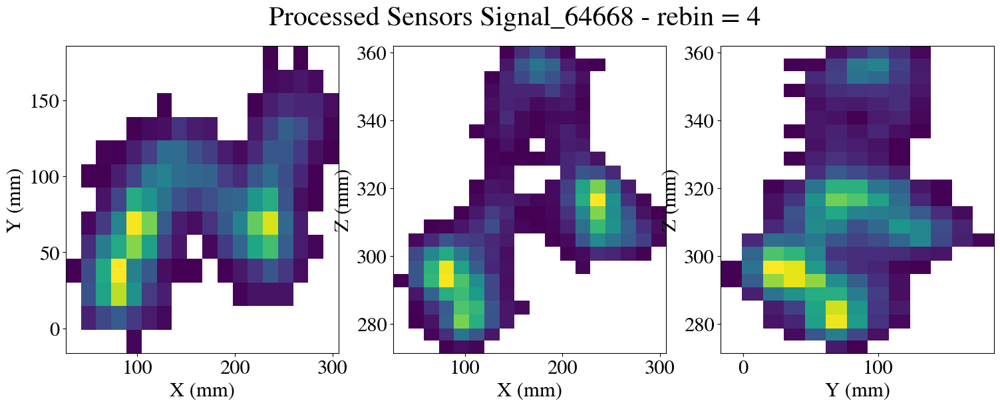

EVENT 64682
Total energy 1.75 MeV

Time spent in cut_over_Q: 0.0162351131439209 s
Time spent in drop_isolated: 0.042096614837646484 s


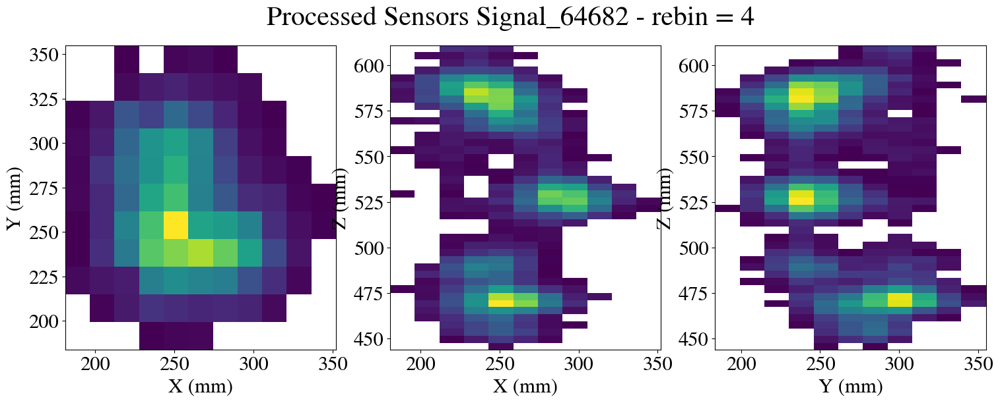

EVENT 472649
Total energy 1.69 MeV

Time spent in cut_over_Q: 0.014020681381225586 s
Time spent in drop_isolated: 0.036583900451660156 s


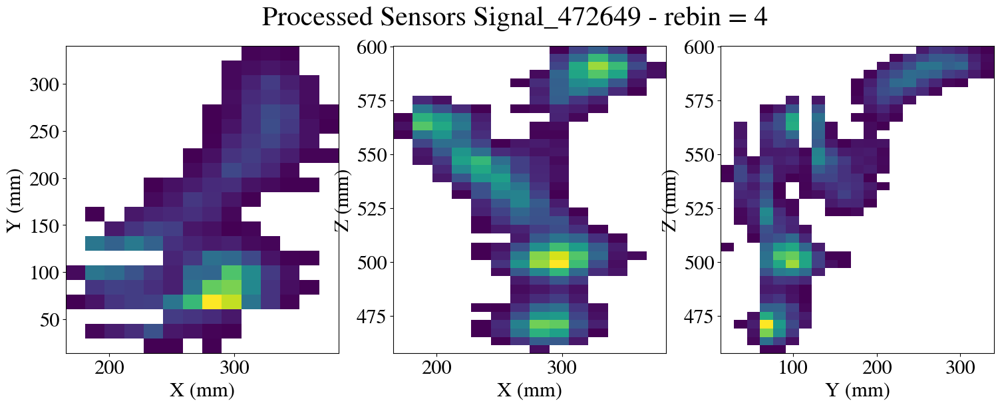

EVENT 1043163
Total energy 1.63 MeV

Time spent in cut_over_Q: 0.023135900497436523 s
Time spent in drop_isolated: 0.05011105537414551 s


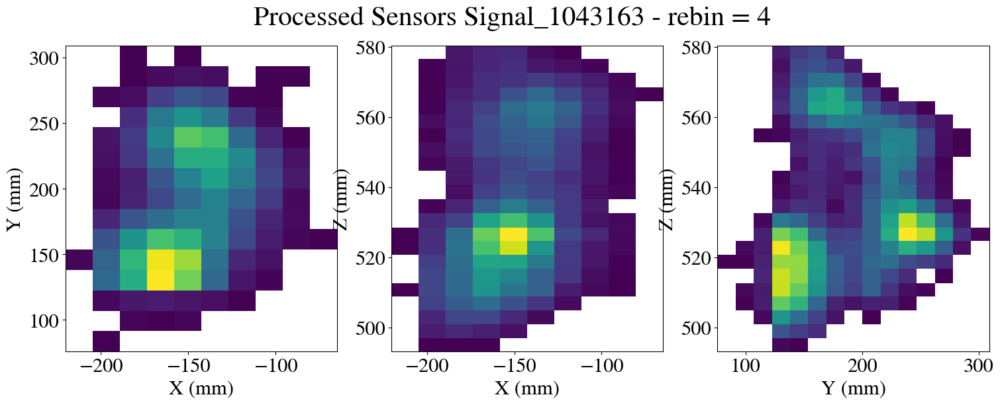

EVENT 1219346
Total energy 1.66 MeV

Time spent in cut_over_Q: 0.03813362121582031 s
Time spent in drop_isolated: 0.03408956527709961 s


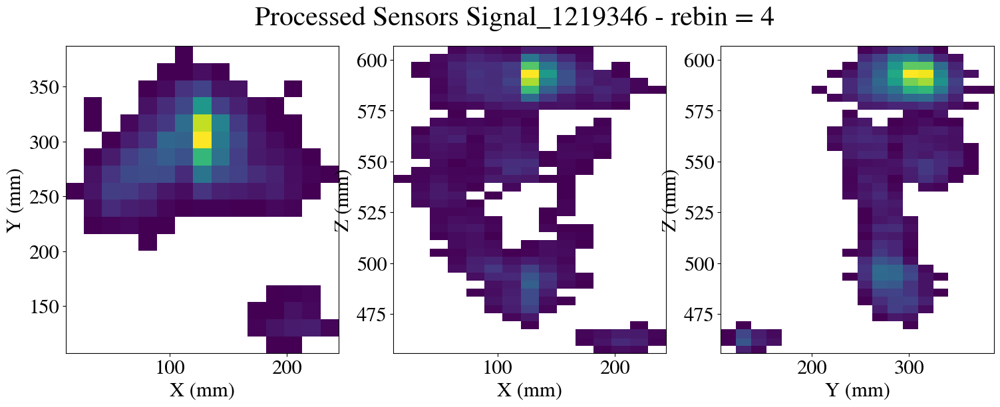

EVENT 452174
Total energy 1.78 MeV

Time spent in cut_over_Q: 0.01699376106262207 s
Time spent in drop_isolated: 0.030965089797973633 s


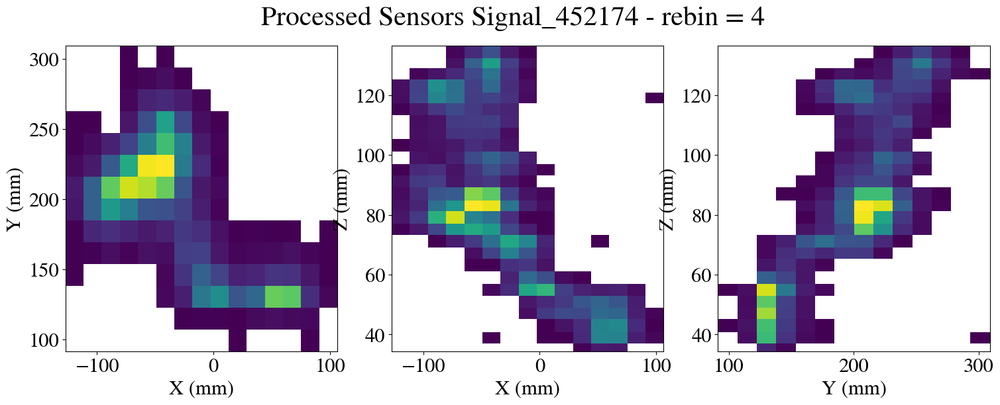

EVENT 588870
Total energy 1.60 MeV

Time spent in cut_over_Q: 0.013863801956176758 s
Time spent in drop_isolated: 0.0320734977722168 s


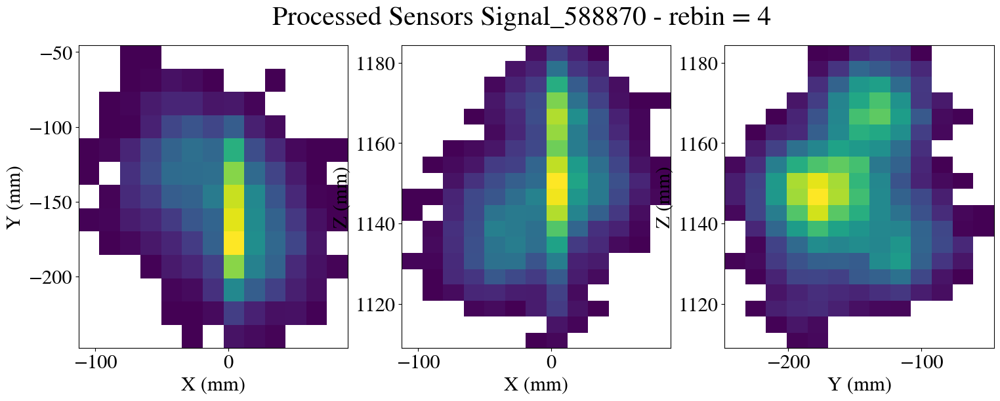

EVENT 589220
Total energy 1.61 MeV

Time spent in cut_over_Q: 0.018630027770996094 s
Time spent in drop_isolated: 0.027744770050048828 s


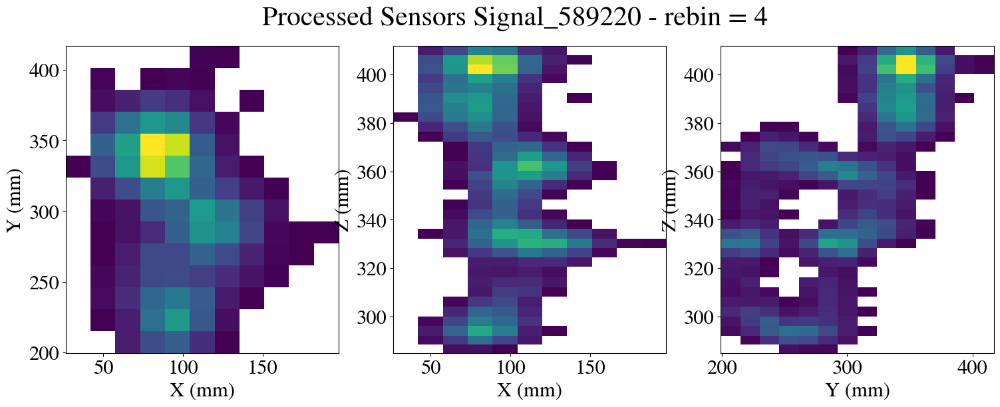

EVENT 821312
Total energy 1.55 MeV

Time spent in cut_over_Q: 0.012882232666015625 s
Time spent in drop_isolated: 0.027971982955932617 s


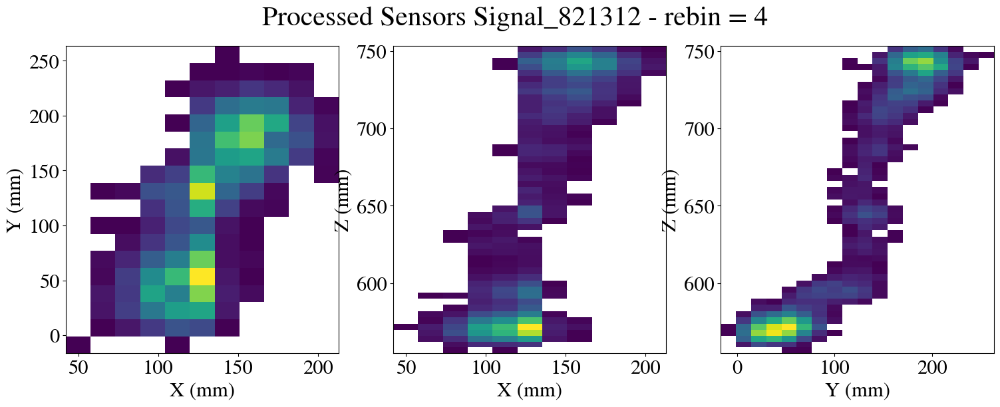

EVENT 190556
Total energy 1.61 MeV

Time spent in cut_over_Q: 0.016177654266357422 s
Time spent in drop_isolated: 0.028144359588623047 s


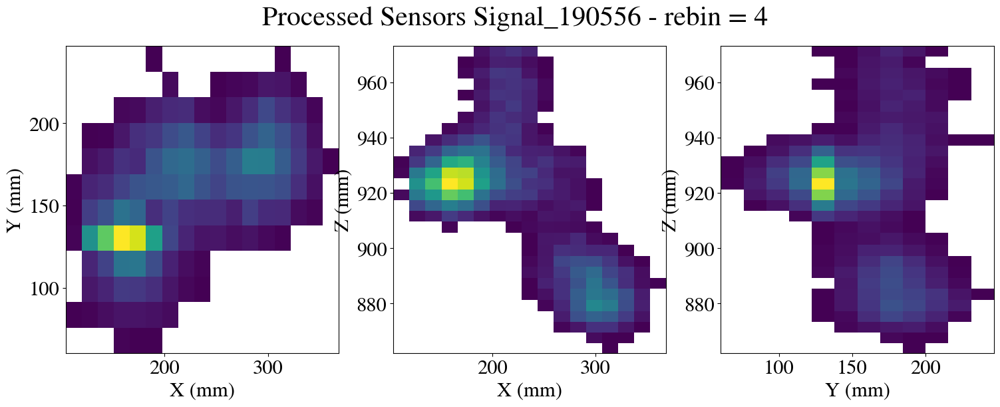

EVENT 1216210
Total energy 1.60 MeV

Time spent in cut_over_Q: 0.0213010311126709 s
Time spent in drop_isolated: 0.041059255599975586 s


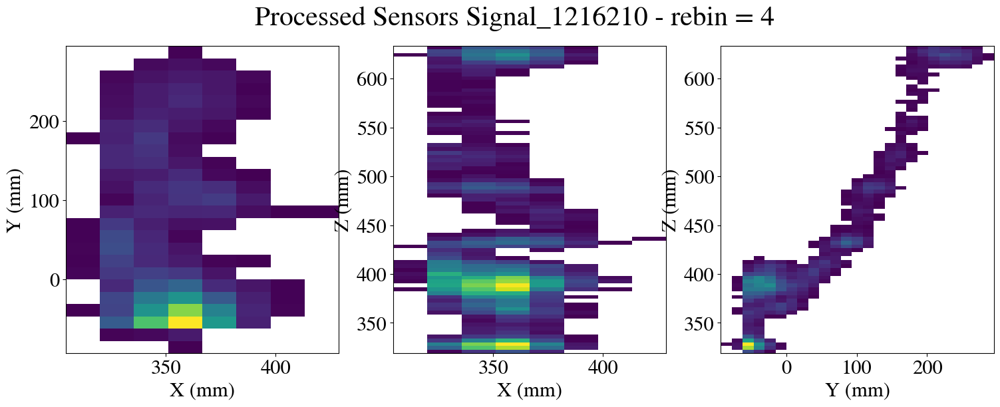

EVENT 890885
Total energy 1.77 MeV

Time spent in cut_over_Q: 0.013291597366333008 s
Time spent in drop_isolated: 0.03377485275268555 s


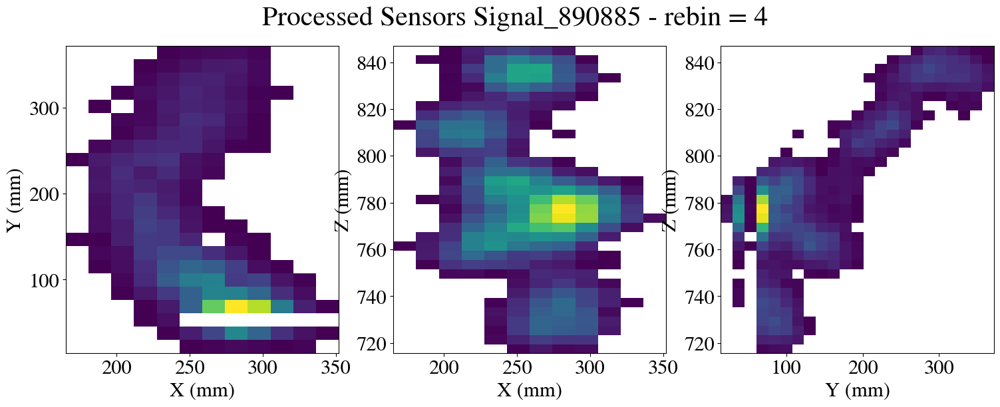

EVENT 1146133
Total energy 1.59 MeV

Time spent in cut_over_Q: 0.01347804069519043 s
Time spent in drop_isolated: 0.027085304260253906 s


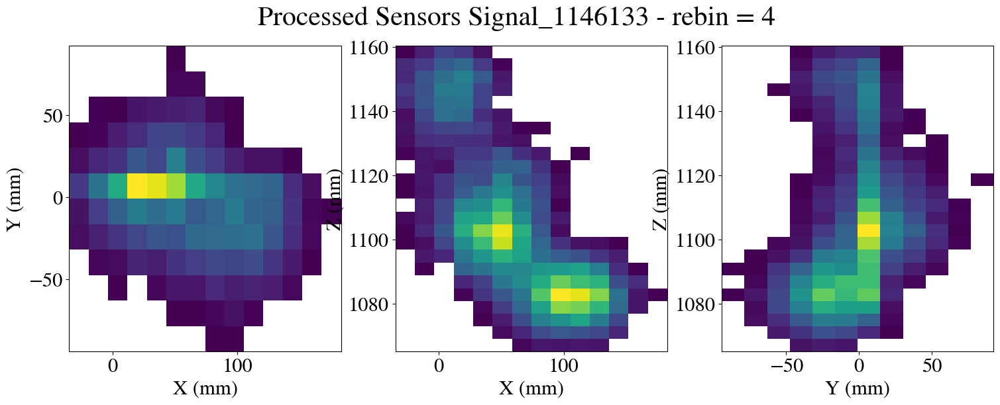

EVENT 1343372
Total energy 1.62 MeV

Time spent in cut_over_Q: 0.013544797897338867 s
Time spent in drop_isolated: 0.026973485946655273 s


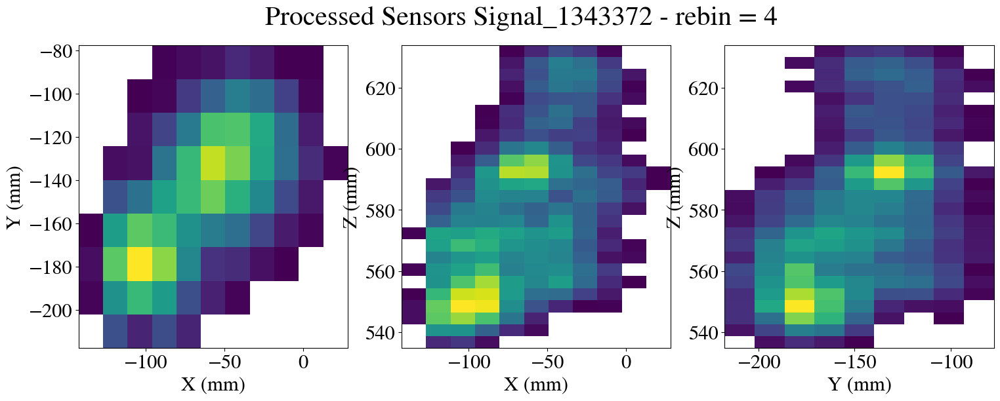

EVENT 158776
Total energy 1.73 MeV

Time spent in cut_over_Q: 0.022695302963256836 s
Time spent in drop_isolated: 0.06246805191040039 s


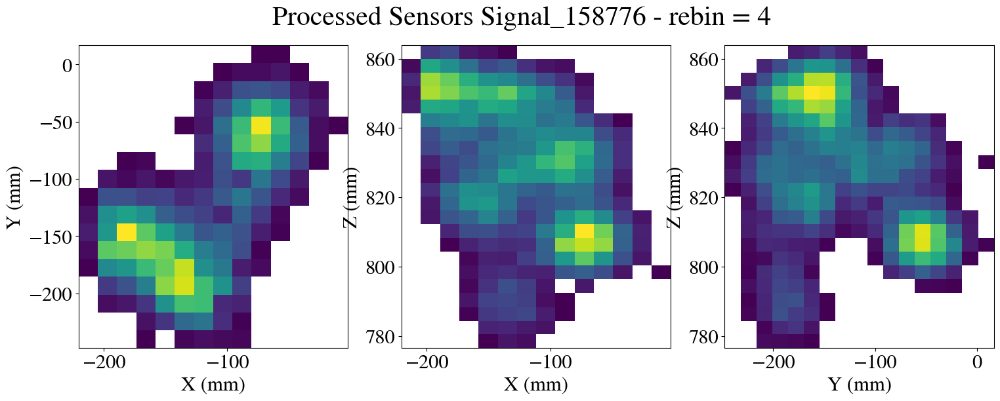

EVENT 804344
Total energy 1.62 MeV

Time spent in cut_over_Q: 0.015831470489501953 s
Time spent in drop_isolated: 0.029771089553833008 s


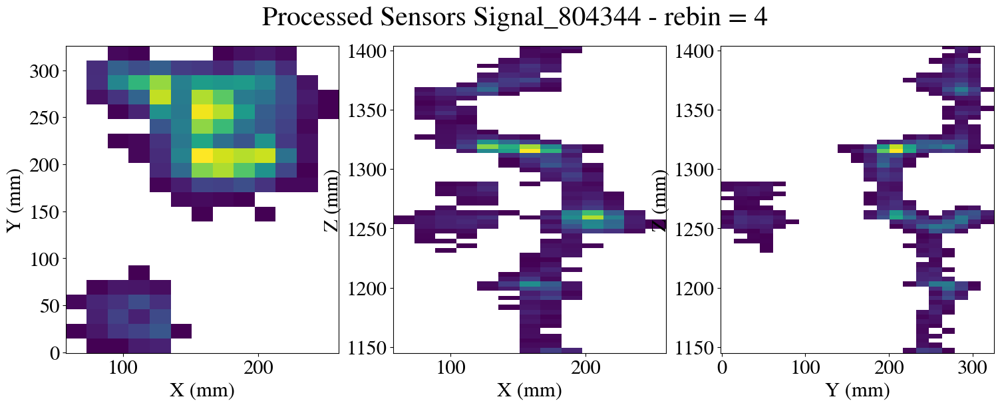

EVENT 949069
Total energy 1.57 MeV

Time spent in cut_over_Q: 0.021820545196533203 s
Time spent in drop_isolated: 0.04787445068359375 s


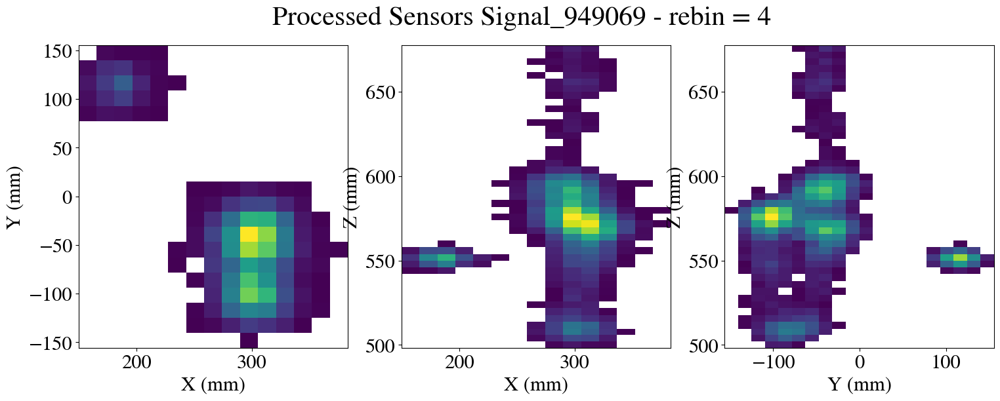

EVENT 98394
Total energy 1.56 MeV

Time spent in cut_over_Q: 0.01946711540222168 s
Time spent in drop_isolated: 0.029159069061279297 s


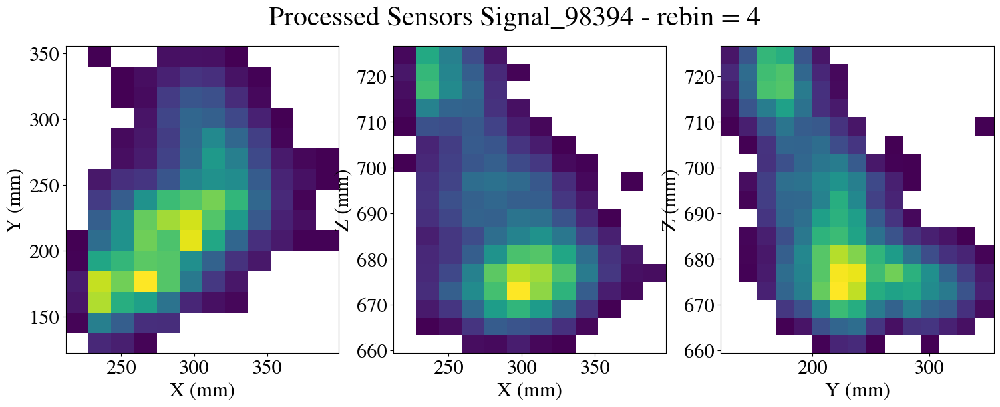

EVENT 42751
Total energy 1.64 MeV

Time spent in cut_over_Q: 0.038561344146728516 s
Time spent in drop_isolated: 0.05510377883911133 s


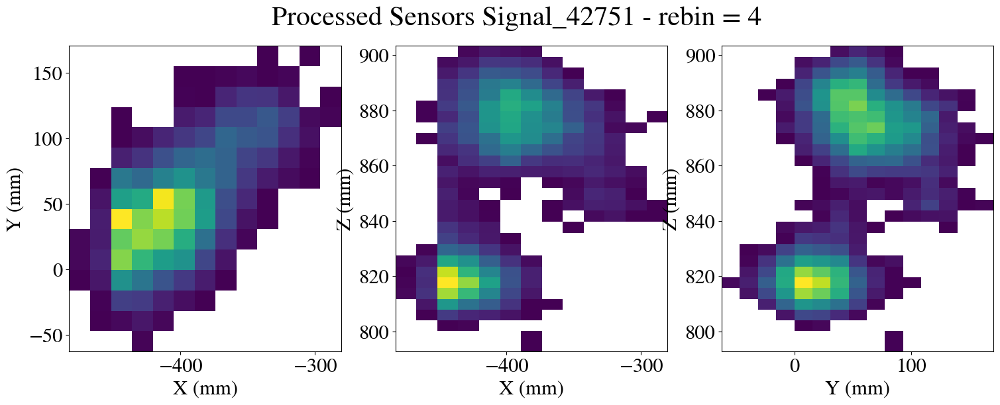

EVENT 1028911
Total energy 1.77 MeV

Time spent in cut_over_Q: 0.023022174835205078 s
Time spent in drop_isolated: 0.05235910415649414 s


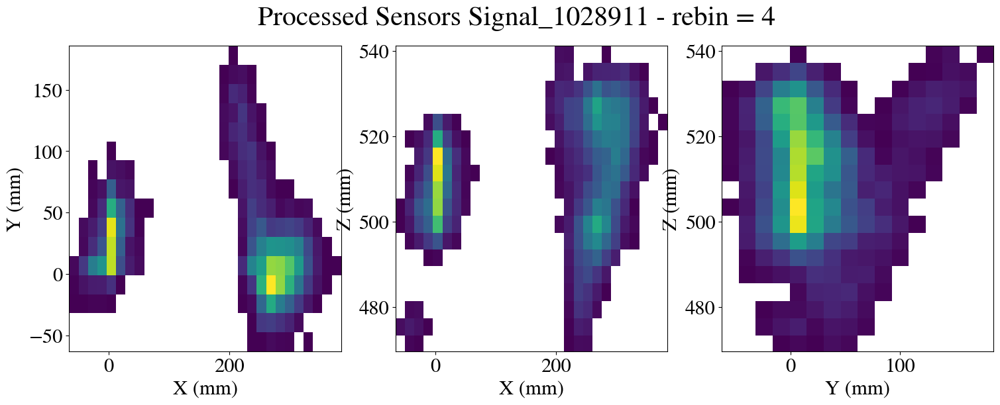

EVENT 241621
Total energy 1.55 MeV

Time spent in cut_over_Q: 0.01814126968383789 s
Time spent in drop_isolated: 0.03204774856567383 s


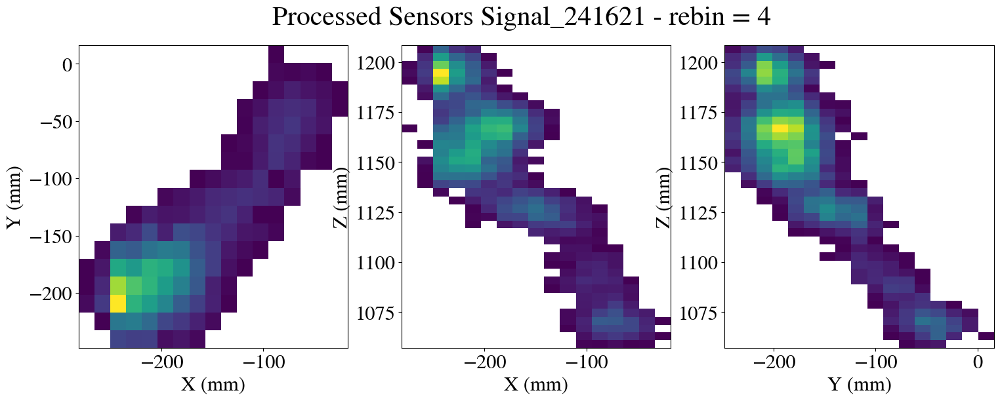

EVENT 1367522
Total energy 1.69 MeV

Time spent in cut_over_Q: 0.13200736045837402 s
Time spent in drop_isolated: 0.043586015701293945 s


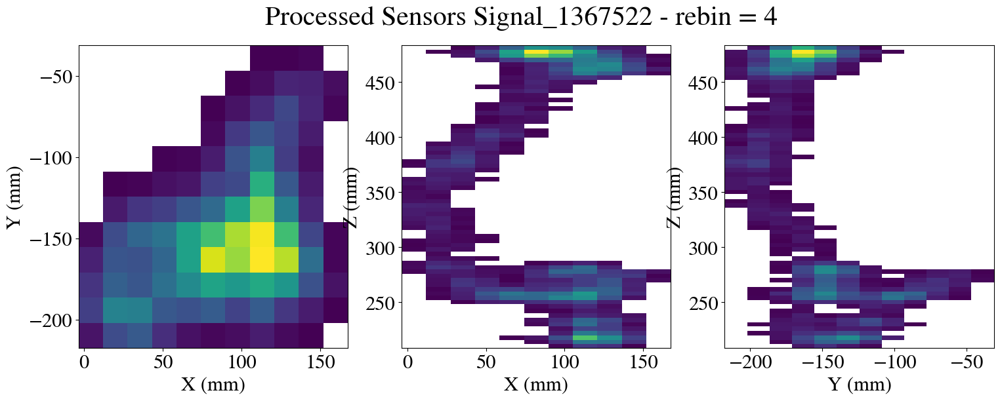

EVENT 214335
Total energy 1.62 MeV

Time spent in cut_over_Q: 0.01782059669494629 s
Time spent in drop_isolated: 0.03375363349914551 s


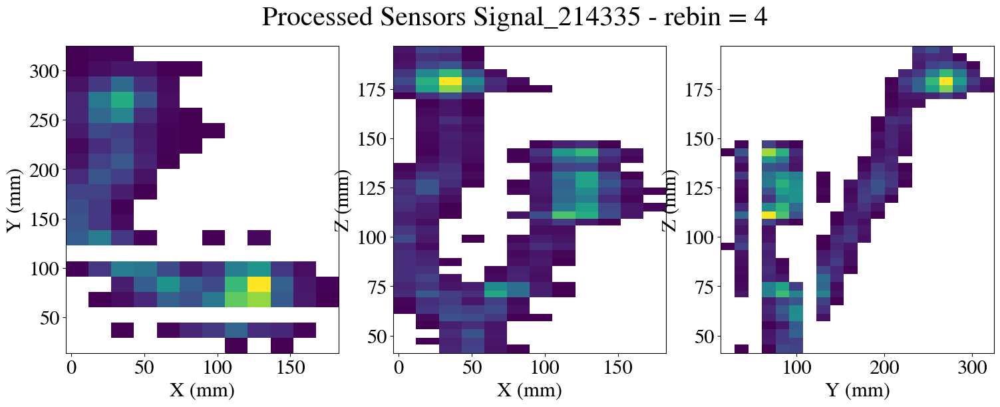

EVENT 528138
Total energy 1.72 MeV

Time spent in cut_over_Q: 0.013953924179077148 s
Time spent in drop_isolated: 0.0365903377532959 s


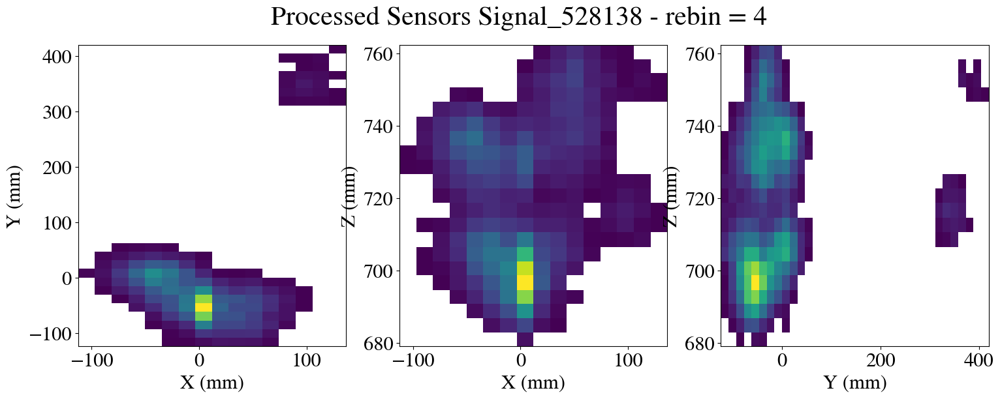

EVENT 1255025
Total energy 1.60 MeV

Time spent in cut_over_Q: 0.021898746490478516 s
Time spent in drop_isolated: 0.04621076583862305 s


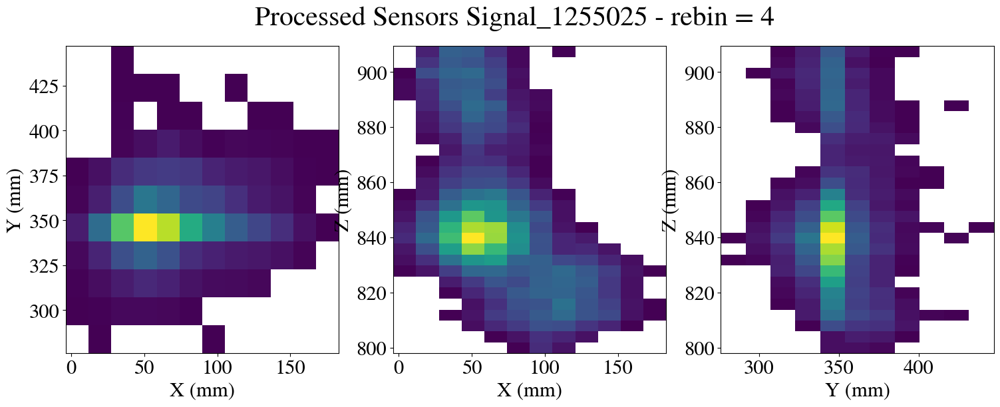

EVENT 244218
Total energy 1.61 MeV

Time spent in cut_over_Q: 0.01885080337524414 s
Time spent in drop_isolated: 0.04268670082092285 s


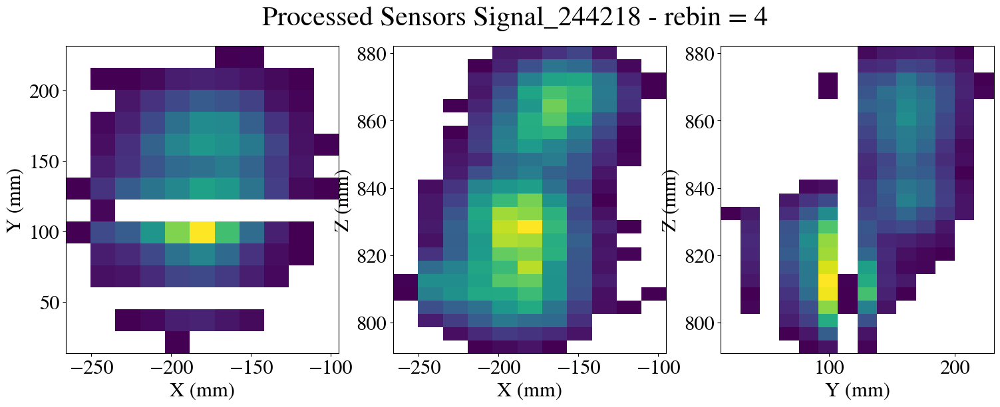

In [9]:
# eliminate events where sum of Ec is > 1.55


stopper = 50
for i, ev in enumerate(DEP_extra_ROI.event.unique()):
    plotter(DEP, ev)
    if i > stopper:
        break

,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep
4832504,821312,1.742946e+09,0,65.586248,63.112552,1,-328.125,-93.675,0.0,0.0,550.980250,5.353500,27.712008,-1.0,0.000141,-1,-1.0
4832505,821312,1.742946e+09,0,65.586248,63.112552,1,-19.125,245.925,0.0,0.0,550.980250,5.059011,26.187608,-1.0,0.000132,-1,-1.0
4832506,821312,1.742946e+09,0,65.586248,63.112552,1,104.275,369.325,0.0,0.0,550.980250,5.267607,27.267386,-1.0,0.000150,-1,-1.0
4832507,821312,1.742946e+09,0,65.586248,63.112552,1,243.225,-109.725,0.0,0.0,550.980250,5.279479,27.328840,-1.0,0.000140,-1,-1.0
4832508,821312,1.742946e+09,0,65.586248,63.112552,1,-404.875,-185.975,0.0,0.0,554.652750,5.176137,86.338856,-1.0,0.000543,-1,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4834539,821312,1.742946e+09,0,65.586248,63.112552,1,181.025,492.725,0.0,0.0,753.318000,5.666378,31.669854,-1.0,NaN,-1,-1.0
4834540,821312,1.742946e+09,0,65.586248,63.112552,1,427.825,-16.925,0.0,0.0,753.318000,5.116142,28.594538,-1.0,0.000160,-1,-1.0
4834541,821312,1.742946e+09,0,65.586248,63.112552,1,-359.225,60.825,0.0,0.0,756.937625,5.195988,9.961450,-1.0,0.000053,-1,-1.0
4834542,821312,1.742946e+09,0,65.586248,63.112552,1,-65.775,-340.975,0.0,0.0,756.937625,7.552686,14.479576,-1.0,0.000075,-1,-1.0


PRE Q_CUT
EVENT 821312
Total energy 1.55 MeV



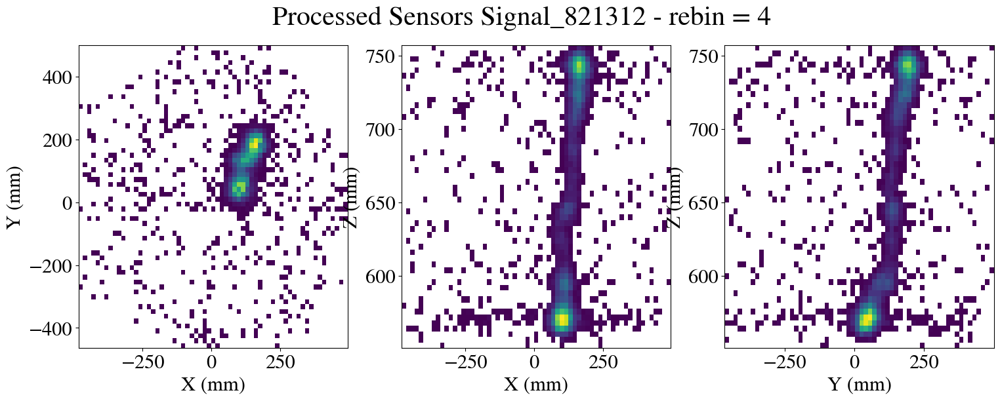

POST Q_CUT
EVENT 821312
Total energy 1.55 MeV

Time spent in cut_over_Q: 0.022364377975463867 s
Time spent in drop_isolated: 0.04620075225830078 s


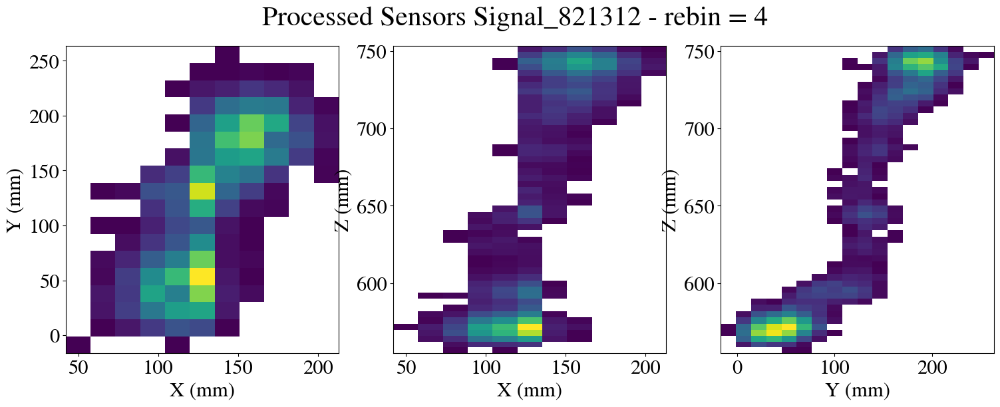

Time spent in cut_over_Q: 0.01496744155883789 s
Time spent in drop_isolated: 0.030065059661865234 s


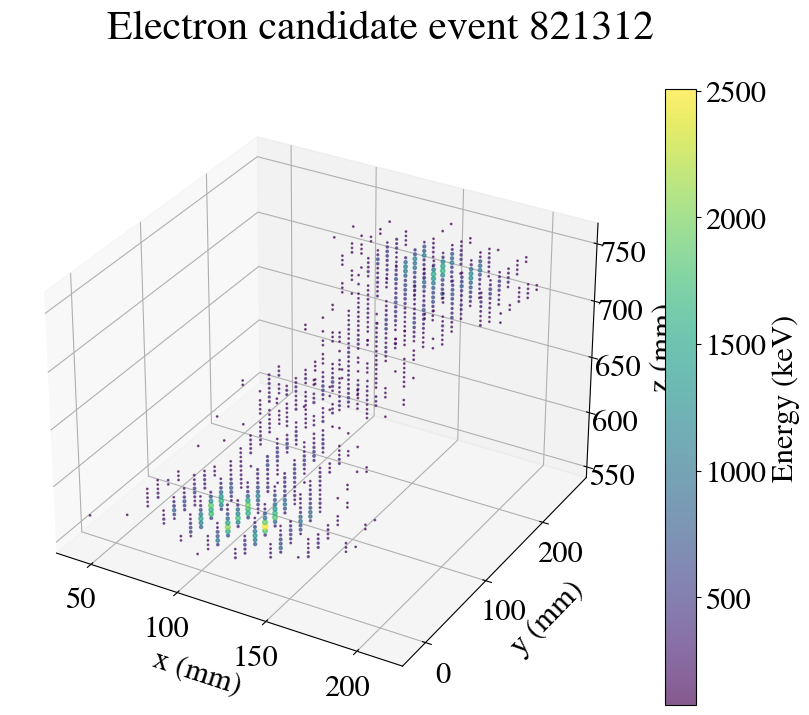

,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep
0,821312,1.742946e+09,0,65.586248,63.112552,1,73.175,60.325,0.0,0.0,554.652750,12.861444,268.043279,-1.0,0.001297,-1,-1.0
1,821312,1.742946e+09,0,65.586248,63.112552,1,104.275,75.875,0.0,0.0,554.652750,10.026081,208.951946,-1.0,0.001019,-1,-1.0
2,821312,1.742946e+09,0,65.586248,63.112552,1,73.175,29.225,0.0,0.0,558.444625,10.462393,193.509867,-1.0,0.000944,-1,-1.0
3,821312,1.742946e+09,0,65.586248,63.112552,1,73.175,44.775,0.0,0.0,558.444625,19.719208,364.721660,-1.0,0.001764,-1,-1.0
4,821312,1.742946e+09,0,65.586248,63.112552,1,73.175,60.325,0.0,0.0,558.444625,11.495626,212.620305,-1.0,0.001028,-1,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
941,821312,1.742946e+09,0,65.586248,63.112552,1,165.475,183.725,0.0,0.0,753.318000,17.497299,122.187340,-1.0,0.000598,-1,-1.0
942,821312,1.742946e+09,0,65.586248,63.112552,1,165.475,199.275,0.0,0.0,753.318000,20.629738,144.061822,-1.0,0.000707,-1,-1.0
943,821312,1.742946e+09,0,65.586248,63.112552,1,165.475,214.825,0.0,0.0,753.318000,10.765909,75.180621,-1.0,0.000373,-1,-1.0
944,821312,1.742946e+09,0,65.586248,63.112552,1,181.025,199.275,0.0,0.0,753.318000,16.272535,113.634555,-1.0,0.000564,-1,-1.0


In [10]:
# select event that we know is decent
evt_DEP = 821312
evt_interest = DEP[DEP.event == evt_DEP]
display(evt_interest)
print("PRE Q_CUT")
plotter(DEP, evt_DEP, cut_n_drop=False)
print("POST Q_CUT")
plotter(DEP, evt_DEP) # cut
plotter_3d(DEP, evt_DEP)

# n_iter

you should make this a functional

In [11]:
reco_niter = {}

n_iterations_list = [5,8, 10, 12, 15, 17, 20, 23, 25, 28, 30]

for iterations in n_iterations_list:
    deconv_params = gen_deconv_params(twoDS_PSF_PATH,
                                          _q_cut = 10,
                                          _e_cut = 0.2,
                                          _n_iterations = iterations,
                                          _iteration_tol = 1e-9,
                                          _binning = 2.5,
                                          _cut_type = CutType.rel)
    # line that separates the q_cut and drop_dist as they're not in the iterator for beersheba
    deconv_params_   = {k : v for k, v in deconv_params.items() if k not in ['q_cut', 'drop_dist']}

    # define the cuts    
    cut_sensors       = beerfun.cut_over_Q   (deconv_params['q_cut'    ], ['E', 'Ec'])
    drop_sensors      = beerfun.drop_isolated(deconv_params['drop_dist'], ['E', 'Ec'])

    #cut and drop
    hits_cut = coref.timefunc(cut_sensors)(evt_interest.copy(deep=True)) # deep to avoid silly things
    hits_drop = coref.timefunc(drop_sensors)(hits_cut.copy())


    deconvolver_ = beerfun.deconvolve_signal(DataSiPM(detector_db, run_number), **deconv_params_)

    print("\n======================")
    print(f"{deconv_params_['n_iterations']} iterations")
    reco_niter[iterations] = (coref.timefunc(deconvolver_)(hits_drop.copy()))

Time spent in cut_over_Q: 0.024259567260742188 s
Time spent in drop_isolated: 0.0472254753112793 s



5 iterations
Time spent in apply_deconvolution: 7.364544868469238 s
Time spent in cut_over_Q: 0.012135744094848633 s
Time spent in drop_isolated: 0.024811267852783203 s

8 iterations
Time spent in apply_deconvolution: 9.8344144821167 s
Time spent in cut_over_Q: 0.012346744537353516 s
Time spent in drop_isolated: 0.02421879768371582 s

10 iterations
Time spent in apply_deconvolution: 11.376277208328247 s
Time spent in cut_over_Q: 0.01244974136352539 s
Time spent in drop_isolated: 0.02535700798034668 s

12 iterations
Time spent in apply_deconvolution: 13.551746606826782 s
Time spent in cut_over_Q: 0.012336254119873047 s
Time spent in drop_isolated: 0.02709364891052246 s

15 iterations
Time spent in apply_deconvolution: 15.289515495300293 s
Time spent in cut_over_Q: 0.012986183166503906 s
Time spent in drop_isolated: 0.024370431900024414 s

17 iterations
Time spent in apply_deconvolution: 17.33974575996399 s
Time spent in cut_over_Q: 0.011326313018798828 s
Time spent in drop_isolated: 0.

EVENT 821312
Total energy 1.55 MeV

Time spent in cut_over_Q: 0.02355170249938965 s
Time spent in drop_isolated: 0.04483366012573242 s


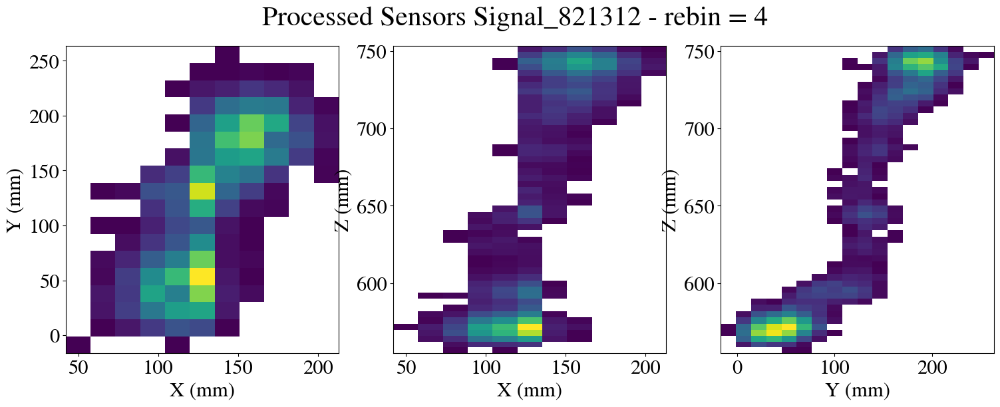

EVENT 821312
Total energy 1.55 MeV



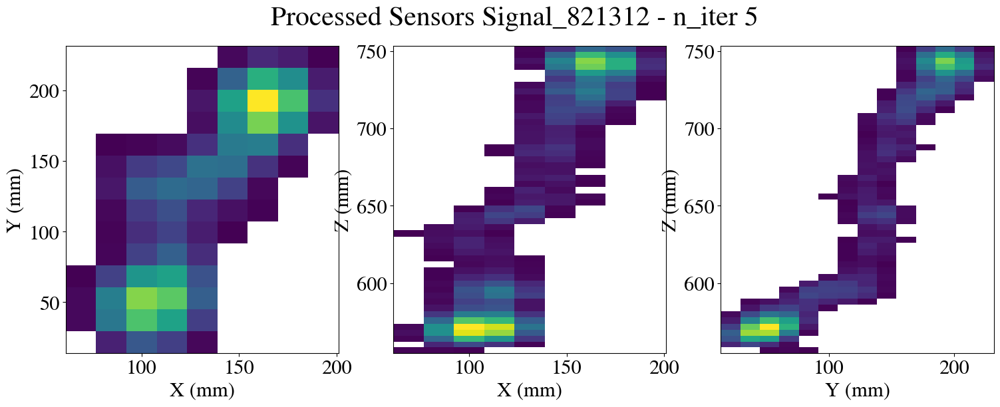

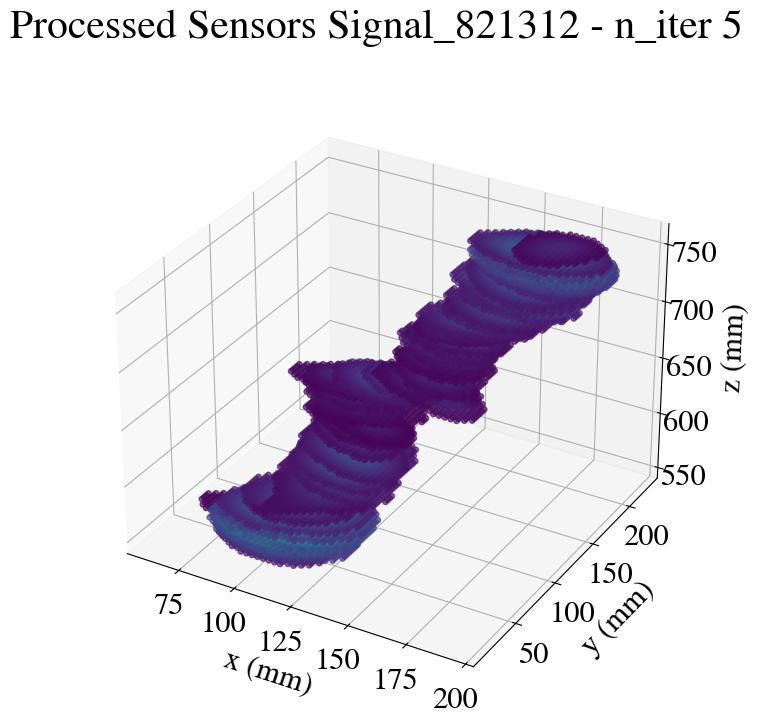

EVENT 821312
Total energy 1.55 MeV



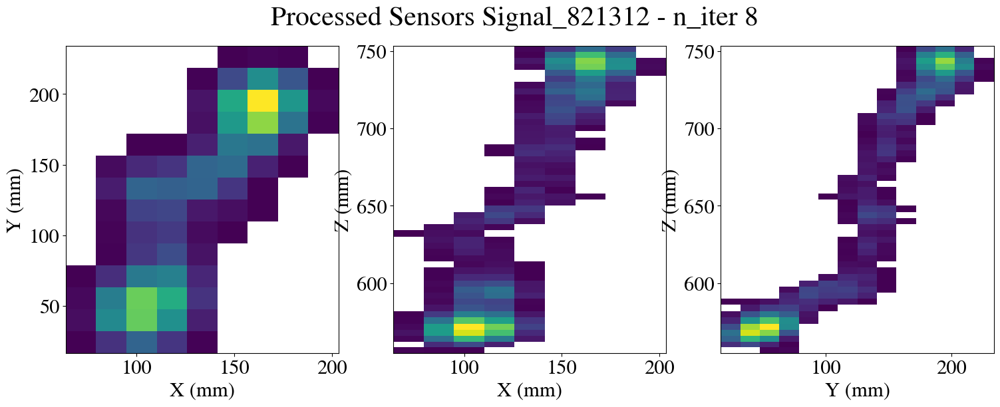

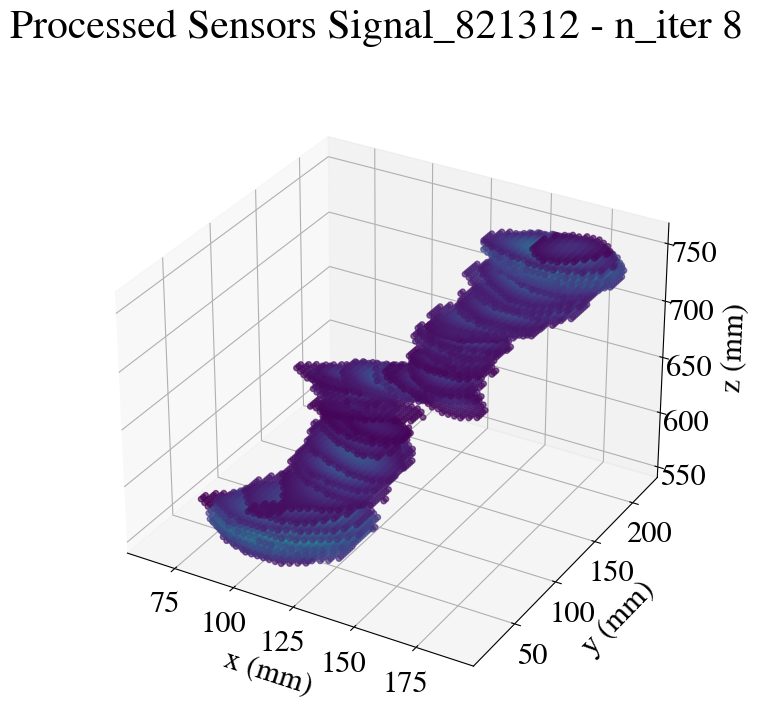

EVENT 821312
Total energy 1.55 MeV



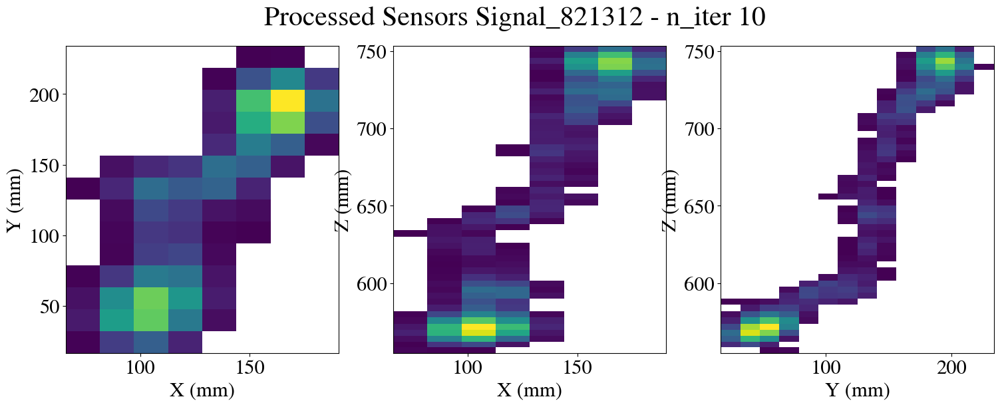

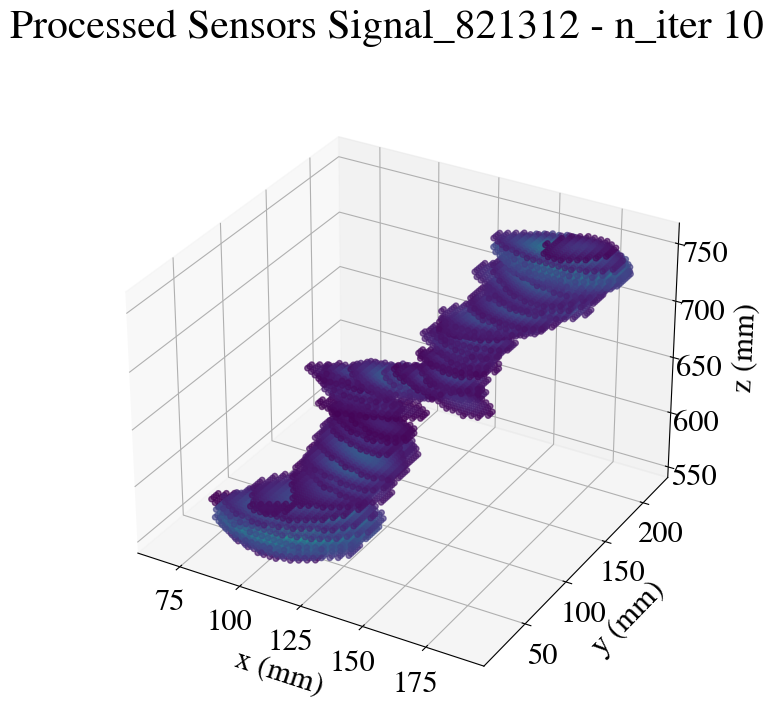

EVENT 821312
Total energy 1.55 MeV



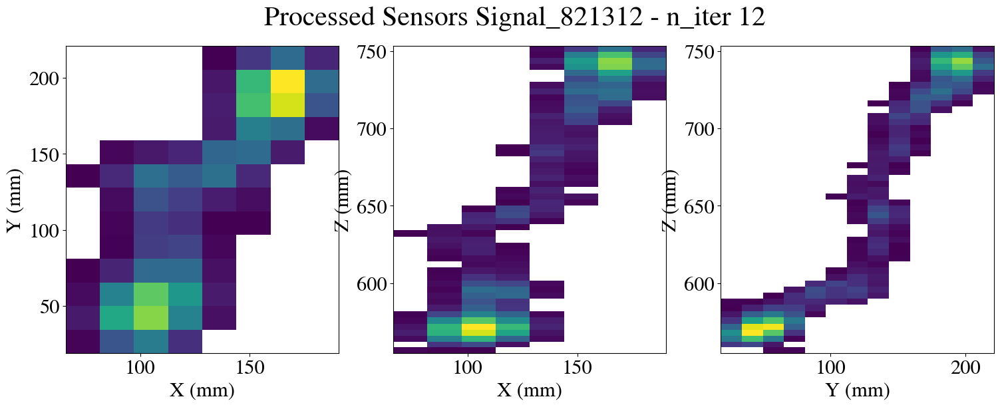

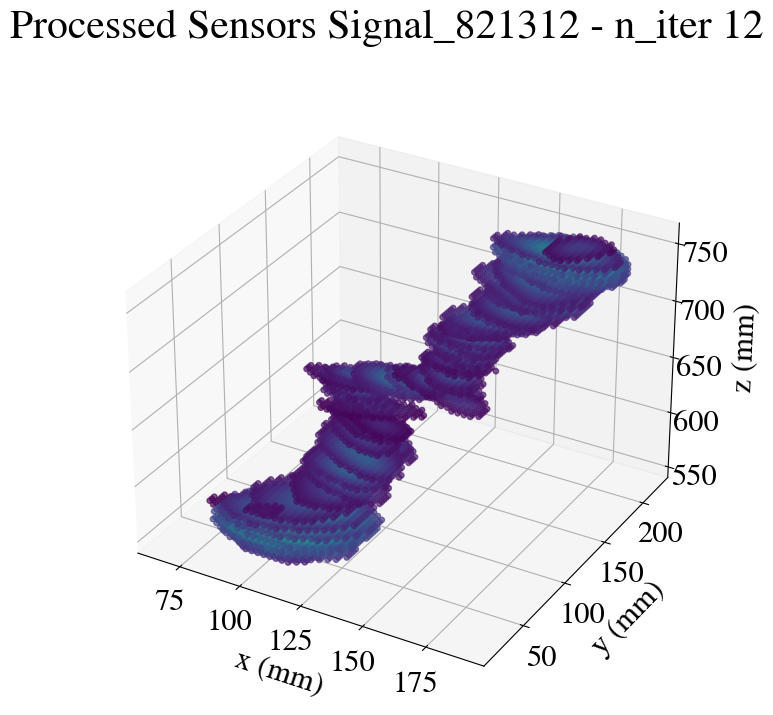

EVENT 821312
Total energy 1.55 MeV



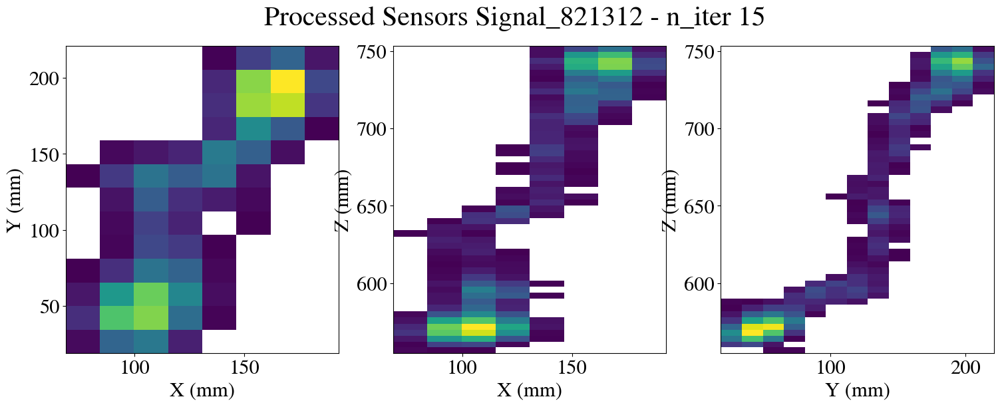

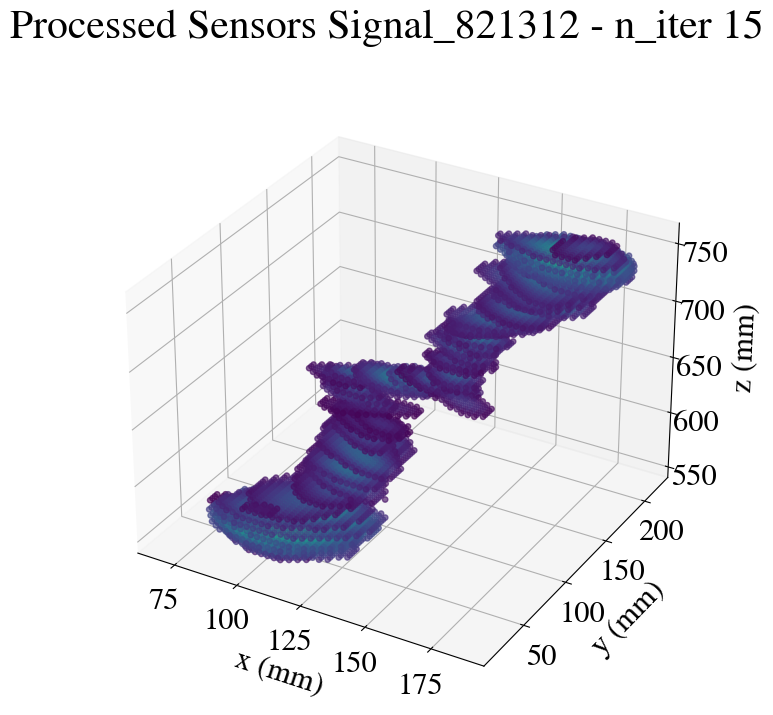

EVENT 821312
Total energy 1.55 MeV



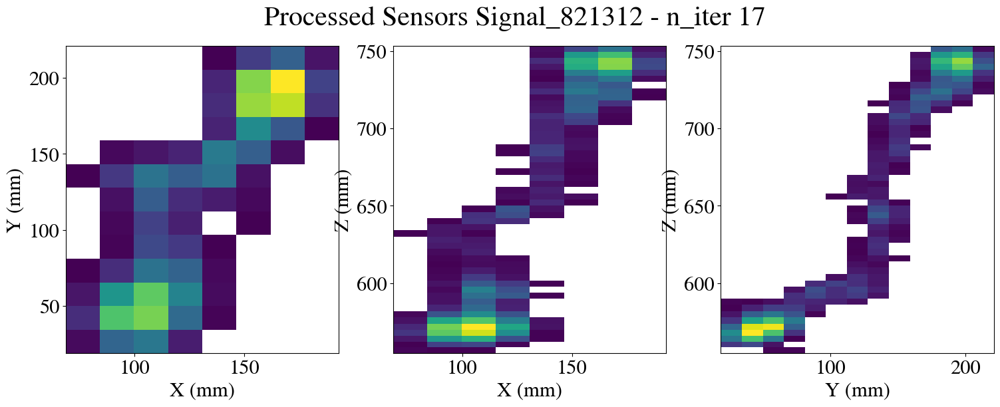

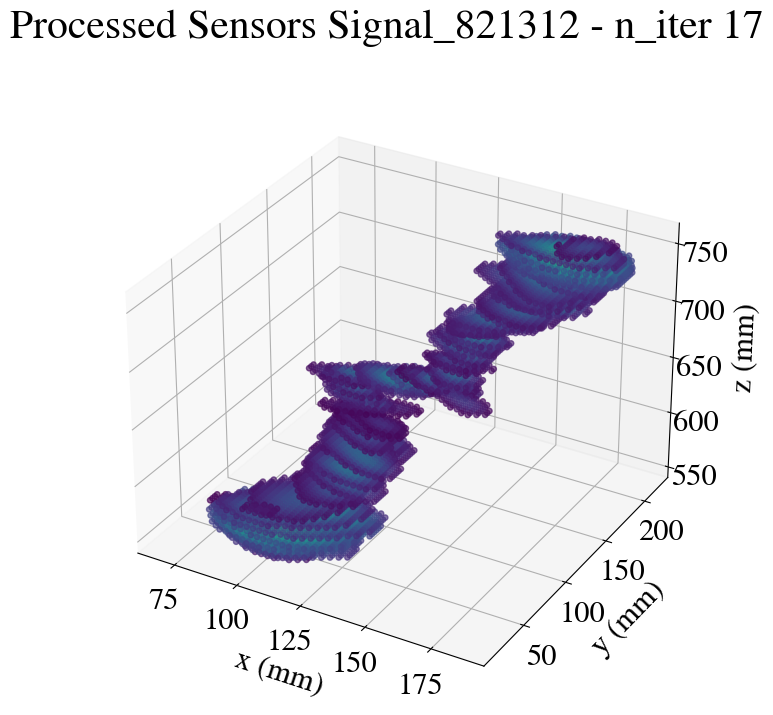

EVENT 821312
Total energy 1.55 MeV



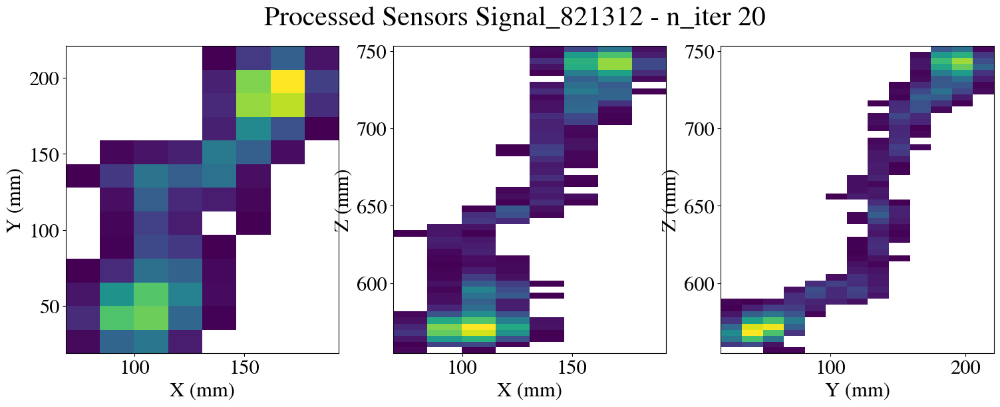

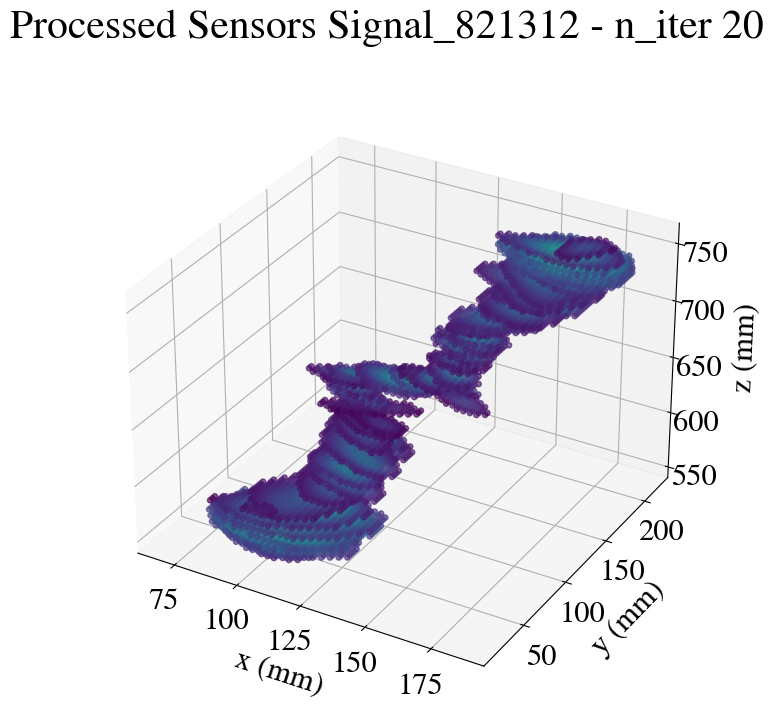

EVENT 821312
Total energy 1.55 MeV



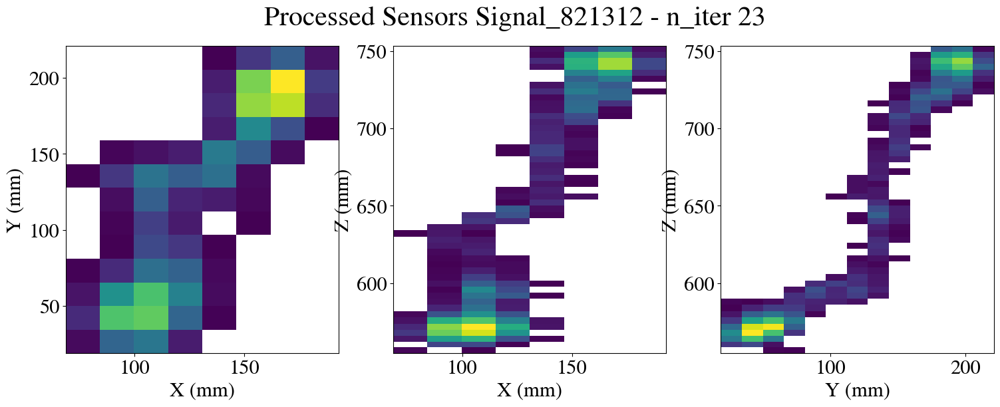

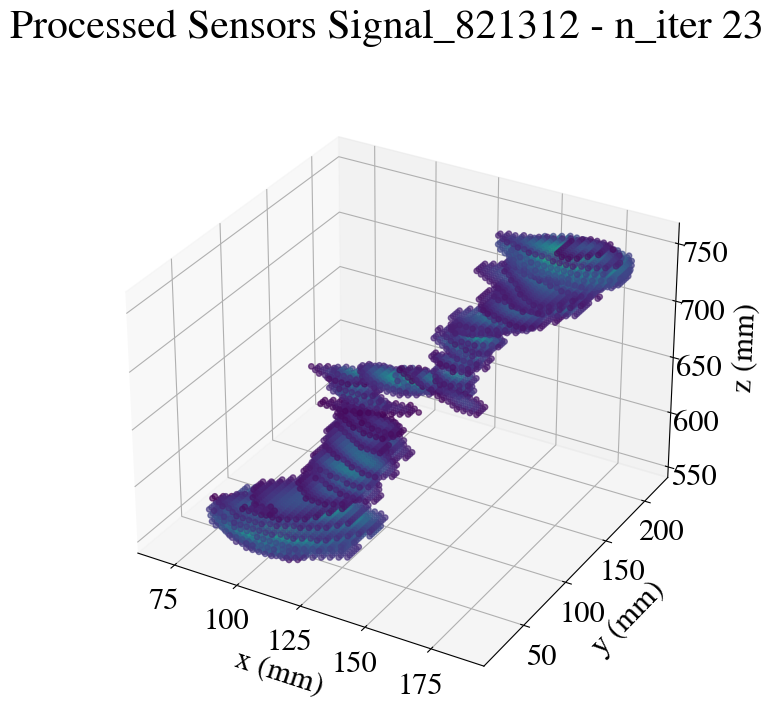

EVENT 821312
Total energy 1.55 MeV



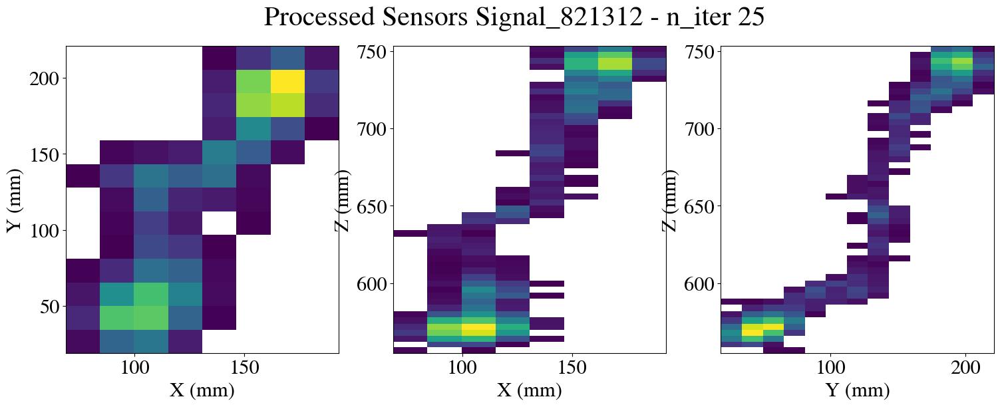

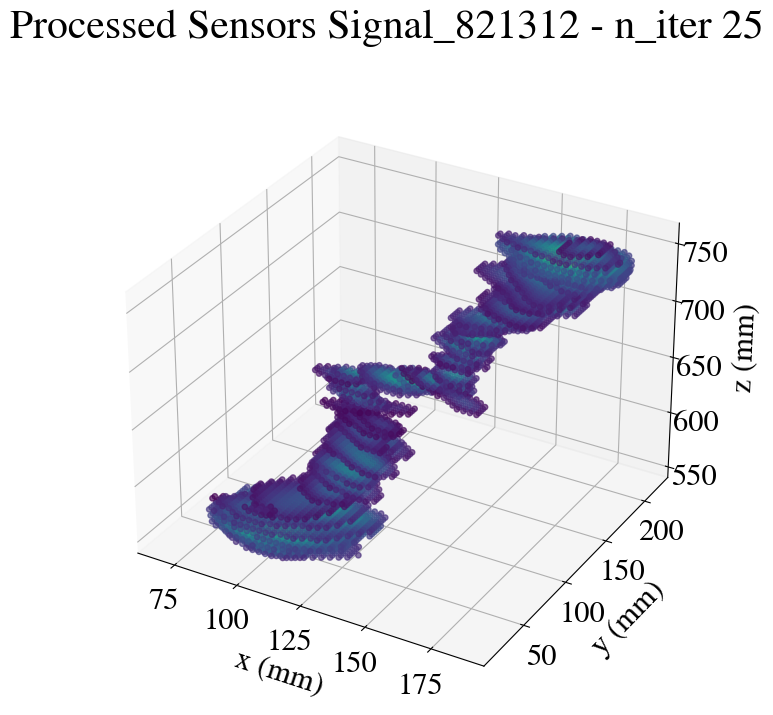

EVENT 821312
Total energy 1.55 MeV



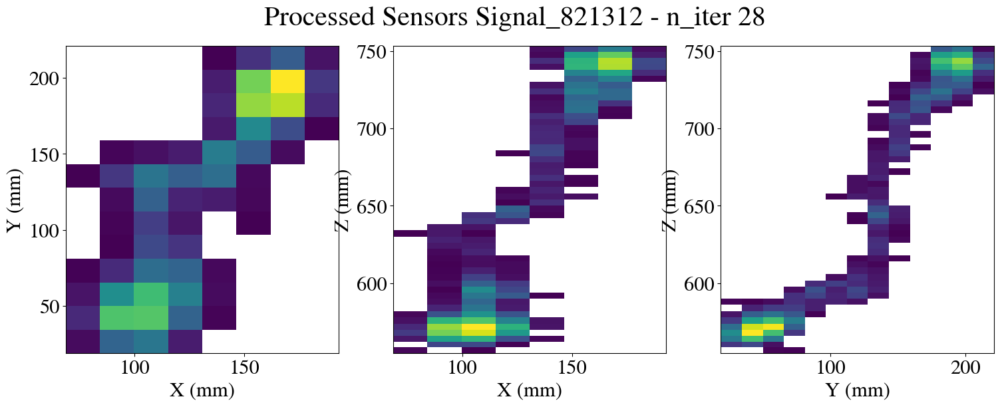

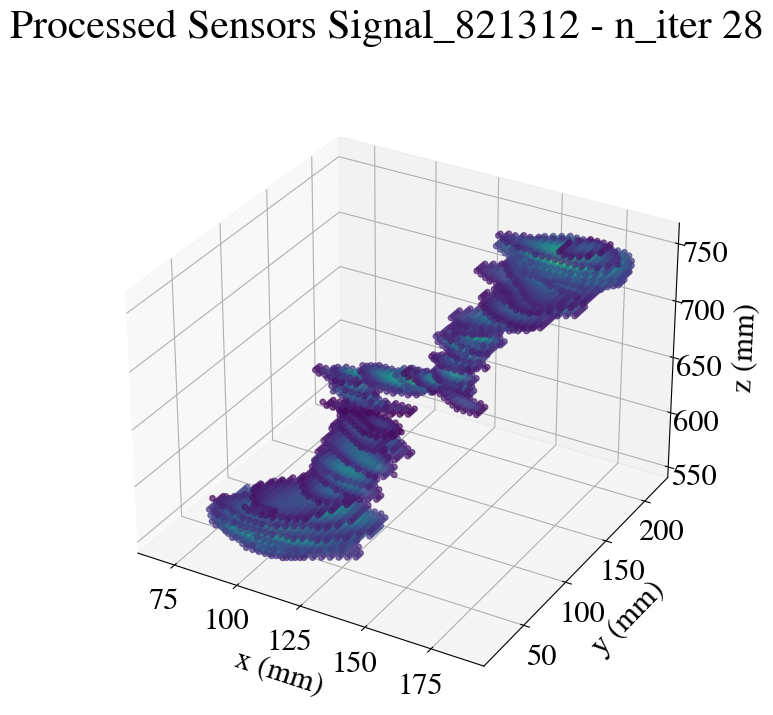

EVENT 821312
Total energy 1.55 MeV



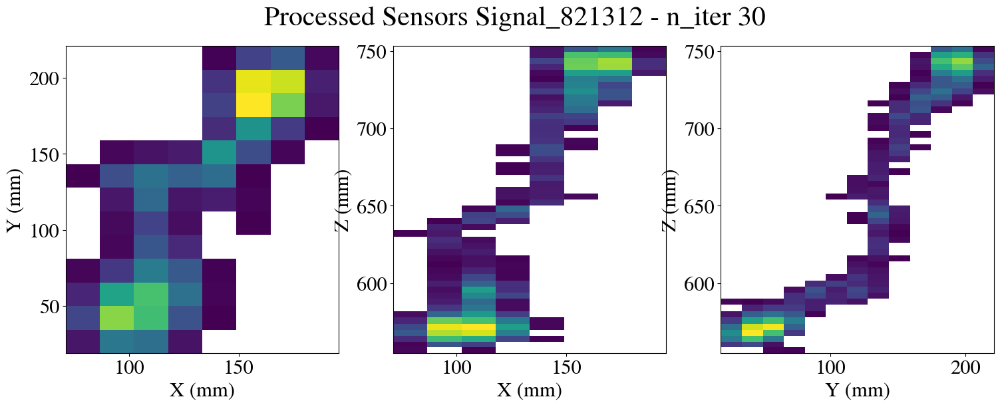

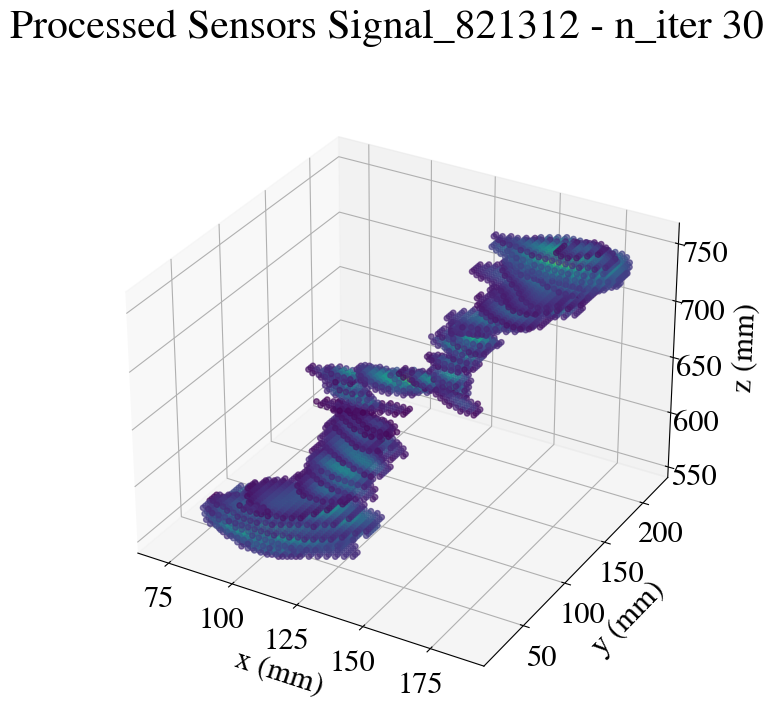

In [107]:
# make path for plot
Path(f'gif/iter/{evt_DEP}').mkdir(parents = True, exist_ok = True)

plotter(DEP, evt_DEP, show = False)
plt.savefig(f'gif/iter/{evt_DEP}/{evt_DEP}_0_iter.png')
plt.show()
# plot em all
for key in reco_niter:
    hits = reco_niter[key]
    
    plotter(hits, evt_DEP, cut_n_drop=False, show = False, deconv = True)
    plt.suptitle(f'Processed Sensors Signal_{evt_DEP} - n_iter {key}', fontsize=30)
    plt.savefig(f'gif/iter/{evt_DEP}/{evt_DEP}_{key}_iter.png')
    plt.show()

    plotter_3d(hits, evt_DEP, cut_n_drop = False, show = False, clrbar = False)
    plt.suptitle(f'Processed Sensors Signal_{evt_DEP} - n_iter {key}', fontsize=30)
    plt.savefig(f'gif/iter/{evt_DEP}/3D/{evt_DEP}_{key}_iter.png')
    plt.show()

In [106]:
files = [f for f in os.listdir(f'gif/iter/{evt_DEP}/') if os.path.isfile(os.path.join(f'gif/iter/{evt_DEP}/', f))]
#sort files in a human manner
files.sort(key=func.alphanum_key)
images = []
for filename in files:
    images.append(imageio.imread(f'gif/iter/{evt_DEP}/' + filename))

print("Creating gif...")
gif_name = f'plots/n_iter/{evt_DEP}_niter.gif'
imageio.mimsave(gif_name, images, loop = 0, fps = 3)

/tmp/ipykernel_1339722/96179549.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(f'gif/iter/{evt_DEP}/' + filename))


Creating gif...


In [109]:
# 3d one
files = [f for f in os.listdir(f'gif/iter/{evt_DEP}/3D') if os.path.isfile(os.path.join(f'gif/iter/{evt_DEP}/3D', f))]
#sort files in a human manner
files.sort(key=func.alphanum_key)
images = []
for filename in files:
    images.append(imageio.imread(f'gif/iter/{evt_DEP}/3D/' + filename))

print("Creating gif...")
gif_name = f'plots/n_iter/{evt_DEP}_niter_3D.gif'
imageio.mimsave(gif_name, images, loop = 0, fps = 3)

/tmp/ipykernel_1339722/2382355088.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(f'gif/iter/{evt_DEP}/3D/' + filename))


Creating gif...


# rotate the bastard

In [13]:
n_iter = 12


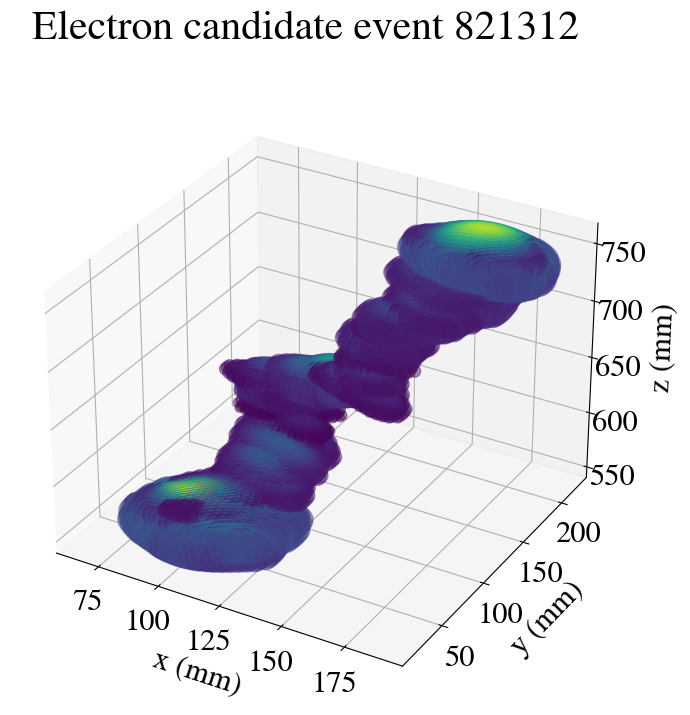

,event,npeak,X,Y,Z,E,Xpeak,Ypeak
0,821312,0,66.125,58.825,554.65275,0.000008,65.586248,63.112552
1,821312,0,66.125,61.325,554.65275,0.000010,65.586248,63.112552
2,821312,0,66.125,63.825,554.65275,0.000009,65.586248,63.112552
3,821312,0,68.625,56.325,554.65275,0.000010,65.586248,63.112552
4,821312,0,68.625,58.825,554.65275,0.000016,65.586248,63.112552
...,...,...,...,...,...,...,...,...
9536,821312,0,178.625,206.325,753.31800,0.000036,65.586248,63.112552
9537,821312,0,178.625,208.825,753.31800,0.000026,65.586248,63.112552
9538,821312,0,181.125,198.825,753.31800,0.000025,65.586248,63.112552
9539,821312,0,181.125,201.325,753.31800,0.000026,65.586248,63.112552


In [14]:
plotter_3d(reco_niter[n_iter], evt_DEP, cut_n_drop = False, show = True, clrbar = False, alpha = 0.45, min_s = 1, max_s = 2000)

In [15]:
Path(f'gif/rotate/{evt_DEP}').mkdir(parents = True, exist_ok = True)


rotation_space = np.linspace(0, 359, 180, endpoint = True)

for i in rotation_space:
    plotter_3d(reco_niter[n_iter], evt_DEP, cut_n_drop = False, show = False, clrbar = False, alpha = 0.45, min_s = 1, max_s = 2000)
    ax = plt.gca()
    ax.view_init(20, -i)
    plt.savefig(f'gif/rotate/{evt_DEP}/evt_{evt_DEP}_{i}.png')
    plt.close()

In [17]:
files = [f for f in os.listdir(f'gif/rotate/{evt_DEP}/') if os.path.isfile(os.path.join(f'gif/rotate/{evt_DEP}/', f))]
#sort files in a human manner
files.sort(key=func.alphanum_key)
images = []
for filename in files:
    images.append(imageio.imread(f'gif/rotate/{evt_DEP}/' + filename))

print("Creating gif...")
gif_name = f'plots/n_iter/rotating_track_evt_{evt_DEP}_niter_12.gif'
imageio.mimsave(gif_name, images, loop = 0, fps = 24)

/tmp/ipykernel_2111039/2389578389.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(f'gif/rotate/{evt_DEP}/' + filename))


Creating gif...


In [ ]:
#soph_file = f'/home/e78368jw/Documents/NEXT_CODE/next_misc/energy_topology_study/testing_data/sophronia_' + str(FILE_NUMBER) + '_208Tl.h5'
soph_file = f'/gluster/data/next/files/TOPOLOGY_John/N100_data/15107'
#soph_file = f'files/15107_formatted.h5'
soph_hdst = dstio.load_dst(soph_file, 'RECO', 'Events')#CHITS/lowTh
display(soph_hdst)
print(soph_hdst.event.min(), soph_hdst.event.max())
print(soph_hdst.event.unique())

,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep
0,275,1.742935e+09,3,15.761644,-65.178616,1,474.475,-32.475,0.0,0.0,159.434125,5.256973,-2.562765,-1.0,-0.000016,-1,-1.0
1,275,1.742935e+09,3,15.761644,-65.178616,1,-265.925,399.925,0.0,0.0,161.691000,7.539444,-3.154945,-1.0,NaN,-1,-1.0
2,275,1.742935e+09,3,15.761644,-65.178616,1,181.025,414.975,0.0,0.0,161.691000,6.790727,-2.841638,-1.0,-0.000018,-1,-1.0
3,275,1.742935e+09,3,15.761644,-65.178616,1,-281.475,-279.275,0.0,0.0,165.937000,5.034613,17.929243,-1.0,0.000097,-1,-1.0
4,275,1.742935e+09,3,15.761644,-65.178616,1,212.125,-325.425,0.0,0.0,167.834250,5.043945,159.742005,-1.0,0.000833,-1,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28931633,1074912,1.742949e+09,0,-107.260682,-11.486680,1,196.575,214.825,0.0,0.0,1144.738500,5.329231,5.760224,-1.0,0.000029,-1,-1.0
28931634,1074912,1.742949e+09,0,-107.260682,-11.486680,1,-389.325,214.325,0.0,0.0,1147.229500,8.552230,-6.227441,-1.0,-0.000040,-1,-1.0
28931635,1074912,1.742949e+09,0,-107.260682,-11.486680,1,-65.775,-356.525,0.0,0.0,1147.229500,6.788672,-4.943279,-1.0,-0.000026,-1,-1.0
28931636,1074912,1.742949e+09,0,-107.260682,-11.486680,1,88.725,492.725,0.0,0.0,1147.229500,6.301342,-4.588421,-1.0,NaN,-1,-1.0


33 1543639
[    275     590     597 ...  658923 1074513 1074912]


### Select an event for deconvolution testing

,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep
783,590,1.742935e+09,0,170.053075,19.509000,1,134.375,-155.375,0.0,0.0,244.018125,6.640182,33.996483,-1.0,0.000169,-1,-1.0
784,590,1.742935e+09,0,170.053075,19.509000,1,-281.475,184.225,0.0,0.0,245.920875,5.729830,260.625525,-1.0,0.001343,-1,-1.0
785,590,1.742935e+09,0,170.053075,19.509000,1,-126.975,-94.175,0.0,0.0,247.727875,5.271235,73.489001,-1.0,0.000366,-1,-1.0
786,590,1.742935e+09,0,170.053075,19.509000,1,42.075,-402.175,0.0,0.0,247.727875,5.856732,81.651722,-1.0,0.000437,-1,-1.0
787,590,1.742935e+09,0,170.053075,19.509000,1,288.875,-1.375,0.0,0.0,247.727875,6.474606,90.265825,-1.0,0.000450,-1,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28924787,1204930,1.742951e+09,6,125.191215,105.517228,1,273.325,75.375,0.0,0.0,801.502000,5.385585,7.495042,-1.0,0.000038,-1,-1.0
28924788,1204930,1.742951e+09,6,125.191215,105.517228,1,366.625,45.275,0.0,0.0,805.328250,5.903188,25.404111,-1.0,0.000137,-1,-1.0
28924789,1204930,1.742951e+09,6,125.191215,105.517228,1,-204.725,276.025,0.0,0.0,807.028125,5.212553,7.642974,-1.0,0.000039,-1,-1.0
28924790,1204930,1.742951e+09,6,125.191215,105.517228,1,335.525,415.475,0.0,0.0,807.028125,5.986324,8.777526,-1.0,NaN,-1,-1.0


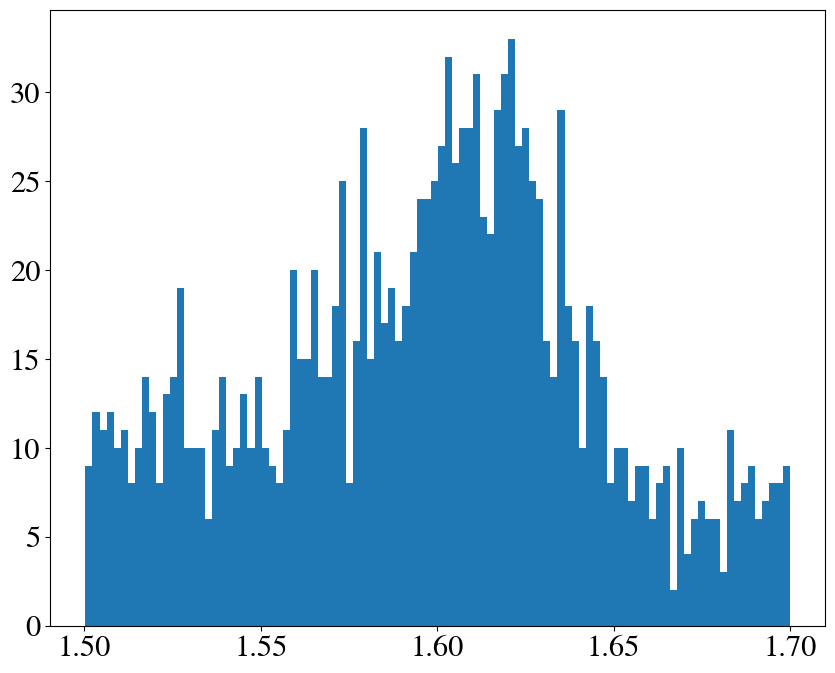

In [221]:
# select an event between 1.5 and 1.7 MeV
Ec_sums = soph_hdst.groupby('event').Ec.sum()
filtered_event_ids = Ec_sums[(Ec_sums > 1.5) & (Ec_sums < 1.7)].index
high_E_evts = soph_hdst[soph_hdst.event.isin(filtered_event_ids)]
display(high_E_evts)
#evt_num = soph_hdst[soph_hdst.event[high_E_evts]]
plt.hist(high_E_evts.groupby('event').Ec.sum(), bins=100)
plt.show()

In [222]:

evt = high_E_evts.event.unique()[200]

evt_of_interest = high_E_evts[high_E_evts.event == evt]
display(evt_of_interest)

,event,time,npeak,Xpeak,Ypeak,nsipm,X,Y,Xrms,Yrms,Z,Q,E,Qc,Ec,track_id,Ep
3852045,664547,1.742944e+09,0,-25.944658,106.489995,1,-96.875,446.075,0.0,0.0,133.830125,6.903777,371.443453,-1.0,0.002370,-1,-1.0
3852046,664547,1.742944e+09,0,-25.944658,106.489995,1,-19.125,-263.225,0.0,0.0,135.676375,5.427360,100.248193,-1.0,0.000512,-1,-1.0
3852047,664547,1.742944e+09,0,-25.944658,106.489995,1,-65.775,307.125,0.0,0.0,135.676375,14.104372,260.520363,-1.0,0.001304,-1,-1.0
3852048,664547,1.742944e+09,0,-25.944658,106.489995,1,-65.775,322.675,0.0,0.0,135.676375,13.135036,242.615869,-1.0,0.001229,-1,-1.0
3852049,664547,1.742944e+09,0,-25.944658,106.489995,1,-50.225,307.125,0.0,0.0,135.676375,13.184890,243.536704,-1.0,0.001220,-1,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3854427,664547,1.742944e+09,0,-25.944658,106.489995,1,-112.425,183.725,0.0,0.0,501.480625,5.748628,9.437135,-1.0,0.000046,-1,-1.0
3854428,664547,1.742944e+09,0,-25.944658,106.489995,1,-96.875,183.725,0.0,0.0,501.480625,8.434617,13.846542,-1.0,0.000067,-1,-1.0
3854429,664547,1.742944e+09,0,-25.944658,106.489995,1,-81.325,199.275,0.0,0.0,501.480625,7.591368,12.462236,-1.0,0.000060,-1,-1.0
3854430,664547,1.742944e+09,0,-25.944658,106.489995,1,366.625,415.475,0.0,0.0,501.480625,5.206170,8.546618,-1.0,NaN,-1,-1.0


In [223]:
PSF_PATH = '/gluster/data/next/notebooks/john_books/PSF_creation/eutropia_14675_PSF_merged_sectors.h5'
datatype = 'data'
detector_db = '/gluster/data/next/software/IC_311024/IC/invisible_cities/database/localdb.NEXT100DB.sqlite3'
run_number = 15107

deconv_params = dict(
  q_cut           = 6, #5 for 6mm  - 5 for 6mm
  drop_dist       = [16, 16],
  psf_fname       = PSF_PATH,     
  e_cut           = 0.3, #15 for 6mm  - 15 for 6mm
  n_iterations    = 30, #150 for 6mm  - 150 for 6mm
  iteration_tol   = 1e-9,
  sample_width    = [15.55, 15.55],
  bin_size        = [ 5,  5],
  diffusion       = (1., 0.2),
  n_dim           = 2,
  deconv_mode     = DeconvolutionMode.joint,
  satellite_params = dict(satellite_start_iter = 100,
                          satellite_max_size   = 25,
                          e_cut                = 0.9,
                          cut_type             = CutType.rel),
  energy_type     = HitEnergy.Ec,
  cut_type        = CutType.rel)
 # inter_method    = InterpolationMethod.cubic)
#satellite_params = dict(satellite_start_iter = 75,
#                        satellite_max_size   = 3,
#                        e_cut                = 0.2,
#                        cut_type             = CutType.rel)
                
deconv_params_   = {k : v for k, v in deconv_params.items() if k not in ['q_cut', 'drop_dist']}

# Couple of functions used in beersheba.

cut_sensors       = beerfun.cut_over_Q   (deconv_params['q_cut'    ], ['E', 'Ec'])
drop_sensors      = beerfun.drop_isolated(deconv_params['drop_dist'], ['E', 'Ec'])


EVENT 664547
Total energy 1.65 MeV

Time spent in cut_over_Q: 0.015393257141113281 s
Time spent in drop_isolated: 0.0602421760559082 s


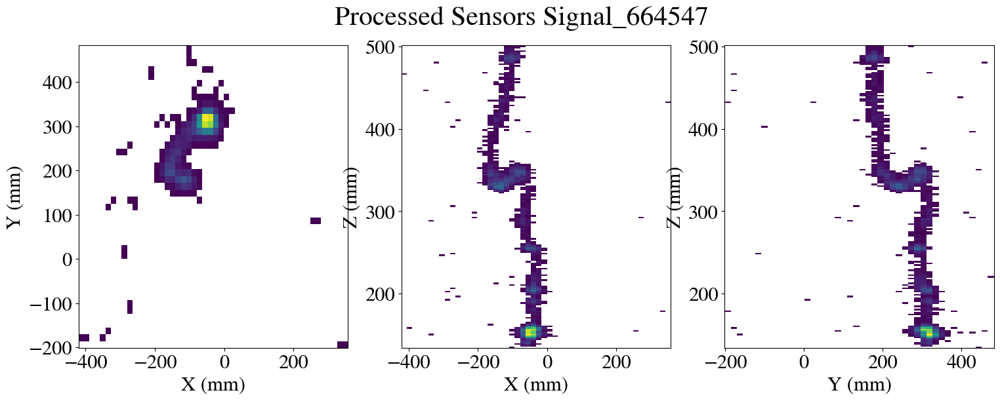

In [224]:
print('======================')
print(f'EVENT {evt}')
print(f'Total energy {evt_of_interest.Ec.sum():.2f} MeV')
print('======================\n')
hits_cut = coref.timefunc(cut_sensors)(evt_of_interest.copy())
hits_drop = coref.timefunc(drop_sensors)(hits_cut.copy())
pitch = 15.55
# then applying transformations to convert to 'SiPM outputs'
fig, axes = plt.subplots(1, 3, figsize=(18, 6))


xx = np.arange(hits_drop.X.min(), hits_drop.X.max() + pitch, pitch)
yy = np.arange(hits_drop.Y.min(), hits_drop.Y.max() + pitch, pitch)
zz = hits_cut.Z.unique()

axes[0].hist2d(hits_drop.X, hits_drop.Y, bins=[xx, yy], weights=hits_drop.Q, cmin=0.0001);
axes[0].set_xlabel('X (mm)');
axes[0].set_ylabel('Y (mm)');

axes[1].hist2d(hits_drop.X, hits_drop.Z, bins=[xx, zz], weights=hits_drop.Q, cmin=0.0001);
axes[1].set_xlabel('X (mm)');
axes[1].set_ylabel('Z (mm)');


axes[2].hist2d(hits_drop.Y, hits_drop.Z, bins=[yy, zz], weights=hits_drop.Q, cmin=0.0001);
axes[2].set_xlabel('Y (mm)');
axes[2].set_ylabel('Z (mm)');

fig.suptitle('Processed Sensors Signal_' + str(evt), fontsize=30)
plt.savefig(f'plots/hits_{evt}.pdf')



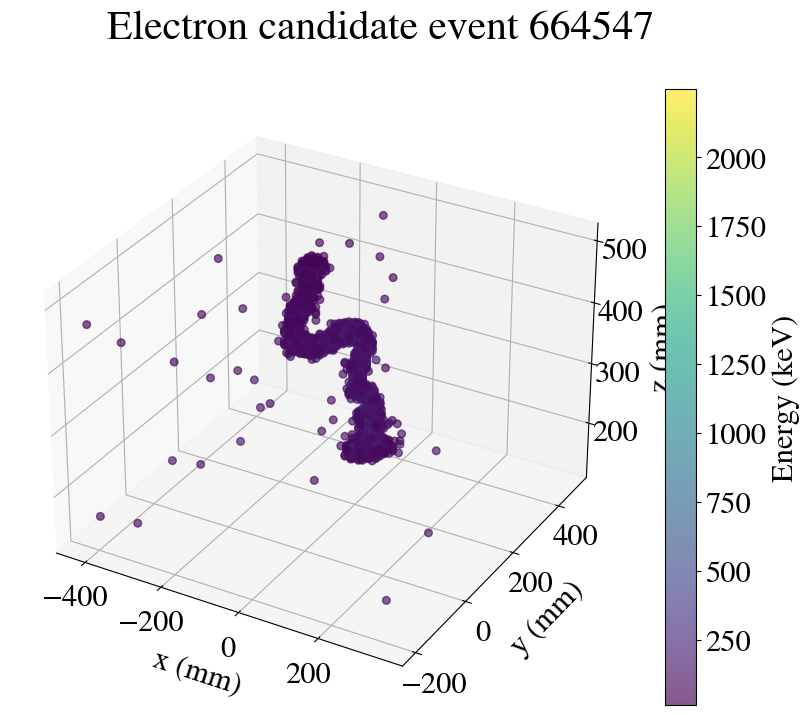

In [225]:
# plot

xt = hits_drop.X
yt = hits_drop.Y
zt = hits_drop.Z
et = hits_drop.E

fig = plt.figure()
#fig.suptitle('3D post deconvolution ' + str(evt), fontsize=30)
fig.suptitle(f'Electron candidate event {evt}', fontsize=30)
ax = fig.add_subplot(111, projection='3d')



ets = et > 0 # eliminate small things for measurement

#p = ax.scatter(x[em], y[em], z[em], c=e[em], alpha=0.3, cmap='viridis')
#plt_sphere([(-track.blob2_x.values[0], -track.blob2_y.values[0], -track.blob2_z.values[0])], [blobR])
p = ax.scatter([xt[ets]], yt[ets], zt[ets], c=et[ets], alpha=0.65, cmap='viridis', s = 30)#, s = et[ets])
#q = ax.scatter(xt, yt, zt, alpha = 0.3, color = 'red')

# overlay the blobs and their radii

cb = fig.colorbar(p, ax=ax)
cb.set_label('Energy (keV)')


ax.set_xlabel('\nx (mm)')
ax.set_ylabel('\ny (mm)')
ax.set_zlabel('\nz (mm)')

#ax.set_xlim([-300, -100])
#ax.set_ylim([250, 450])
#ax.set_zlim([1600, 1800])
#ax.view_init(20, -150)

#plt.savefig(f'gif_making/deconv/angle_{i}.png')
plt.savefig(f'plots/hits_3d_{evt}.pdf')
plt.show()


### Run the iterator

In [226]:
for iterN in np.arange(10, deconv_params_['n_iterations'], 10):
    deconv_params_['n_iterations'] = iterN
    deconvolver = beerfun.deconvolve_signal(DataSiPM(detector_db, run_number), **deconv_params_)
    print(f'{iterN} iterations')
    hits_deco = coref.timefunc(deconvolver)(hits_drop.copy())


10 iterations
Time spent in apply_deconvolution: 11.183794736862183 s
20 iterations
Time spent in apply_deconvolution: 17.11146640777588 s


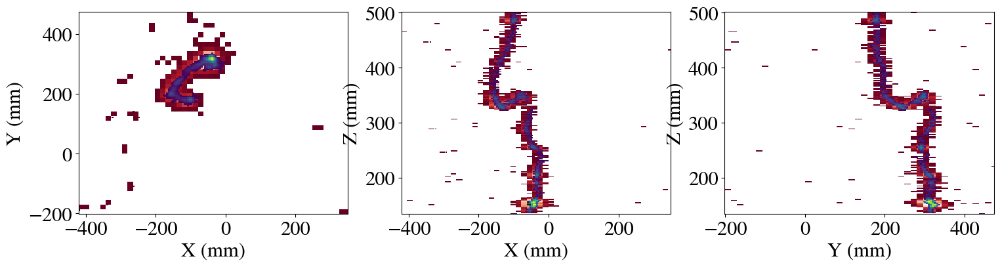

In [227]:
fig, axes = plt.subplots(1, 3, figsize=(18, 4))

hits = hits_drop
# then applying transformations to convert to 'SiPM outputs'

xx = np.arange(hits.X.min(), hits.X.max() + pitch, pitch)
yy = np.arange(hits.Y.min(), hits.Y.max() + pitch, pitch)
zz = hits.Z.unique()

axes[0].hist2d(hits.X, hits.Y, bins=[xx, yy], weights=hits.Q, cmin=0.0001, cmap = 'RdGy');
axes[0].set_xlabel('X (mm)');
axes[0].set_ylabel('Y (mm)');

axes[1].hist2d(hits.X, hits.Z, bins=[xx, zz], weights=hits.Q, cmin=0.0001, cmap = 'RdGy');
axes[1].set_xlabel('X (mm)');
axes[1].set_ylabel('Z (mm)');


axes[2].hist2d(hits.Y, hits.Z, bins=[yy, zz], weights=hits.Q, cmin=0.0001, cmap = 'RdGy');
axes[2].set_xlabel('Y (mm)');
axes[2].set_ylabel('Z (mm)');

#fig.suptitle('Sensors Signal', fontsize=30)


xx = np.arange(hits.X.min(), hits.X.max(), 5)
yy = np.arange(hits.Y.min(), hits.Y.max(), 5)

zz = hits.Z.unique()
    
axes[0].hist2d(hits_deco.X, hits_deco.Y, bins=[xx, yy], weights=hits_deco.E, cmin=0.0001);
if (datatype == 'MC'):
    axes[0].scatter(xt, yt,  alpha=0.1, color='red')
axes[0].set_xlabel('X (mm)');
axes[0].set_ylabel('Y (mm)');

axes[1].hist2d(hits_deco.X, hits_deco.Z, bins=[xx, zz], weights=hits_deco.E, cmin=0.0001);
if (datatype == 'MC'):
    axes[1].scatter(xt, zt,  alpha=0.1, color='red')
axes[1].set_xlabel('X (mm)');
axes[1].set_ylabel('Z (mm)');

axes[2].hist2d(hits_deco.Y, hits_deco.Z, bins=[yy, zz], weights=hits_deco.E, cmin=0.0001);
if (datatype == 'MC'):
    axes[2].scatter(yt, zt,  alpha=0.1, color='red')
axes[2].set_xlabel('Y (mm)');
axes[2].set_ylabel('Z (mm)');

Text(0.5, 0.98, 'Deconvolved signal evt 664547')

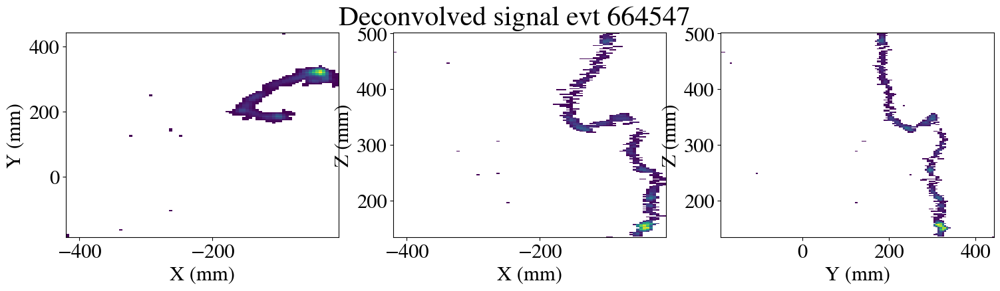

In [228]:
fig, axes = plt.subplots(1, 3, figsize=(18, 4))

xx = np.arange(hits_deco.X.min(), hits_deco.X.max(), 5)
yy = np.arange(hits_deco.Y.min(), hits_deco.Y.max(), 5)

zz = hits.Z.unique()
    
axes[0].hist2d(hits_deco.X, hits_deco.Y, bins=[xx, yy], weights=hits_deco.E, cmin=0.0001);
if (datatype == 'MC'):
    axes[0].scatter(xt, yt,  alpha=0.1, color='red')
axes[0].set_xlabel('X (mm)');
axes[0].set_ylabel('Y (mm)');

axes[1].hist2d(hits_deco.X, hits_deco.Z, bins=[xx, zz], weights=hits_deco.E, cmin=0.0001);
if (datatype == 'MC'):
    axes[1].scatter(xt, zt,  alpha=0.1, color='red')
axes[1].set_xlabel('X (mm)');
axes[1].set_ylabel('Z (mm)');

axes[2].hist2d(hits_deco.Y, hits_deco.Z, bins=[yy, zz], weights=hits_deco.E, cmin=0.0001);
if (datatype == 'MC'):
    axes[2].scatter(yt, zt,  alpha=0.1, color='red')
axes[2].set_xlabel('Y (mm)');
axes[2].set_ylabel('Z (mm)');

fig.suptitle(f'Deconvolved signal evt {evt}', fontsize=30)

In [229]:
x = hits_deco.X

y = hits_deco.Y
z = hits_deco.Z
e = hits_deco.E#*1000

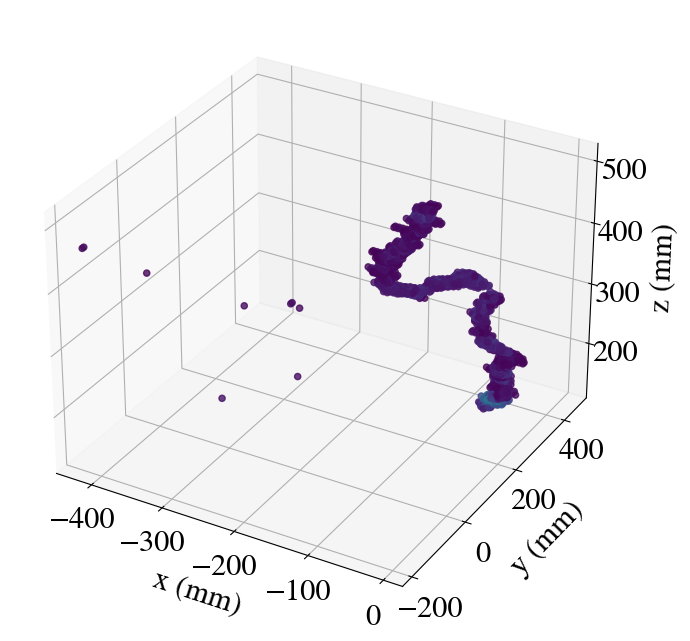

In [230]:
from matplotlib import colors


em = e > 0 # eliminate small things for measurement


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')


# annihilate deposits under y = 1650
xq = x[em]
yq = y[em]
zq = z[em]
eq = e[em]

ym = z > 0

#p = ax.scatter(xq[ym], yq[ym], zq[ym], c=eq[ym], alpha=0.08, cmap='viridis')
p = ax.scatter(xq[ym], yq[ym], zq[ym], c=eq[ym], alpha=0.8, cmap='viridis')
#p = ax.scatter(x, y, z, c=e, alpha=0.3, cmap='viridis')
#cb = fig.colorbar(p, ax=ax)
#cb.set_label('Energy (keV)')


ax.set_xlabel('\nx (mm)')
ax.set_ylabel('\ny (mm)')
ax.set_zlabel('\nz (mm)')

#ax.view_init(20, 50)

plt.show()

### test isaura mechanics

/tmp/ipykernel_2020530/84322669.py:53: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


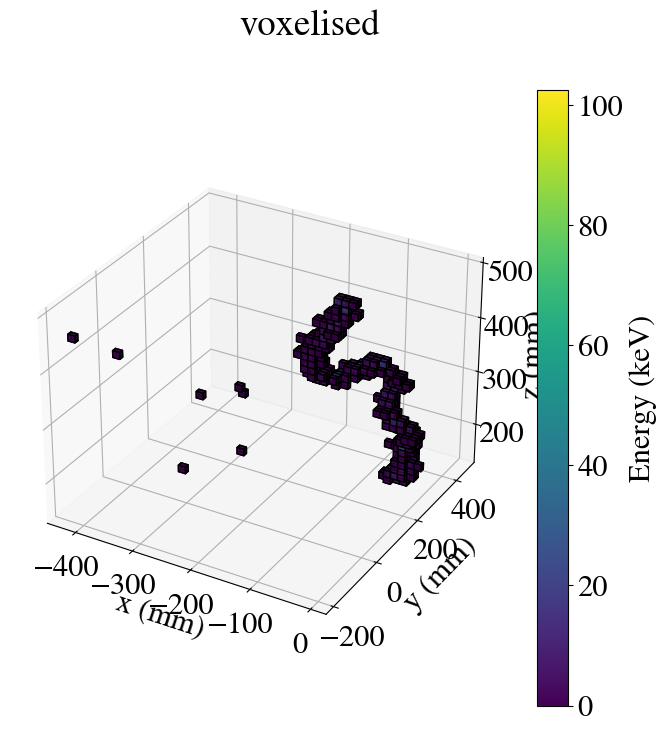

In [231]:
plot_voxels(hits_deco)

In [215]:
topological_creator = track_blob_info_creator_extractor((12 * units.mm, 12 * units.mm, 12 * units.mm), # voxel size
                                                        False,
                                                        10 * units.keV,
                                                        3,
                                                        27 * units.mm, # blobR
                                                        100000
                                                        )

In [216]:
deco_collection = hits_from_df(hits_deco)
#print(deco_collection)
print(deco_collection.keys())
print(deco_collection[evt])


dict_keys([664547])
HitCollectionHit list:<Hit : npeak = 0.0 z = 133.830125 XYpeak = -25.944658043293337, 106.48999503738034 E = 0.00011306003356713032 Ec = -1 Ep = -1 trackid = -1 cluster =< nsipm = -1 Q = 0.00011306003356713032
                    xy = xy(x=-100.125, y=447.575) 3dHit = Hit(-100.125, 447.575, 133.830125, E=0.00011306003356713032)  > ><Hit : npeak = 0.0 z = 133.830125 XYpeak = -25.944658043293337, 106.48999503738034 E = 0.00010368600268763393 Ec = -1 Ep = -1 trackid = -1 cluster =< nsipm = -1 Q = 0.00010368600268763393
                    xy = xy(x=-95.125, y=442.575) 3dHit = Hit(-95.125, 442.575, 133.830125, E=0.00010368600268763393)  > ><Hit : npeak = 0.0 z = 133.830125 XYpeak = -25.944658043293337, 106.48999503738034 E = 0.0003167229487539963 Ec = -1 Ep = -1 trackid = -1 cluster =< nsipm = -1 Q = 0.0003167229487539963
                    xy = xy(x=-95.125, y=447.575) 3dHit = Hit(-95.125, 447.575, 133.830125, E=0.0003167229487539963)  > ><Hit : npeak = 0.0 z = 135.67

In [217]:
df, track_hitc, out_of_map = topological_creator(deco_collection[evt])

In [218]:
display(df)

,event,trackID,energy,length,numb_of_voxels,numb_of_hits,numb_of_tracks,x_min,y_min,z_min,...,blob1_z,blob2_x,blob2_y,blob2_z,eblob1,eblob2,ovlp_blob_energy,vox_size_x,vox_size_y,vox_size_z
